# Preprocessing for complex PDF

## Setting
 - Auto Reload
 - path for utils

In [29]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [30]:
import sys, os

def add_python_path(module_path):
    if os.path.abspath(module_path) not in sys.path:
        sys.path.append(os.path.abspath(module_path))
        print(f"python path: {os.path.abspath(module_path)} is added")
    else:
        print(f"python path: {os.path.abspath(module_path)} already exists")
    print("sys.path: ", sys.path)

module_path = "../../.."
add_python_path(module_path)

python path: /home/ec2-user/SageMaker/aws-ai-ml-workshop-kr/genai/aws-gen-ai-kr already exists
sys.path:  ['/home/ec2-user/SageMaker/aws-ai-ml-workshop-kr/genai/aws-gen-ai-kr/20_applications/02_qa_chatbot/01_preprocess_docs', '/home/ec2-user/anaconda3/envs/python3/lib/python310.zip', '/home/ec2-user/anaconda3/envs/python3/lib/python3.10', '/home/ec2-user/anaconda3/envs/python3/lib/python3.10/lib-dynload', '', '/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages', '/home/ec2-user/SageMaker/aws-ai-ml-workshop-kr/genai/aws-gen-ai-kr']


## 1. Create Bedrock client

In [31]:
import json
import boto3
from pprint import pprint
from termcolor import colored
from utils import bedrock, print_ww
from utils.bedrock import bedrock_info

### ---- ⚠️ Un-comment and edit the below lines as needed for your AWS setup ⚠️ ----
- os.environ["AWS_DEFAULT_REGION"] = "<REGION_NAME>"  # E.g. "us-east-1"
- os.environ["AWS_PROFILE"] = "<YOUR_PROFILE>"
- os.environ["BEDROCK_ASSUME_ROLE"] = "<YOUR_ROLE_ARN>"  # E.g. "arn:aws:..."
- os.environ["BEDROCK_ENDPOINT_URL"] = "<YOUR_ENDPOINT_URL>"  # E.g. "https://..."

In [32]:
boto3_bedrock = bedrock.get_bedrock_client(
    assumed_role=os.environ.get("BEDROCK_ASSUME_ROLE", None),
    endpoint_url=os.environ.get("BEDROCK_ENDPOINT_URL", None),
    region=os.environ.get("AWS_DEFAULT_REGION", None),
)

print (colored("\n== FM lists ==", "green"))
pprint (bedrock_info.get_list_fm_models(verbose=False))

Create new client
  Using region: None
  Using profile: None
boto3 Bedrock client successfully created!
bedrock-runtime(https://bedrock-runtime.us-east-1.amazonaws.com)

== FM lists ==
{'Claude-Instant-V1': 'anthropic.claude-instant-v1',
 'Claude-V1': 'anthropic.claude-v1',
 'Claude-V2': 'anthropic.claude-v2',
 'Claude-V2-1': 'anthropic.claude-v2:1',
 'Claude-V3-Haiku': 'anthropic.claude-3-haiku-20240307-v1:0',
 'Claude-V3-Sonnet': 'anthropic.claude-3-sonnet-20240229-v1:0',
 'Cohere-Embeddings-En': 'cohere.embed-english-v3',
 'Cohere-Embeddings-Multilingual': 'cohere.embed-multilingual-v3',
 'Command': 'cohere.command-text-v14',
 'Command-Light': 'cohere.command-light-text-v14',
 'Jurassic-2-Mid': 'ai21.j2-mid-v1',
 'Jurassic-2-Ultra': 'ai21.j2-ultra-v1',
 'Llama2-13b-Chat': 'meta.llama2-13b-chat-v1',
 'Titan-Embeddings-G1': 'amazon.titan-embed-text-v1',
 'Titan-Text-Embeddings-V2': 'amazon.titan-embed-text-v2:0',
 'Titan-Text-G1': 'amazon.titan-text-express-v1',
 'Titan-Text-G1-Expres

## 2. Titan Embedding 및 LLM 인 Claude-v3-sonnet 모델 로딩

### LLM 로딩 (Claude-v3-sonnet)

In [33]:
from langchain_aws import ChatBedrock
from langchain.callbacks.streaming_stdout import StreamingStdOutCallbackHandler

In [34]:
llm_text = ChatBedrock(
    model_id=bedrock_info.get_model_id(model_name="Claude-V3-Sonnet"),
    client=boto3_bedrock,
    streaming=True,
    callbacks=[StreamingStdOutCallbackHandler()],
    model_kwargs={
        "max_tokens": 2048,
        "stop_sequences": ["\n\nHuman"],
        # "temperature": 0,
        # "top_k": 350,
        # "top_p": 0.999
    }
)
llm_text

ChatBedrock(callbacks=[<langchain_core.callbacks.streaming_stdout.StreamingStdOutCallbackHandler object at 0x7f5df40f8a00>], client=<botocore.client.BedrockRuntime object at 0x7f5defcb23b0>, model_id='anthropic.claude-3-sonnet-20240229-v1:0', model_kwargs={'max_tokens': 2048, 'stop_sequences': ['\n\nHuman']}, streaming=True)

### Embedding 모델 선택

In [35]:
from langchain.embeddings import BedrockEmbeddings

In [36]:
llm_emb = BedrockEmbeddings(
    client=boto3_bedrock,
    model_id=bedrock_info.get_model_id(model_name="Titan-Text-Embeddings-V2")
)
dimension = 1024 #1536
print("Bedrock Embeddings Model Loaded")

Bedrock Embeddings Model Loaded


## 3. 데이터 준비 
- https://python.langchain.com/docs/integrations/document_loaders/unstructured_file
- cleansing: https://unstructured-io.github.io/unstructured/core/cleaning.html

### Extract Text, Table and Image from documents

### 3.1 Unstructured.io

In [37]:
import shutil
from glob import glob
from utils.common_utils import to_pickle, load_pickle
from unstructured.cleaners.core import clean_bullets, clean_extra_whitespace
from langchain_community.document_loaders import UnstructuredFileLoader, UnstructuredAPIFileLoader

#### Parameters
----------
- filename
    - A string defining the target filename path.
- content_type
    - A string defining the file content in MIME type
- file
    - A file-like object using "rb" mode --> open(filename, "rb").
- metadata_filename
    - When file is not None, the filename (string) to store in element metadata. E.g. "foo.txt"
- url
    - The url for a remote document. Pass in content_type if you want partition to treat the document as a specific content_type.
- include_page_breaks
    - If True, the output will include page breaks if the filetype supports it
- strategy
    - The strategy to use for partitioning PDF/image. Uses a layout detection model if set to 'hi_res', otherwise partition simply extracts the text from the document and processes it.
- encoding
    - The encoding method used to decode the text input. If None, utf-8 will be used.
- headers
    - The headers to be used in conjunction with the HTTP request if URL is set.
- skip_infer_table_types
    - The document types that you want to skip table extraction with.
- ssl_verify
    - If the URL parameter is set, determines whether or not partition uses SSL verification in the HTTP request.
- languages
    - The languages present in the document, for use in partitioning and/or OCR. For partitioning <BR>
    image or pdf documents with Tesseract, you'll first need to install the appropriate <BR>
    Tesseract language pack. For other partitions, language is detected using naive Bayesian <BR>
    filter via `langdetect`. Multiple languages indicates text could be in either language. <BR>
    Additional Parameters: <BR>
        - detect_language_per_element <BR>
            - Detect language per element instead of at the document level.
    
- pdf_infer_table_structure
    - If True and strategy=hi_res, any Table Elements extracted from a PDF will include an
    additional metadata field, "text_as_html," where the value (string) is a just a
    transformation of the data into an HTML <table>.
    The "text" field for a partitioned Table Element is always present, whether True or False.
- extract_images_in_pdf
    - Only applicable if `strategy=hi_res`.
    If True, any detected images will be saved in the path specified by
    'extract_image_block_output_dir' or stored as base64 encoded data within metadata fields.
    Deprecation Note: This parameter is marked for deprecation. Future versions will use
    'extract_image_block_types' for broader extraction capabilities.
- extract_image_block_types
    - Only applicable if `strategy=hi_res`.
    Images of the element type(s) specified in this list (e.g., ["Image", "Table"]) will be
    saved in the path specified by 'extract_image_block_output_dir' or stored as base64
    encoded data within metadata fields.
- extract_image_block_to_payload
    - Only applicable if `strategy=hi_res`.
    If True, images of the element type(s) defined in 'extract_image_block_types' will be
    encoded as base64 data and stored in two metadata fields: 'image_base64' and
    'image_mime_type'.
    This parameter facilitates the inclusion of element data directly within the payload,
    especially for web-based applications or APIs.
- extract_image_block_output_dir
    - Only applicable if `strategy=hi_res` and `extract_image_block_to_payload=False`.
    The filesystem path for saving images of the element type(s)
    specified in 'extract_image_block_types'.
- xml_keep_tags
    - If True, will retain the XML tags in the output. Otherwise it will simply extract
    the text from within the tags. Only applies to partition_xml.
- request_timeout
    - The timeout for the HTTP request if URL is set. Defaults to None meaning no timeout and
    requests will block indefinitely.
- hi_res_model_name
    - The layout detection model used when partitioning strategy is set to `hi_res`.
    - https://unstructured-io.github.io/unstructured/best_practices/models.html
- model_name
    - The layout detection model used when partitioning strategy is set to `hi_res`. To be
    deprecated in favor of `hi_res_model_name`.

In [38]:
image_path = "./fig"

#file_path = "./data/complex_pdf/sample.pdf"
file_path = "./data/complex_pdf/school_edu_guide.pdf"
#file_path="./data/complex_pdf/l-test.pdf"
#file_path="./data/complex_pdf/safety-administrator-job-manual.pdf"

In [42]:
if os.path.isdir(image_path): shutil.rmtree(image_path)
os.mkdir(image_path)

loader = UnstructuredFileLoader(
    file_path=file_path,

    chunking_strategy = "by_title",
    mode="elements",

    strategy="hi_res",
    hi_res_model_name="yolox", #"detectron2_onnx", "yolox", "yolox_quantized"

    extract_images_in_pdf=True,
    #skip_infer_table_types='[]', # ['pdf', 'jpg', 'png', 'xls', 'xlsx', 'heic']
    pdf_infer_table_structure=True, ## enable to get table as html using tabletrasformer

    extract_image_block_output_dir=image_path,
    extract_image_block_to_payload=False, ## False: to save image

    max_characters=4096,
    new_after_n_chars=4000,
    combine_text_under_n_chars=2000,

    languages= ["kor+eng"],

    post_processors=[clean_bullets, clean_extra_whitespace]
)

In [43]:
%%time
docs = loader.load()

Some weights of the model checkpoint at microsoft/table-transformer-structure-recognition were not used when initializing TableTransformerForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TableTransformerForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


CPU times: user 3min 59s, sys: 5.97 s, total: 4min 5s
Wall time: 8min 30s


#### Save parsing data

In [ ]:
#to_pickle(docs, "./data/complex_pdf/pickle/parsed_unstructured.pkl")
docs = load_pickle("./data/complex_pdf/pickle/parsed_unstructured.pkl")

In [ ]:
# from distutils.dir_util import copy_tree
# from_file_path = './fig' # 복사할 폴더
# to_file_path = './fig-origin' # 복사 위치
# copy_tree(from_file_path, to_file_path)

In [ ]:
# os.rmdir(from_file_path)
# from_file_path = './fig-origin'
# to_file_path = './fig'
# copy_tree(from_file_path, to_file_path)

In [44]:
tables, texts = [], []

for doc in docs:

    category = doc.metadata["category"]

    if category == "Table": tables.append(doc)
    elif category == "Image": images.append(doc)
    else: texts.append(doc)
    
    images = glob(os.path.join(image_path, "*"))

print (f' # texts: {len(texts)} \n # tables: {len(tables)} \n # images: {len(images)}')

 # texts: 38 
 # tables: 32 
 # images: 93


### 3.1 (Optional) table parsing using Llama-parse

In [45]:
import nest_asyncio
from dotenv import load_dotenv
from llama_parse import LlamaParse
from utils.common_utils import to_markdown
from langchain_community.document_loaders import UnstructuredMarkdownLoader

In [46]:
table_by_llama_parse = False

In [47]:
def api_key():
    os.environ["LLAMA_CLOUD_API_KEY"] = "<your key>"
    nest_asyncio.apply()
    load_dotenv()

In [48]:
if table_by_llama_parse:
    api_key()
    llamaparse_res = LlamaParse(result_type="markdown").load_data(file_path)
    
    ## Save results as markdown and pickle format
    markdown_path = "./data/complex_pdf/pickle/parsed_llamaparse.md"
    to_pickle(llamaparse_res, "./data/complex_pdf/pickle/parsed_llamaparse.pkl")
    to_markdown(llamaparse_res[0].get_content('text'), markdown_path)
    
    ## Load markdown file into Document loader
    loader = UnstructuredMarkdownLoader(
        file_path=markdown_path,
        mode="elements",
        chunking_strategy="by_title",
        #strategy="hi_res",
        max_characters=4096,
        new_after_n_chars=4000,
        combine_text_under_n_chars=2000,
    )
    docs_llamaparse = loader.load()
    docs_table_llamaparse = [doc for doc in docs_llamaparse if doc.metadata["category"] == "Table"]

#### Show as markdown

In [49]:
from IPython.display import Markdown, display

In [50]:
if table_by_llama_parse:
    display(Markdown(markdown_path))

### 3.2 (Optional) table parsing using pyMuPDF

In [51]:
import fitz
from utils.pymupdf import to_markdown_pymupdf

In [52]:
table_by_pymupdf = False

In [53]:
if table_by_pymupdf:
    pymupdf_res = fitz.open(file_path)
    md_text = to_markdown_pymupdf(pymupdf_res) # get markdown string for all pages
    markdown_path = "./data/complex_pdf/pickle/parsed_pymupdf.md"
    to_markdown(md_text, markdown_path)

    ## Load markdown file into Document loader
    loader = UnstructuredMarkdownLoader(
        file_path=markdown_path,
        mode="elements",
        chunking_strategy="by_title",
        #strategy="hi_res",
        max_characters=4096,
        new_after_n_chars=4000,
        combine_text_under_n_chars=2000,
    )
    docs_pymupdf = loader.load()
    docs_table_pymupdf = [doc for doc in docs_pymupdf if doc.metadata["category"] == "Table"]

In [54]:
if table_by_pymupdf:
    display(Markdown(markdown_path))

### 3.3 (Optional) table as image

In [55]:
import cv2
import math
import base64
import numpy as np
from pdf2image import convert_from_path

In [56]:
def image_to_base64(image_path):
    
    with open(image_path, "rb") as image_file:
        encoded_string = base64.b64encode(image_file.read())
        
    return encoded_string.decode('utf-8')

In [57]:
table_as_image = True

### Extract and resize (sclae down) images 
- [reference](https://daewoonginfo.blogspot.com/2019/05/opencv-python-resize.html)
- [image token]: Claude 3 uses this formula tokens = (width px * height px)/750  to calculate # of input tokens associated with Images (for their Visual capabilities). Images bigger than ~1600 tokens would be scaled down

In [58]:
if table_as_image:
    image_tmp_path = os.path.join(image_path, "tmp")
    if os.path.isdir(image_tmp_path): shutil.rmtree(image_tmp_path)
    os.mkdir(image_tmp_path)
    
    # from pdf to image
    pages = convert_from_path(file_path)
    for i, page in enumerate(pages):
        print (f'pdf page {i}, size: {page.size}')    
        page.save(f'{image_tmp_path}/{str(i+1)}.jpg', "JPEG")

    print ("==")

    #table_images = []
    for idx, table in enumerate(tables):
        points = table.metadata["coordinates"]["points"]
        page_number = table.metadata["page_number"]
        layout_width, layout_height = table.metadata["coordinates"]["layout_width"], table.metadata["coordinates"]["layout_height"]

        img = cv2.imread(f'{image_tmp_path}/{page_number}.jpg')
        crop_img = img[math.ceil(points[0][1]):math.ceil(points[1][1]), \
                       math.ceil(points[0][0]):math.ceil(points[3][0])]
        table_image_path = f'{image_path}/table-{idx}.jpg'
        cv2.imwrite(table_image_path, crop_img)
        #table_images.append(table_image_path)

        print (f'unstructured width: {layout_width}, height: {layout_height}')
        print (f'page_number: {page_number}')
        print ("==")

        width, height, _ = crop_img.shape
        image_token = width*height/750
        print (f'image: {table_image_path}, shape: {img.shape}, image_token_for_claude3: {image_token}' )

        ## Resize image
        if image_token > 1500:
            resize_img = cv2.resize(img, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
            print("   - resize_img.shape = {0}".format(resize_img.shape))
            table_image_resize_path = table_image_path.replace(".jpg", "-resize.jpg")
            cv2.imwrite(table_image_resize_path, resize_img)
            os.remove(table_image_path)
            table_image_path = table_image_resize_path

        img_base64 = image_to_base64(table_image_path)
        table.metadata["image_base64"] = img_base64

    if os.path.isdir(image_tmp_path): shutil.rmtree(image_tmp_path)
    #print (f'table_images: {table_images}')
    images = glob(os.path.join(image_path, "*"))
    print (f'images: {images}')

pdf page 0, size: (1653, 2337)
pdf page 1, size: (1653, 2337)
pdf page 2, size: (1653, 2337)
pdf page 3, size: (1653, 2337)
pdf page 4, size: (1653, 2337)
pdf page 5, size: (1653, 2337)
pdf page 6, size: (1653, 2337)
pdf page 7, size: (1653, 2337)
pdf page 8, size: (1653, 2337)
pdf page 9, size: (1653, 2337)
pdf page 10, size: (1653, 2337)
pdf page 11, size: (1653, 2337)
pdf page 12, size: (1653, 2337)
pdf page 13, size: (1653, 2337)
pdf page 14, size: (1653, 2337)
pdf page 15, size: (1653, 2337)
pdf page 16, size: (1653, 2337)
pdf page 17, size: (1653, 2337)
pdf page 18, size: (1653, 2337)
pdf page 19, size: (1653, 2337)
pdf page 20, size: (1653, 2337)
pdf page 21, size: (1653, 2337)
pdf page 22, size: (1653, 2337)
pdf page 23, size: (1653, 2337)
pdf page 24, size: (1653, 2337)
pdf page 25, size: (1653, 2337)
pdf page 26, size: (1653, 2337)
pdf page 27, size: (1653, 2337)
pdf page 28, size: (1653, 2337)
pdf page 29, size: (1653, 2337)
pdf page 30, size: (1653, 2337)
pdf page 31, size:

In [59]:
# # !pip install "camelot-py[base]"
# # !pip install PyPDF2~=2.0
# import camelot
# tables_camleot = camelot.read_pdf("./data/complex_pdf/sample.pdf")
# tables_camleot[0].df.to_html()
# tables_camleot[0].df.to_markdown()

### Summarization of table and image
- BedrockChat with claude3: https://medium.com/@dminhk/building-with-anthropics-claude-3-on-amazon-bedrock-and-langchain-%EF%B8%8F-2b842f9c0ca8

In [60]:
from langchain.schema import Document
from langchain_core.messages import HumanMessage
from langchain.schema.output_parser import StrOutputParser
from langchain_core.prompts import ChatPromptTemplate, HumanMessagePromptTemplate, SystemMessagePromptTemplate

In [61]:
system_prompt = "You are an assistant tasked with describing table and image."
system_message_template = SystemMessagePromptTemplate.from_template(system_prompt)

### For images

In [62]:
import time
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt
import botocore
from utils.common_utils import retry

In [63]:
human_prompt = [
    {
        "type": "image_url",
        "image_url": {
            "url": "data:image/png;base64," + "{image_base64}",
        },
    },
    {
        "type": "text",
        "text": '''
                 Given image, give a concise summary.
                 Don't insert any XML tag such as <text> and </text> when answering.
                 Write in Korean.
        '''
    },
]
human_message_template = HumanMessagePromptTemplate.from_template(human_prompt)

In [64]:
prompt = ChatPromptTemplate.from_messages(
    [
        system_message_template,
        human_message_template
    ]
)

summarize_chain = prompt | llm_text | StrOutputParser()
#summarize_chain = {"image_base64": lambda x:x} | prompt | llm_text | StrOutputParser()

In [65]:
img_info = [image_to_base64(img_path) for img_path in images if os.path.basename(img_path).startswith("figure")]

In [66]:
@retry(total_try_cnt=5, sleep_in_sec=10, retryable_exceptions=(botocore.exceptions.EventStreamError))
def summary_img(summarize_chain, img_base64):

    img = Image.open(BytesIO(base64.b64decode(img_base64)))
    plt.imshow(img)
    plt.show()

    summary = summarize_chain.invoke(
        {
            "image_base64": img_base64
        }
    )

    return summary

INFO:retry-bedrock-invocation:trying summary_img() [1/5]


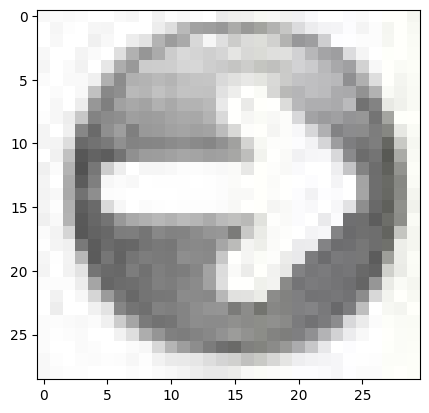

제공된 이미지는 태양의 부분 일식 모습을 보여줍니다. 태양 일부가 달에 의해 가려져 있으며, 태양의 가장자리 일부만 환하게 빛나고 있습니다. 일식 현상 동안 태양의 고리 모양이 아름답게 포착되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 태양의 부분 일식 모습을 보여줍니다. 태양 일부가 달에 의해 가려져 있으며, 태양의 가장자리 일부만 환하게 빛나고 있습니다. 일식 현상 동안 태양의 고리 모양이 아름답게 포착되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
0


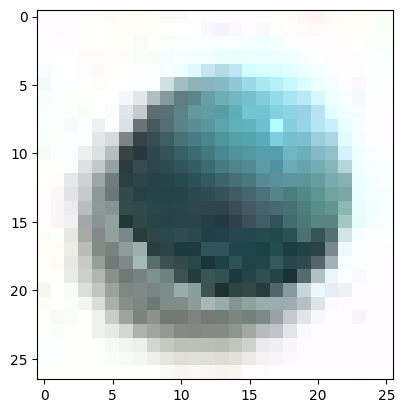

제공된 이미지는 우주에서 촬영한 것으로 보이는 푸른 행성 지구의 모습입니다. 대기가 에워싸고 있으며 구름 무늬와 대륙의 모습이 선명하게 드러납니다. 지구 표면에는 바다, 대륙, 구름 등의 자연 현상이 아름답게 펼쳐져 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 우주에서 촬영한 것으로 보이는 푸른 행성 지구의 모습입니다. 대기가 에워싸고 있으며 구름 무늬와 대륙의 모습이 선명하게 드러납니다. 지구 표면에는 바다, 대륙, 구름 등의 자연 현상이 아름답게 펼쳐져 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
1


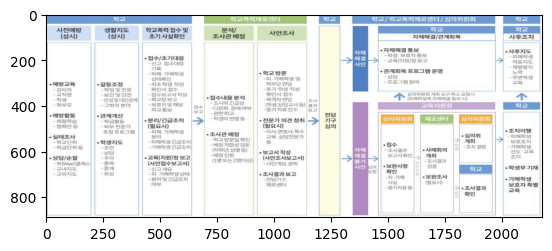

이 이미지는 학교 조직 체계와 각 부서 간의 업무 흐름을 보여주는 도표입니다. 상단에는 학교와 학교폭력대책센터, 학교/학교폭력대책센터/심의위원회 등의 조직 구조가 표시되어 있습니다. 중간에는 주요 업무 프로세스인 자체해결, 자체해결 실패 시 절차, 심의위원회 개최 등의 절차가 순서대로 나열되어 있습니다. 하단에는 심의위원회, 제로센터, 심의위원회 결과에 따른 후속 조치 등이 제시되어 있습니다. 전체적으로 학교 내 사안 발생 시 해결 절차와 관련 부서 간의 업무 연계를 한눈에 파악할 수 있도록 구성되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 학교 조직 체계와 각 부서 간의 업무 흐름을 보여주는 도표입니다. 상단에는 학교와 학교폭력대책센터, 학교/학교폭력대책센터/심의위원회 등의 조직 구조가 표시되어 있습니다. 중간에는 주요 업무 프로세스인 자체해결, 자체해결 실패 시 절차, 심의위원회 개최 등의 절차가 순서대로 나열되어 있습니다. 하단에는 심의위원회, 제로센터, 심의위원회 결과에 따른 후속 조치 등이 제시되어 있습니다. 전체적으로 학교 내 사안 발생 시 해결 절차와 관련 부서 간의 업무 연계를 한눈에 파악할 수 있도록 구성되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
2


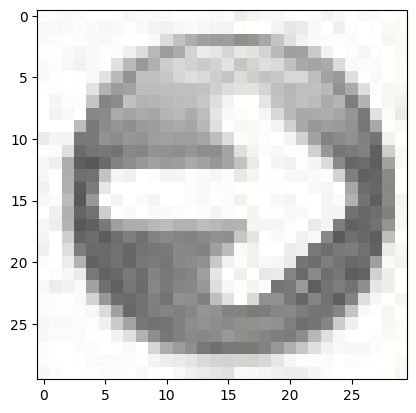

주어진 이미지는 은색 동전 모습을 나타내고 있습니다. 그 중앙에는 부엉이 새 모양의 문양이 있으며, 테두리에는 "싱가포르 공화국" 이라는 글자가 새겨져 있습니다. 이는 싱가포르 화폐 단위인 싱가포르 달러의 동전 모습으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 은색 동전 모습을 나타내고 있습니다. 그 중앙에는 부엉이 새 모양의 문양이 있으며, 테두리에는 "싱가포르 공화국" 이라는 글자가 새겨져 있습니다. 이는 싱가포르 화폐 단위인 싱가포르 달러의 동전 모습으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
3


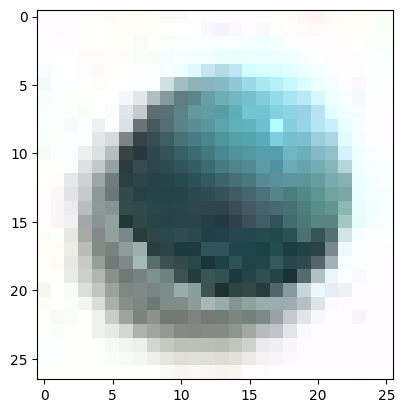

주어진 이미지는 공기 중에서 돌고 있는 두 개의 동전 모습을 보여주고 있습니다. 동전의 양면에는 한국어로 '신뢰받는 기업'이라는 문구가 새겨져 있습니다. 동전의 중심부에는 초록색 원이 있어 기업의 로고 혹은 상징을 나타내는 것으로 보입니다. 전체적으로 기업의 신뢰도와 가치를 상징하는 이미지로 해석할 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 공기 중에서 돌고 있는 두 개의 동전 모습을 보여주고 있습니다. 동전의 양면에는 한국어로 '신뢰받는 기업'이라는 문구가 새겨져 있습니다. 동전의 중심부에는 초록색 원이 있어 기업의 로고 혹은 상징을 나타내는 것으로 보입니다. 전체적으로 기업의 신뢰도와 가치를 상징하는 이미지로 해석할 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
4


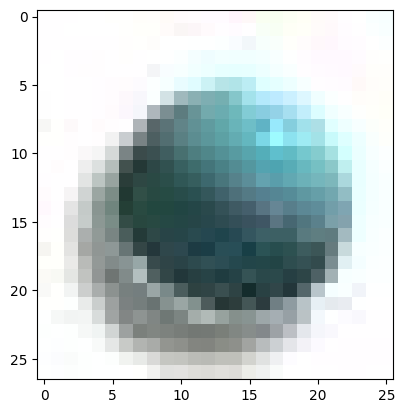

주어진 이미지는 암록색 배경에 둥근 녹색 행성 모양의 지구본과 같은 구체가 있습니다. 구체의 표면은 푸른색과 갈색 등의 다양한 색상으로 이루어져 있어 지구의 대륙과 바다를 연상케 합니다. 이 이미지는 환경이나 지구 보호 등의 주제와 관련이 있을 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 암록색 배경에 둥근 녹색 행성 모양의 지구본과 같은 구체가 있습니다. 구체의 표면은 푸른색과 갈색 등의 다양한 색상으로 이루어져 있어 지구의 대륙과 바다를 연상케 합니다. 이 이미지는 환경이나 지구 보호 등의 주제와 관련이 있을 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
5


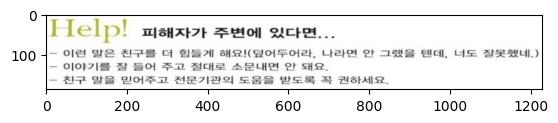

이 이미지는 누군가가 도움이 필요한 상황에서 취할 수 있는 행동들을 알려주고 있습니다. 침착하게 행동하고, 아이를 안전하게 보호하며, 전문가의 도움을 구하라는 내용입니다. 위급 상황에서 대처하는 방법에 대한 조언을 제시하고 있는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 누군가가 도움이 필요한 상황에서 취할 수 있는 행동들을 알려주고 있습니다. 침착하게 행동하고, 아이를 안전하게 보호하며, 전문가의 도움을 구하라는 내용입니다. 위급 상황에서 대처하는 방법에 대한 조언을 제시하고 있는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
6


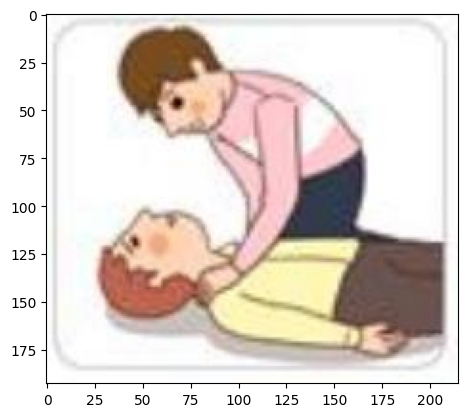

이미지에는 한 여성이 누워 있는 다른 사람을 도와주는 모습이 나타나 있습니다. 여성은 분홍색 상의를 입고 있으며, 바닥에 누운 사람을 향해 구부려져 있습니다. 이는 응급 상황이나 구조 활동을 묘사한 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 한 여성이 누워 있는 다른 사람을 도와주는 모습이 나타나 있습니다. 여성은 분홍색 상의를 입고 있으며, 바닥에 누운 사람을 향해 구부려져 있습니다. 이는 응급 상황이나 구조 활동을 묘사한 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
7


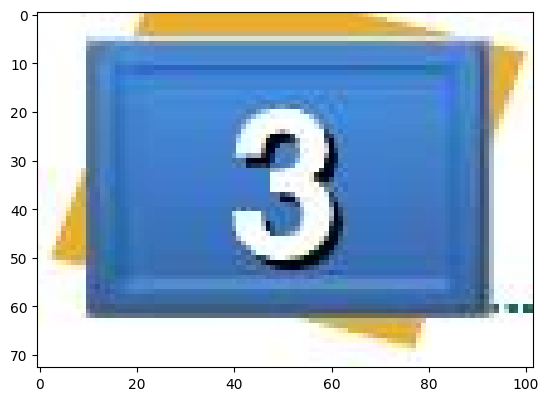

이미지는 파란색 배경에 흰색 숫자 3이 크게 새겨진 작은 칠판을 보여줍니다. 누군가가 칠판을 손에 들고 있는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 파란색 배경에 흰색 숫자 3이 크게 새겨진 작은 칠판을 보여줍니다. 누군가가 칠판을 손에 들고 있는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
8


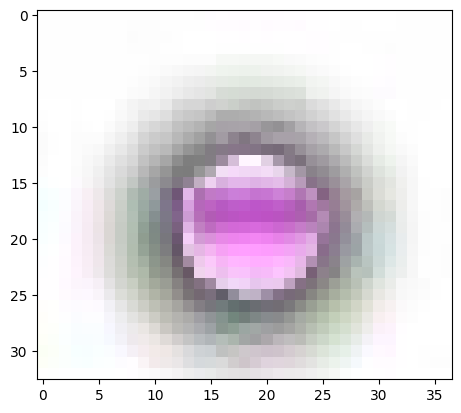

주어진 이미지는 핑크색 배경에 보라색과 하얀색 원형 디자인이 있는 간단한 추상 이미지입니다. 원형 디자인은 중앙에 작은 원형 모양이 있고, 그 주변으로 방사형 모양의 선들이 퍼져 있는 형태입니다. 전체적으로 단순하면서도 세련되고 미니멀한 디자인을 보여주고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 핑크색 배경에 보라색과 하얀색 원형 디자인이 있는 간단한 추상 이미지입니다. 원형 디자인은 중앙에 작은 원형 모양이 있고, 그 주변으로 방사형 모양의 선들이 퍼져 있는 형태입니다. 전체적으로 단순하면서도 세련되고 미니멀한 디자인을 보여주고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
9


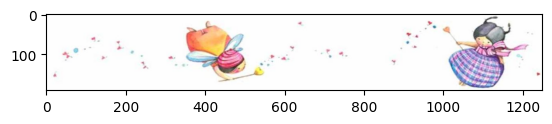

이미지는 마카롱, 과일, 하트 모양의 반짝이와 함께 화려한 컬러로 그려진 작은 천사 캐릭터를 보여줍니다. 그림 속 천사 캐릭터는 활기차고 귀여운 분위기를 자아내며, 사랑과 행복의 메시지를 전달하는 것 같습니다. 전체적으로 밝고 낙관적인 분위기를 자아내는 일러스트레이션입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 마카롱, 과일, 하트 모양의 반짝이와 함께 화려한 컬러로 그려진 작은 천사 캐릭터를 보여줍니다. 그림 속 천사 캐릭터는 활기차고 귀여운 분위기를 자아내며, 사랑과 행복의 메시지를 전달하는 것 같습니다. 전체적으로 밝고 낙관적인 분위기를 자아내는 일러스트레이션입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
10


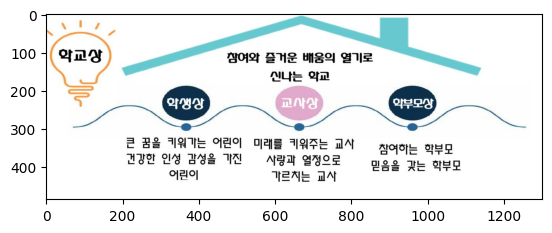

이 이미지는 효과적인 학교생활을 위해 따라야 할 세 가지 영역인 학생상, 교사상, 학부모상을 설명하고 있습니다. 학생은 끊임없이 노력해야 하고, 교사는 학생들의 잠재력을 이끌어내야 하며, 학부모는 자녀의 성장을 지원해야 한다고 강조하고 있습니다. 전반적으로 학생, 교사, 학부모 간의 조화로운 관계와 역할이 중요하다는 메시지를 전달하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 효과적인 학교생활을 위해 따라야 할 세 가지 영역인 학생상, 교사상, 학부모상을 설명하고 있습니다. 학생은 끊임없이 노력해야 하고, 교사는 학생들의 잠재력을 이끌어내야 하며, 학부모는 자녀의 성장을 지원해야 한다고 강조하고 있습니다. 전반적으로 학생, 교사, 학부모 간의 조화로운 관계와 역할이 중요하다는 메시지를 전달하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
11


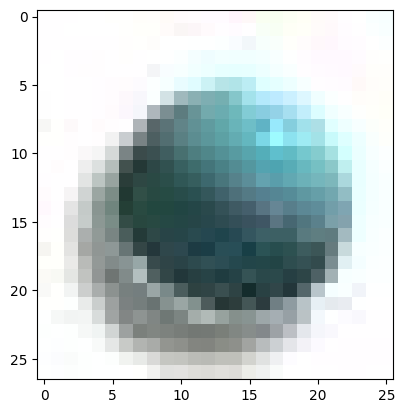

주어진 이미지는 지구본 모양의 에메랄드 녹색 보석을 보여줍니다. 지구본의 대륙과 해양 지형이 보석 색상으로 섬세하게 표현되어 있습니다. 대륙의 지형이 약간 돌출되어 있어 입체감을 주고 있습니다. 전체적으로 단순하면서도 아름다운 디자인의 장신구 보석으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 지구본 모양의 에메랄드 녹색 보석을 보여줍니다. 지구본의 대륙과 해양 지형이 보석 색상으로 섬세하게 표현되어 있습니다. 대륙의 지형이 약간 돌출되어 있어 입체감을 주고 있습니다. 전체적으로 단순하면서도 아름다운 디자인의 장신구 보석으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
12


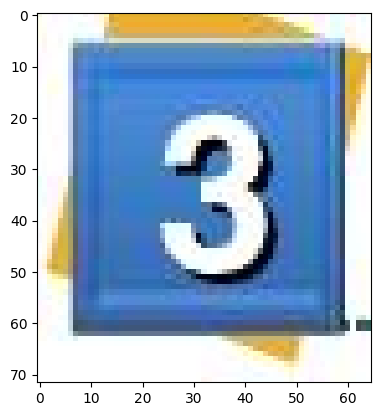

주황색 배경에 큰 흰색 숫자 3이 새겨진 청색 정사각형 프레임이 있는 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색 배경에 큰 흰색 숫자 3이 새겨진 청색 정사각형 프레임이 있는 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
13


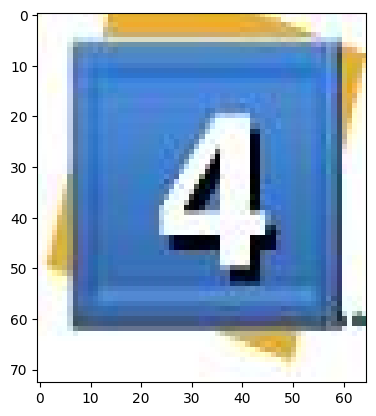

주위 공기와 뚜렷한 대비를 이루는 어두운 바탕에 밝은 파란색으로 숫자 4가 크게 표시된 이미지입니다. 나무나 금속 등의 재질로 보이는 액자가 숫자를 감싸고 있습니다. 이미지는 단순하지만 숫자 4가 강렬하게 강조되어 있어 주목성이 높습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주위 공기와 뚜렷한 대비를 이루는 어두운 바탕에 밝은 파란색으로 숫자 4가 크게 표시된 이미지입니다. 나무나 금속 등의 재질로 보이는 액자가 숫자를 감싸고 있습니다. 이미지는 단순하지만 숫자 4가 강렬하게 강조되어 있어 주목성이 높습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
14


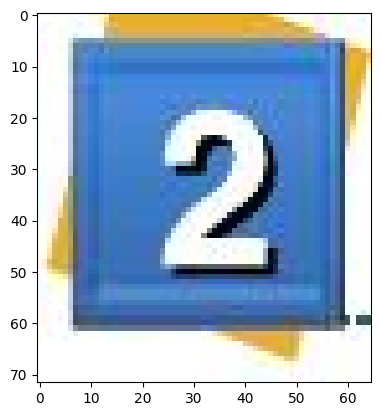

주황색 바탕에 굵은 검정색 숫자 2가 크게 표시된 간단한 이미지입니다. 이 숫자 아이콘은 일반적으로 목록이나 순서를 나타낼 때 사용됩니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색 바탕에 굵은 검정색 숫자 2가 크게 표시된 간단한 이미지입니다. 이 숫자 아이콘은 일반적으로 목록이나 순서를 나타낼 때 사용됩니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
15


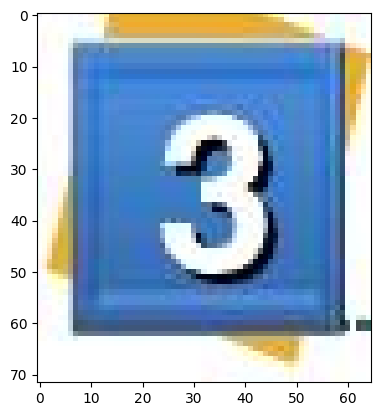

주황색 배경에 큰 숫자 3이 파란색으로 표시된 간단한 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색 배경에 큰 숫자 3이 파란색으로 표시된 간단한 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
16


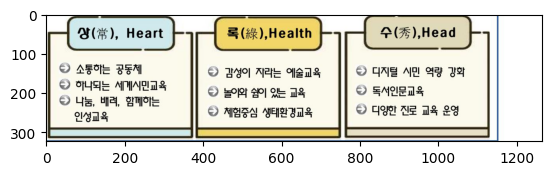

이미지는 세 가지 주제인 마음(심), 건강(녹), 머리(수)에 대한 설명을 제공합니다. 각 주제에 대해 관련된 키워드와 개념들이 나열되어 있습니다. 마음과 관련해서는 소통, 공동체, 하나됨, 세계시민교육, 나눔, 배려, 앎 배우는 인성교육 등이 언급되어 있습니다. 건강과 관련해서는 건강이 자라는 예술피움, 놀이와 쉼의 여유, 제영營身 생체안전교육 등이 제시되어 있습니다. 마지막으로 머리와 관련해서는 디지털 시민 역량 강화, 독서인문교육, 디양한 진로 교육 운영 등이 나와 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 세 가지 주제인 마음(심), 건강(녹), 머리(수)에 대한 설명을 제공합니다. 각 주제에 대해 관련된 키워드와 개념들이 나열되어 있습니다. 마음과 관련해서는 소통, 공동체, 하나됨, 세계시민교육, 나눔, 배려, 앎 배우는 인성교육 등이 언급되어 있습니다. 건강과 관련해서는 건강이 자라는 예술피움, 놀이와 쉼의 여유, 제영營身 생체안전교육 등이 제시되어 있습니다. 마지막으로 머리와 관련해서는 디지털 시민 역량 강화, 독서인문교육, 디양한 진로 교육 운영 등이 나와 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
17


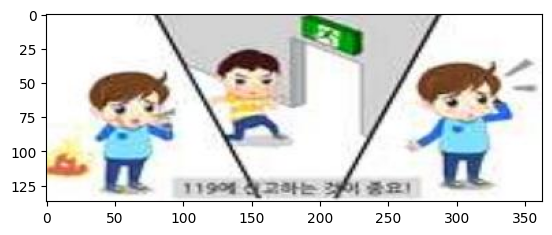

이미지에는 세 명의 아이들이 각기 다른 행동을 취하고 있습니다. 왼쪽 아이는 물건을 내리고 있고, 가운데 아이는 비상구 표지판 아래에서 뛰어가고 있으며, 오른쪽 아이는 구경하는 듯한 모습입니다. 이 장면은 아이들이 위험한 상황에 놓여 있음을 암시합니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 세 명의 아이들이 각기 다른 행동을 취하고 있습니다. 왼쪽 아이는 물건을 내리고 있고, 가운데 아이는 비상구 표지판 아래에서 뛰어가고 있으며, 오른쪽 아이는 구경하는 듯한 모습입니다. 이 장면은 아이들이 위험한 상황에 놓여 있음을 암시합니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
18


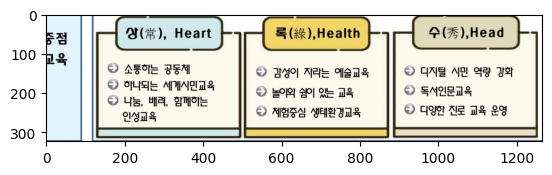

이미지는 한국어로 상(심), 몸(체력), 머리(두부)의 세 가지 범주로 나뉘어져 있습니다. 각 범주에는 관련된 건강 문제나 증상들이 나열되어 있습니다. 상(심)에는 소화기 관련 증상, 아토피, 식욕 부진 등이 포함되어 있고, 몸(체력)에는 근육통, 불면증, 대사 장애 등의 증상이 있습니다. 머리(두부)에는 두통, 눈 건강 문제, 치과 문제 등이 기재되어 있습니다. 이 이미지는 신체 부위별로 겪을 수 있는 다양한 건강 문제들을 요약하여 제시하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 한국어로 상(심), 몸(체력), 머리(두부)의 세 가지 범주로 나뉘어져 있습니다. 각 범주에는 관련된 건강 문제나 증상들이 나열되어 있습니다. 상(심)에는 소화기 관련 증상, 아토피, 식욕 부진 등이 포함되어 있고, 몸(체력)에는 근육통, 불면증, 대사 장애 등의 증상이 있습니다. 머리(두부)에는 두통, 눈 건강 문제, 치과 문제 등이 기재되어 있습니다. 이 이미지는 신체 부위별로 겪을 수 있는 다양한 건강 문제들을 요약하여 제시하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
19


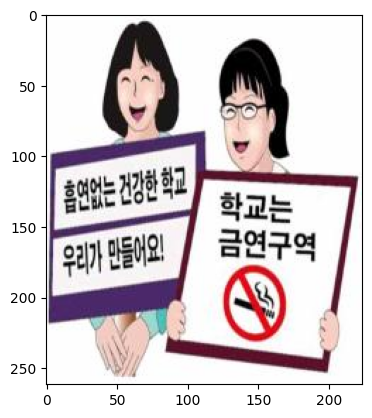

이미지에는 금연과 건강한 생활 습관을 촉구하는 두 명의 여성이 있습니다. 한 여성은 "흡연은 건강을 해치고 습관이 됩니다"라는 문구가 적힌 판넬을 들고 있고, 다른 여성은 "한국은 금연국"이라는 메시지를 전하는 판넬을 들고 있습니다. 이들은 금연의 중요성과 건강한 생활 방식을 강조하는 캠페인에 참여하고 있는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 금연과 건강한 생활 습관을 촉구하는 두 명의 여성이 있습니다. 한 여성은 "흡연은 건강을 해치고 습관이 됩니다"라는 문구가 적힌 판넬을 들고 있고, 다른 여성은 "한국은 금연국"이라는 메시지를 전하는 판넬을 들고 있습니다. 이들은 금연의 중요성과 건강한 생활 방식을 강조하는 캠페인에 참여하고 있는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
20


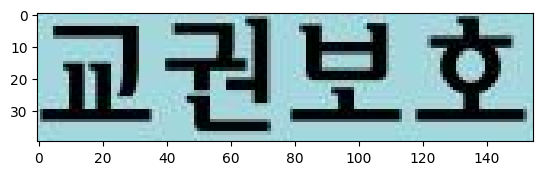

주어진 이미지는 한국어로 "교권보호"라는 녹색 글씨로 된 헤드라인 또는 제목을 보여주고 있습니다. 글씨체는 직선적이고 단순한 스타일로, 배경은 어두운 녹색 계열의 단색으로 되어 있습니다. 이 이미지는 아마도 교사의 권위와 지위를 보호하는 것과 관련된 주제나 캠페인을 상징하는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 한국어로 "교권보호"라는 녹색 글씨로 된 헤드라인 또는 제목을 보여주고 있습니다. 글씨체는 직선적이고 단순한 스타일로, 배경은 어두운 녹색 계열의 단색으로 되어 있습니다. 이 이미지는 아마도 교사의 권위와 지위를 보호하는 것과 관련된 주제나 캠페인을 상징하는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
21


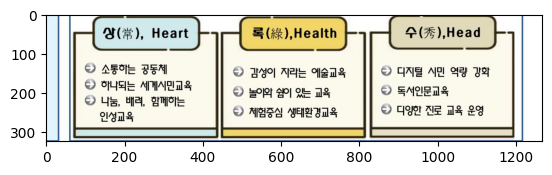

이미지는 마음(심), 건강(녹), 머리(두)와 관련된 증상과 문제점들을 나열하고 있습니다. 마음(심)과 관련해서는 소통 애로, 외로움, 그리고 나쁜 습관들이 있음을 보여줍니다. 건강(녹)에서는 질병, 예술피부, 불안감, 재정적인 생활고를 다룹니다. 마지막으로 머리(두)에서는 디지털 중독, 독서인문교육, 그리고 잘못된 교육 운영 등의 문제점들을 제시하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 마음(심), 건강(녹), 머리(두)와 관련된 증상과 문제점들을 나열하고 있습니다. 마음(심)과 관련해서는 소통 애로, 외로움, 그리고 나쁜 습관들이 있음을 보여줍니다. 건강(녹)에서는 질병, 예술피부, 불안감, 재정적인 생활고를 다룹니다. 마지막으로 머리(두)에서는 디지털 중독, 독서인문교육, 그리고 잘못된 교육 운영 등의 문제점들을 제시하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
22


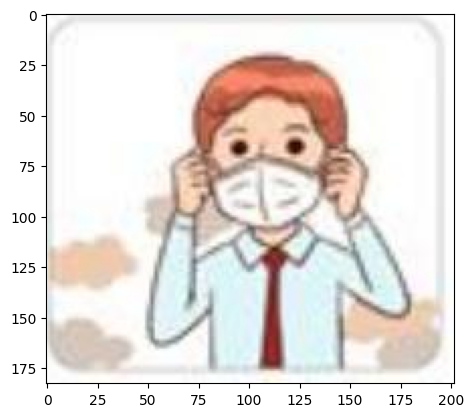

주어진 이미지는 코로나19와 관련된 마스크 착용 안내 이미지로 보입니다. 마스크를 쓴 사람의 모습을 통해 마스크 착용의 중요성을 강조하고 있습니다. 이미지는 단순하고 명확한 메시지를 전달하고자 일러스트 형식으로 제작되었습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 코로나19와 관련된 마스크 착용 안내 이미지로 보입니다. 마스크를 쓴 사람의 모습을 통해 마스크 착용의 중요성을 강조하고 있습니다. 이미지는 단순하고 명확한 메시지를 전달하고자 일러스트 형식으로 제작되었습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
23


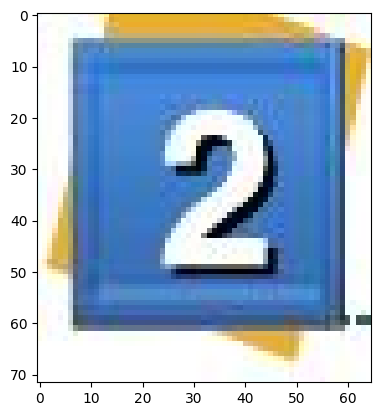

주어진 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 2를 보여줍니다. 숫자는 굵고 단순한 서체로 표시되어 있습니다. 이 이미지는 숫자 또는 순서를 나타내는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 2를 보여줍니다. 숫자는 굵고 단순한 서체로 표시되어 있습니다. 이 이미지는 숫자 또는 순서를 나타내는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
24


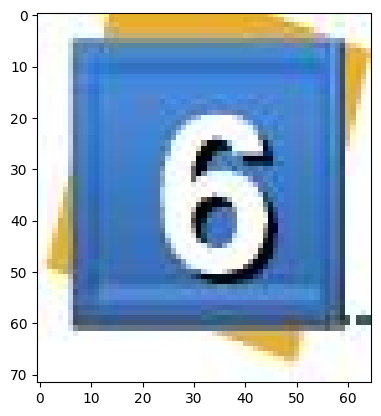

주어진 이미지는 파란색 배경에 흰색 숫자 6이 큼직하게 표시되어 있습니다. 이 숫자는 아마도 어떤 순서나 번호를 나타내는 것 같습니다. 이미지는 매우 단순하고 직관적이며, 숫자 6이 전면에 크게 부각되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 파란색 배경에 흰색 숫자 6이 큼직하게 표시되어 있습니다. 이 숫자는 아마도 어떤 순서나 번호를 나타내는 것 같습니다. 이미지는 매우 단순하고 직관적이며, 숫자 6이 전면에 크게 부각되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
25


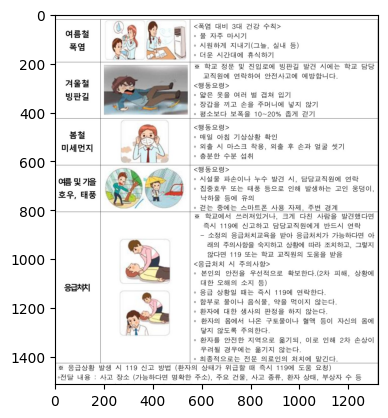

이 표와 이미지는 여러 가지 응급상황 시 대처방법을 안내하고 있습니다. 상황별로 구분되어 응급조치법을 설명하고 있으며, 의료진, 환자, 보호자 등 다양한 인물이 묘사되어 있습니다. 전반적으로 응급상황 발생 시 신속하고 적절한 대응의 중요성을 강조하고 있습니다. 이해를 돕기 위해 구체적인 지침과 예시 상황을 제시하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 표와 이미지는 여러 가지 응급상황 시 대처방법을 안내하고 있습니다. 상황별로 구분되어 응급조치법을 설명하고 있으며, 의료진, 환자, 보호자 등 다양한 인물이 묘사되어 있습니다. 전반적으로 응급상황 발생 시 신속하고 적절한 대응의 중요성을 강조하고 있습니다. 이해를 돕기 위해 구체적인 지침과 예시 상황을 제시하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
26


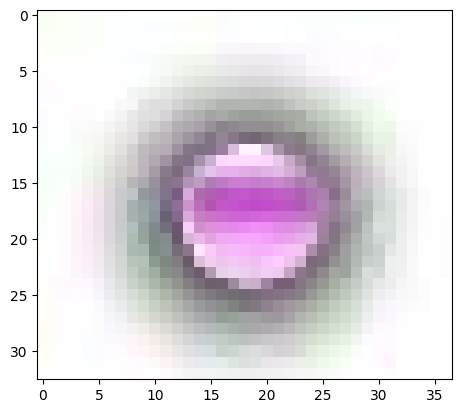

주어진 이미지는 분홍색과 보라색 톤의 꽃잎이 나선형으로 겹쳐있는 아름다운 실크 꽃의 근접 촬영입니다. 꽃잎의 질감과 색상 대비가 매력적이고 부드러운 느낌을 줍니다. 중앙에는 노란색 꽃술이 있어 포인트를 주고 있습니다. 전체적으로 평화롭고 은은한 분위기를 자아내는 자연물 사진입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 분홍색과 보라색 톤의 꽃잎이 나선형으로 겹쳐있는 아름다운 실크 꽃의 근접 촬영입니다. 꽃잎의 질감과 색상 대비가 매력적이고 부드러운 느낌을 줍니다. 중앙에는 노란색 꽃술이 있어 포인트를 주고 있습니다. 전체적으로 평화롭고 은은한 분위기를 자아내는 자연물 사진입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
27


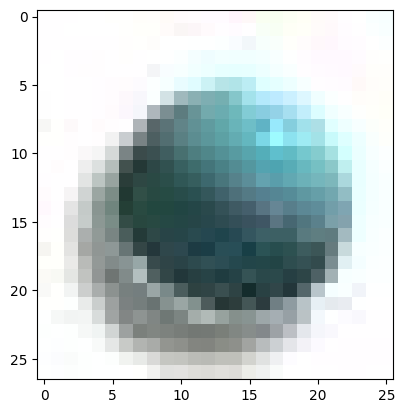

주어진 이미지는 우주 공간을 배경으로 지구의 모습을 보여주고 있습니다. 지구 표면의 푸른 바다와 육지, 구름 무늬가 선명하게 드러나 있으며, 지구 주변을 우주 먼지가 환하게 빛나며 둘러싸고 있습니다. 이 이미지는 우주에서 바라본 지구의 아름다운 모습을 생생하게 포착하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 우주 공간을 배경으로 지구의 모습을 보여주고 있습니다. 지구 표면의 푸른 바다와 육지, 구름 무늬가 선명하게 드러나 있으며, 지구 주변을 우주 먼지가 환하게 빛나며 둘러싸고 있습니다. 이 이미지는 우주에서 바라본 지구의 아름다운 모습을 생생하게 포착하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
28


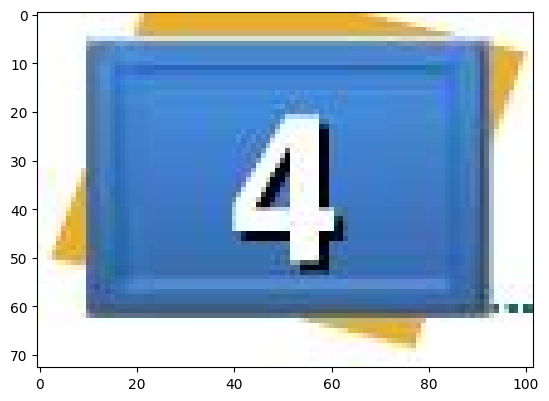

주어진 이미지는 푸른색 플라스틱 프레임에 가운데 큰 숫자 "4"가 인쇄된 단색 번호판을 보여줍니다. 단순한 디자인이지만 번호를 명확하게 전달하는 데 목적이 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 푸른색 플라스틱 프레임에 가운데 큰 숫자 "4"가 인쇄된 단색 번호판을 보여줍니다. 단순한 디자인이지만 번호를 명확하게 전달하는 데 목적이 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
29


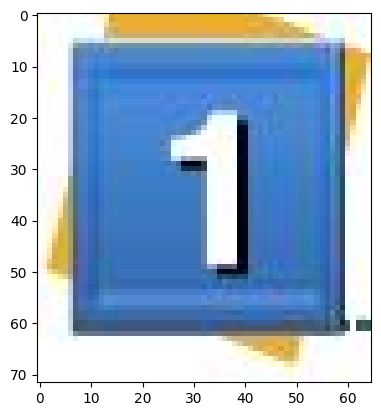

제공된 이미지는 푸른 배경에 흰색 테두리로 둘러싸인 숫자 1이 있는 정사각형 아이콘을 보여줍니다. 이 아이콘은 목록이나 순서를 나타내는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 푸른 배경에 흰색 테두리로 둘러싸인 숫자 1이 있는 정사각형 아이콘을 보여줍니다. 이 아이콘은 목록이나 순서를 나타내는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
30


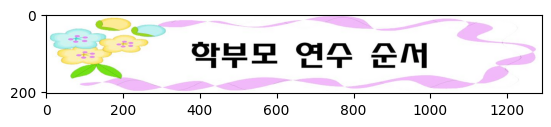

주황색과 녹색 꽃 모양이 있고 비슷한 형태의 보라색 물결 문양이 있는 이미지입니다. 가운데에는 "약부모 연수 순서"라는 한국어 텍스트가 있습니다. 전체적으로 화사하고 밝은 느낌의 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색과 녹색 꽃 모양이 있고 비슷한 형태의 보라색 물결 문양이 있는 이미지입니다. 가운데에는 "약부모 연수 순서"라는 한국어 텍스트가 있습니다. 전체적으로 화사하고 밝은 느낌의 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
31


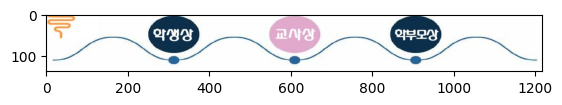

이미지는 수평선을 따라 "억양상, 교사상, 억부모상"이라는 세 가지 개념을 보여주고 있습니다. 각각의 개념은 원형 모양으로 표시되어 있으며, 선으로 연결되어 있습니다. 이 이미지는 아마도 세 가지 개념 간의 관계나 연결성을 시각적으로 설명하고자 한 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 수평선을 따라 "억양상, 교사상, 억부모상"이라는 세 가지 개념을 보여주고 있습니다. 각각의 개념은 원형 모양으로 표시되어 있으며, 선으로 연결되어 있습니다. 이 이미지는 아마도 세 가지 개념 간의 관계나 연결성을 시각적으로 설명하고자 한 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
32


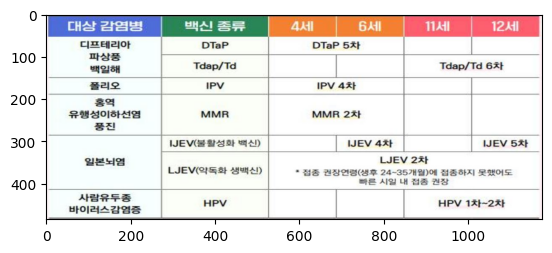

이 표는 어린이와 청소년을 대상으로 한 예방접종 일정을 보여줍니다. 좌측 열에는 대상 감염병이 나열되어 있고, 상단 행에는 연령대별로 4세, 6세, 11세, 12세로 구분되어 있습니다. 각 셀에는 해당 연령대에서 접종해야 하는 백신의 종류와 횟수가 명시되어 있습니다. 예를 들어 4세에는 DTaP, IPV, MMR, IJEVP 백신을 접종하도록 되어 있습니다. 이 표를 통해 부모와 의료진이 적절한 예방접종 일정을 파악할 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 표는 어린이와 청소년을 대상으로 한 예방접종 일정을 보여줍니다. 좌측 열에는 대상 감염병이 나열되어 있고, 상단 행에는 연령대별로 4세, 6세, 11세, 12세로 구분되어 있습니다. 각 셀에는 해당 연령대에서 접종해야 하는 백신의 종류와 횟수가 명시되어 있습니다. 예를 들어 4세에는 DTaP, IPV, MMR, IJEVP 백신을 접종하도록 되어 있습니다. 이 표를 통해 부모와 의료진이 적절한 예방접종 일정을 파악할 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
33


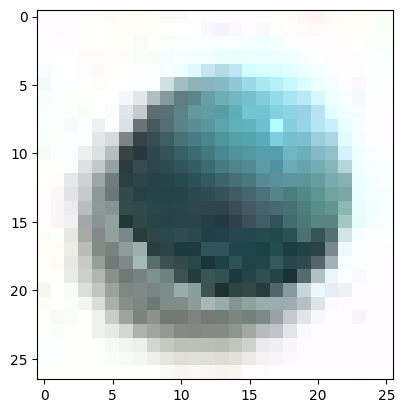

제공된 이미지는 초록색 바탕에 푸른색과 흰색 물결 무늬가 있는 글래스 구체를 나타내고 있습니다. 이 구체는 3차원적이며 투명한 재질로 보입니다. 아름답고 현대적인 추상적 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 초록색 바탕에 푸른색과 흰색 물결 무늬가 있는 글래스 구체를 나타내고 있습니다. 이 구체는 3차원적이며 투명한 재질로 보입니다. 아름답고 현대적인 추상적 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
34


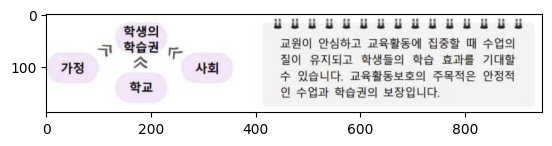

이 이미지는 학생의 학습권, 사회, 가정, 학교 등 다양한 요소들이 서로 연결되어 있음을 보여주고 있습니다. 교육활동보다는 학생을 중심으로 한 수업의 질을 향상시키는 것이 중요함을 시사하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 학생의 학습권, 사회, 가정, 학교 등 다양한 요소들이 서로 연결되어 있음을 보여주고 있습니다. 교육활동보다는 학생을 중심으로 한 수업의 질을 향상시키는 것이 중요함을 시사하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
35


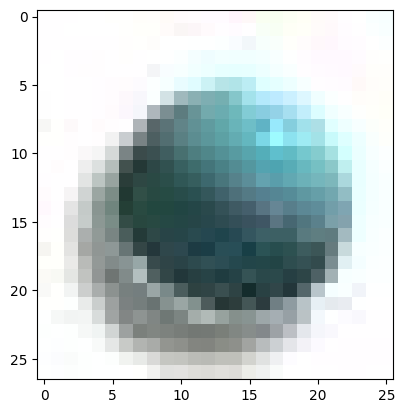

주어진 이미지는 녹색 배경에 원형 물체가 있는 모습입니다. 이 물체는 대리석과 같은 질감의 표면을 가지고 있으며, 표면에는 작은 균열과 패인 부분이 있습니다. 전체적인 모양은 행성 지구를 연상시킵니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 녹색 배경에 원형 물체가 있는 모습입니다. 이 물체는 대리석과 같은 질감의 표면을 가지고 있으며, 표면에는 작은 균열과 패인 부분이 있습니다. 전체적인 모양은 행성 지구를 연상시킵니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
36


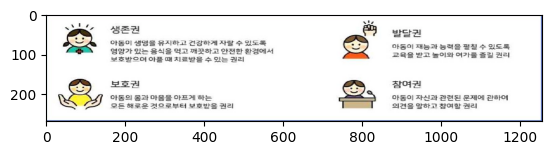

이미지는 아동의 성장을 돕고 안전하게 보호하는 4가지 권리를 설명하고 있습니다. 성장권, 발달권, 보호권, 참여권 등이 아이콘과 간단한 문구로 표현되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 아동의 성장을 돕고 안전하게 보호하는 4가지 권리를 설명하고 있습니다. 성장권, 발달권, 보호권, 참여권 등이 아이콘과 간단한 문구로 표현되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
37


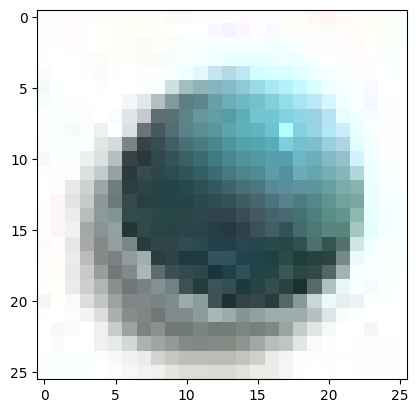

주어진 이미지는 행성지구를 모티브로 한 유리 구슬 같은 녹색 유리 장식품을 보여줍니다. 구체적으로 푸른 바다와 초록의 대륙이 표현되어 있어 지구의 모습을 나타내고 있습니다. 유리 장식품은 빛에 반사되어 선명한 색상과 디테일을 드러내며 아름다운 외관을 자랑합니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 행성지구를 모티브로 한 유리 구슬 같은 녹색 유리 장식품을 보여줍니다. 구체적으로 푸른 바다와 초록의 대륙이 표현되어 있어 지구의 모습을 나타내고 있습니다. 유리 장식품은 빛에 반사되어 선명한 색상과 디테일을 드러내며 아름다운 외관을 자랑합니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
38


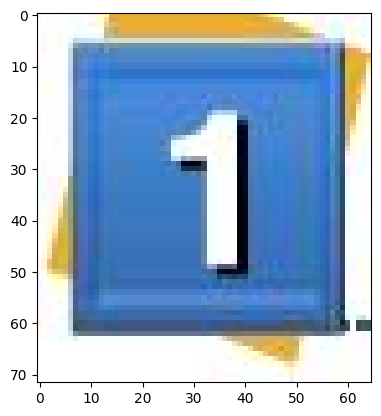

주황색 배경에 큰 파란색 숫자 '1'이 강조되어 있는 이미지입니다. 숫자 1은 현수막이나 간판에 자주 사용되는 단순하고 대담한 디자인으로 표현되어 있습니다. 이 이미지는 첫 번째, 최고, 우선순위와 같은 의미를 전달하는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색 배경에 큰 파란색 숫자 '1'이 강조되어 있는 이미지입니다. 숫자 1은 현수막이나 간판에 자주 사용되는 단순하고 대담한 디자인으로 표현되어 있습니다. 이 이미지는 첫 번째, 최고, 우선순위와 같은 의미를 전달하는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
39


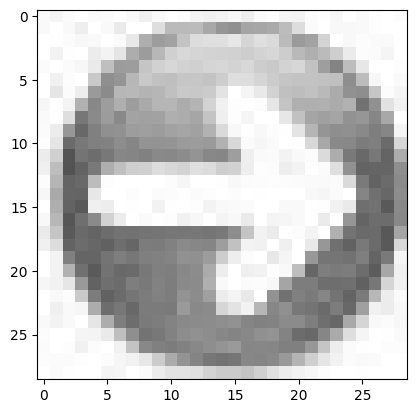

주어진 이미지는 작은 단추에 달린 원형 투명 블록체입니다. 이 투명 블록체 내부에는 원형의 회색 건전지 모양 물체가 들어있습니다. 블록체는 광선을 굴절시켜 그 내부 물체를 확대해서 보여주는 것 같습니다. 전반적으로 단순하면서도 현대적인 디자인을 가진 물체로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 작은 단추에 달린 원형 투명 블록체입니다. 이 투명 블록체 내부에는 원형의 회색 건전지 모양 물체가 들어있습니다. 블록체는 광선을 굴절시켜 그 내부 물체를 확대해서 보여주는 것 같습니다. 전반적으로 단순하면서도 현대적인 디자인을 가진 물체로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
40


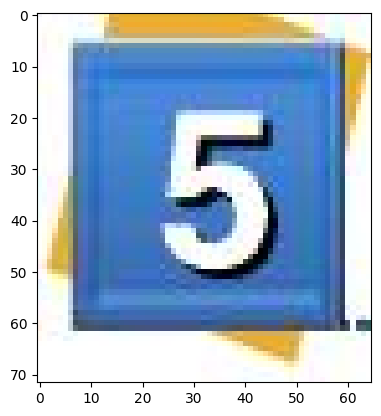

해당 이미지는 하늘색 배경에 흰색 테두리가 있는 파란색 숫자 5가 확대된 모습을 보여줍니다. 이 숫자는 3D 효과를 주어 입체적으로 표현되었습니다. 단순하지만 뚜렷한 숫자 5의 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '해당 이미지는 하늘색 배경에 흰색 테두리가 있는 파란색 숫자 5가 확대된 모습을 보여줍니다. 이 숫자는 3D 효과를 주어 입체적으로 표현되었습니다. 단순하지만 뚜렷한 숫자 5의 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
41


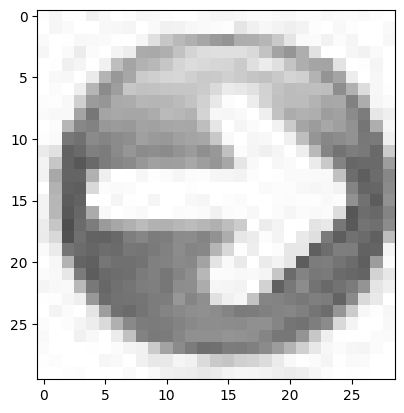

이 이미지는 하얀 배경 위에 회색 구체가 있는 단순한 렌더링 된 그래픽입니다. 구체의 표면이 매끄럽고 은색 반사 효과가 있어 금속처럼 보입니다. 중력에 의해 구체가 약간 아래로 찌그러진 형태를 취하고 있어 현실감 있게 표현되었습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 하얀 배경 위에 회색 구체가 있는 단순한 렌더링 된 그래픽입니다. 구체의 표면이 매끄럽고 은색 반사 효과가 있어 금속처럼 보입니다. 중력에 의해 구체가 약간 아래로 찌그러진 형태를 취하고 있어 현실감 있게 표현되었습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
42


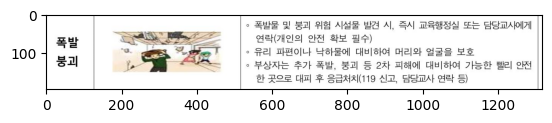

이 이미지는 국가 교육행정실을 대상으로 한 풍자 만평을 보여줍니다. 이 만평에는 여러 가지 편견과 고정관념을 은유적으로 풍자하고 있습니다. 한 사람이 다른 사람들의 눈, 귀, 입을 막는 모습을 통해 교육 당국이 일방적으로 정책을 펴나가고, 학생과 교사들의 목소리를 외면하고 있음을 비판하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 국가 교육행정실을 대상으로 한 풍자 만평을 보여줍니다. 이 만평에는 여러 가지 편견과 고정관념을 은유적으로 풍자하고 있습니다. 한 사람이 다른 사람들의 눈, 귀, 입을 막는 모습을 통해 교육 당국이 일방적으로 정책을 펴나가고, 학생과 교사들의 목소리를 외면하고 있음을 비판하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
43


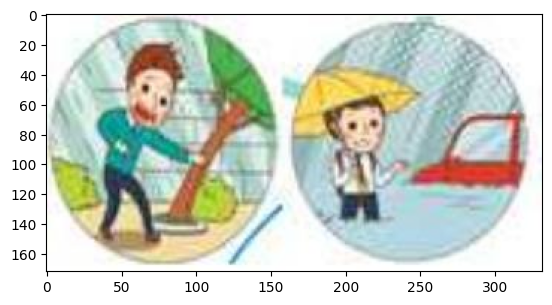

주어진 이미지는 두 개의 원형 아이콘으로 구성되어 있습니다. 왼쪽 아이콘에는 녹색 배경에 빗자루를 들고 있는 남성 캐릭터가 있고, 오른쪽 아이콘에는 노란색 배경에 우산을 쓴 남성 캐릭터와 자동차가 있습니다. 이 아이콘들은 청소 서비스와 운송 서비스를 상징하는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 두 개의 원형 아이콘으로 구성되어 있습니다. 왼쪽 아이콘에는 녹색 배경에 빗자루를 들고 있는 남성 캐릭터가 있고, 오른쪽 아이콘에는 노란색 배경에 우산을 쓴 남성 캐릭터와 자동차가 있습니다. 이 아이콘들은 청소 서비스와 운송 서비스를 상징하는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
44


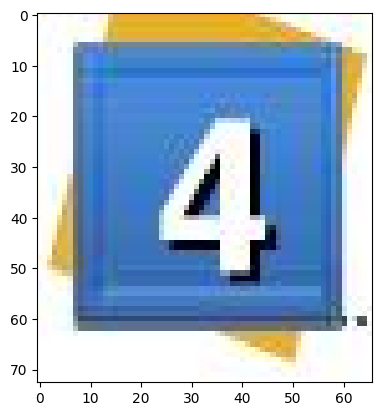

이미지는 파란색 배경 위에 굵은 하얀색 숫자 '4'가 있는 간단한 이미지입니다. 숫자 4는 모서리가 둥근 사각형 모양의 프레임 안에 있습니다. 이 이미지는 번호나 순서를 나타내는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 파란색 배경 위에 굵은 하얀색 숫자 '4'가 있는 간단한 이미지입니다. 숫자 4는 모서리가 둥근 사각형 모양의 프레임 안에 있습니다. 이 이미지는 번호나 순서를 나타내는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
45


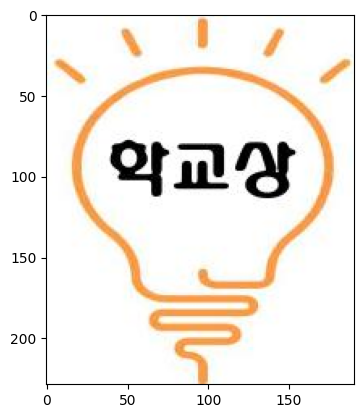

이미지는 노란색 전구 모양의 아이콘 안에 "학교상"이라는 한국어 단어가 쓰여 있습니다. 이 아이콘은 교육이나 학습 관련 개념을 나타내는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 노란색 전구 모양의 아이콘 안에 "학교상"이라는 한국어 단어가 쓰여 있습니다. 이 아이콘은 교육이나 학습 관련 개념을 나타내는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
46


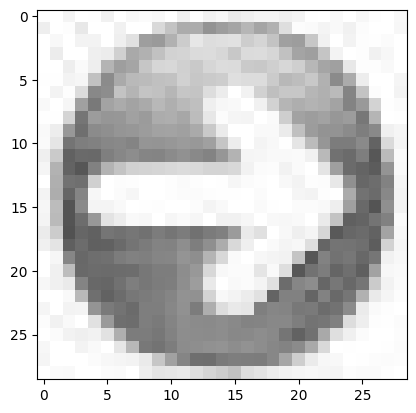

제공된 이미지는 깨끗하고 단순한 매크로 샷으로, 빗방울 모양의 투명한 물방울이 있습니다. 물방울 안에는 한국의 국기인 태극기가 선명하게 반사되어 보입니다. 이 이미지는 아마도 한국의 정신과 자부심을 상징적으로 나타내고자 한 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 깨끗하고 단순한 매크로 샷으로, 빗방울 모양의 투명한 물방울이 있습니다. 물방울 안에는 한국의 국기인 태극기가 선명하게 반사되어 보입니다. 이 이미지는 아마도 한국의 정신과 자부심을 상징적으로 나타내고자 한 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
47


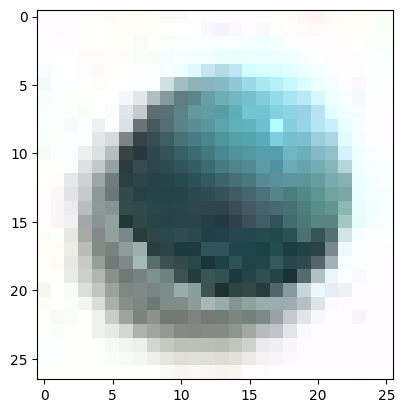

주어진 이미지는 푸른색 바탕에 지구 본체와 대륙들이 녹색으로 표현된 단순화된 지구본 모습을 보여줍니다. 지구본의 디자인은 미니멀리즘 스타일로 깔끔하고 현대적인 느낌을 줍니다. 이 이미지는 환경 또는 지구 보호 개념을 상징할 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 푸른색 바탕에 지구 본체와 대륙들이 녹색으로 표현된 단순화된 지구본 모습을 보여줍니다. 지구본의 디자인은 미니멀리즘 스타일로 깔끔하고 현대적인 느낌을 줍니다. 이 이미지는 환경 또는 지구 보호 개념을 상징할 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
48


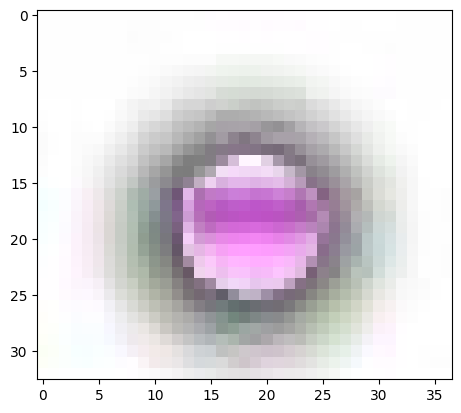

주어진 이미지는 흰색 배경에 핑크색과 보라색 연기 고리가 있는 추상적인 디지털 아트 작품입니다. 연기 고리는 중앙에 위치하고 있으며 아름다운 곡선과 색상 그라데이션이 특징적입니다. 전체적으로 모던하고 미니멀한 분위기를 자아내며 흐르는 듯한 유동적인 형태가 인상적입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 흰색 배경에 핑크색과 보라색 연기 고리가 있는 추상적인 디지털 아트 작품입니다. 연기 고리는 중앙에 위치하고 있으며 아름다운 곡선과 색상 그라데이션이 특징적입니다. 전체적으로 모던하고 미니멀한 분위기를 자아내며 흐르는 듯한 유동적인 형태가 인상적입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
49


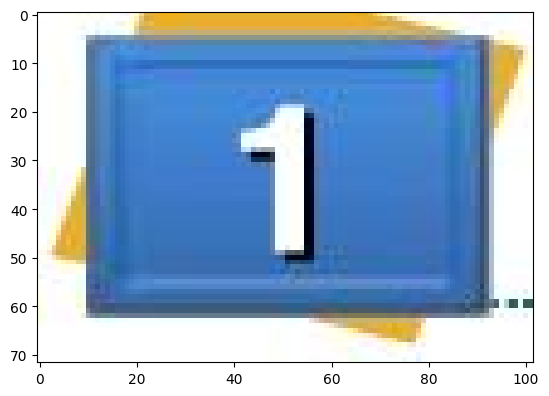

주어진 이미지는 푸른색 스탠드에 큰 숫자 "1"이 프린트된 흰색 이동식 칠판을 보여주고 있습니다. 이러한 이동식 칠판은 교실이나 회의실 등에서 간단한 글씨나 숫자를 적는 데 사용되는 편리한 도구입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 푸른색 스탠드에 큰 숫자 "1"이 프린트된 흰색 이동식 칠판을 보여주고 있습니다. 이러한 이동식 칠판은 교실이나 회의실 등에서 간단한 글씨나 숫자를 적는 데 사용되는 편리한 도구입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
50


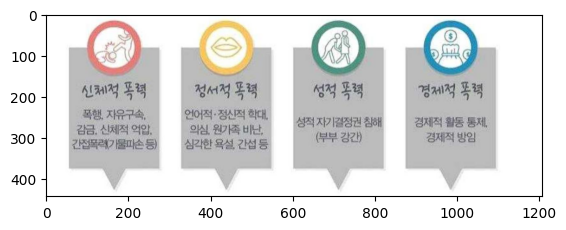

이 이미지는 네 가지 유형의 건강 예방 지침을 보여주고 있습니다. 첫째는 금연, 절주, 건강한 식생활 등 신체적 복절, 둘째는 입술 모양의 아이콘으로 정신적 복절인 웃음과 긍정적인 마음가짐을 상징합니다. 셋째는 두 사람이 손을 잡은 모습으로 성적 예방을 나타내고, 넷째는 경제적 복절 즉 적정 소득과 경제적 행복을 의미합니다. 이 지침들은 전반적인 건강과 행복을 위한 권고사항을 제시하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 네 가지 유형의 건강 예방 지침을 보여주고 있습니다. 첫째는 금연, 절주, 건강한 식생활 등 신체적 복절, 둘째는 입술 모양의 아이콘으로 정신적 복절인 웃음과 긍정적인 마음가짐을 상징합니다. 셋째는 두 사람이 손을 잡은 모습으로 성적 예방을 나타내고, 넷째는 경제적 복절 즉 적정 소득과 경제적 행복을 의미합니다. 이 지침들은 전반적인 건강과 행복을 위한 권고사항을 제시하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
51


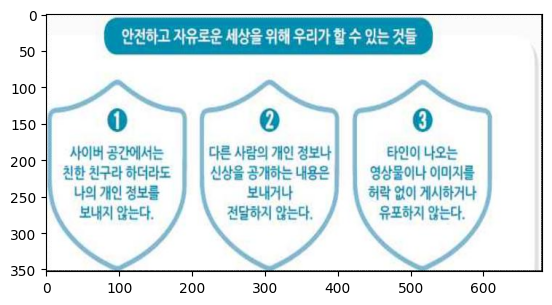

안전하고 자유로운 세상을 위해 우리가 할 수 있는 것들을 설명하는 이미지입니다. 1) 시민버그를 신고하여 위험을 예방할 수 있습니다. 2) 타인의 사생활 정보 유출을 자제하여 개인정보를 보호해야 합니다. 3) 타인에 대한 악의적인 인터넷 공격을 자제하고 서로를 존중해야 합니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '안전하고 자유로운 세상을 위해 우리가 할 수 있는 것들을 설명하는 이미지입니다. 1) 시민버그를 신고하여 위험을 예방할 수 있습니다. 2) 타인의 사생활 정보 유출을 자제하여 개인정보를 보호해야 합니다. 3) 타인에 대한 악의적인 인터넷 공격을 자제하고 서로를 존중해야 합니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
52


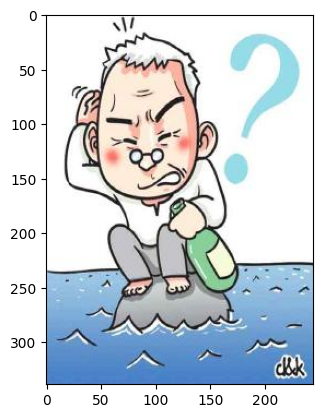

이미지에는 화가 난 표정의 할아버지가 바다에서 표류하는 모습이 그려져 있습니다. 할아버지는 구명조끼를 입고 있으며, 물 위에 떠 있는 모습에서 당혹스러운 상황을 엿볼 수 있습니다. 이 그림은 해학적이면서도 유머러스한 분위기를 자아내고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 화가 난 표정의 할아버지가 바다에서 표류하는 모습이 그려져 있습니다. 할아버지는 구명조끼를 입고 있으며, 물 위에 떠 있는 모습에서 당혹스러운 상황을 엿볼 수 있습니다. 이 그림은 해학적이면서도 유머러스한 분위기를 자아내고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
53


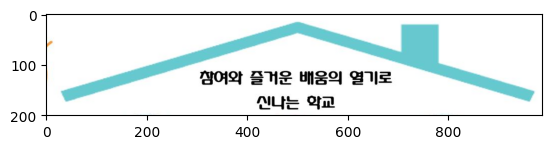

이미지는 지붕 모양의 터키 블루 색상 프레임에 "잘 먹고 일하는 약국"이라는 한국어 문구가 있습니다. 간단하고 직관적인 그래픽 디자인으로, 약국의 역할과 업무를 상징하는 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 지붕 모양의 터키 블루 색상 프레임에 "잘 먹고 일하는 약국"이라는 한국어 문구가 있습니다. 간단하고 직관적인 그래픽 디자인으로, 약국의 역할과 업무를 상징하는 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
54


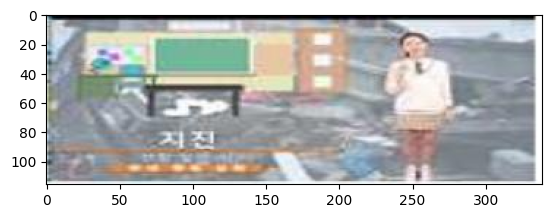

이미지에는 폭우로 인해 침수된 거리 모습이 담겨 있습니다. 우비를 입은 한 남성이 허리 높이까지 차오른 물에 서 있는 모습이 보입니다. 가게 간판과 건물이 부분적으로 물에 잠긴 것으로 보아 심각한 수준의 침수 상황임을 알 수 있습니다. 이렇게 극심한 폭우 피해 상황이 한국의 어느 지역인지는 알 수 없지만, 자연재해로 인한 큰 피해 모습이 그대로 드러나 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 폭우로 인해 침수된 거리 모습이 담겨 있습니다. 우비를 입은 한 남성이 허리 높이까지 차오른 물에 서 있는 모습이 보입니다. 가게 간판과 건물이 부분적으로 물에 잠긴 것으로 보아 심각한 수준의 침수 상황임을 알 수 있습니다. 이렇게 극심한 폭우 피해 상황이 한국의 어느 지역인지는 알 수 없지만, 자연재해로 인한 큰 피해 모습이 그대로 드러나 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
55


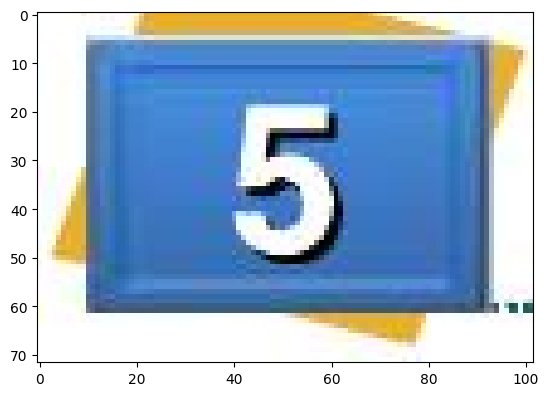

제공된 이미지는 푸른 바탕에 흰색 숫자 5가 새겨진 간단한 표지판을 보여주고 있습니다. 표지판의 모서리가 둥글고 손잡이가 있어 들고 다닐 수 있는 형태입니다. 이런 식의 간단한 표지판은 프레젠테이션이나 강의 중에 활용되는 시각 보조 자료일 가능성이 높습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 푸른 바탕에 흰색 숫자 5가 새겨진 간단한 표지판을 보여주고 있습니다. 표지판의 모서리가 둥글고 손잡이가 있어 들고 다닐 수 있는 형태입니다. 이런 식의 간단한 표지판은 프레젠테이션이나 강의 중에 활용되는 시각 보조 자료일 가능성이 높습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
56


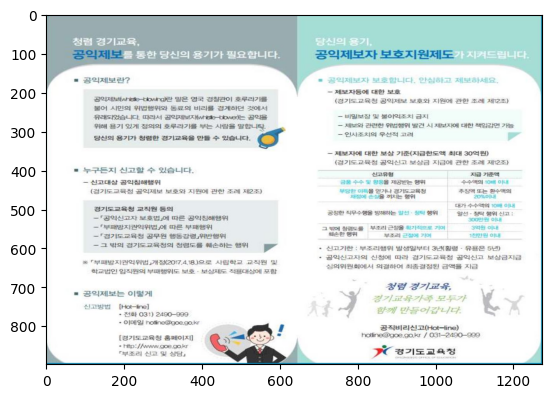

이미지는 경기도교육청에서 제공하는 공익제보 안내 자료입니다. 왼쪽 부분은 공익제보의 정의와 누구든지 신고할 수 있음을 설명하고, 오른쪽에는 공익제보자 보호제도와 실제 제보 방법을 안내하고 있습니다. 하단에는 공익신고 핫라인 번호와 웹사이트 주소가 있어 제보 경로를 자세히 안내하고 있습니다. 전체적으로 공익제보 활성화를 위한 안내 자료의 성격을 지니고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 경기도교육청에서 제공하는 공익제보 안내 자료입니다. 왼쪽 부분은 공익제보의 정의와 누구든지 신고할 수 있음을 설명하고, 오른쪽에는 공익제보자 보호제도와 실제 제보 방법을 안내하고 있습니다. 하단에는 공익신고 핫라인 번호와 웹사이트 주소가 있어 제보 경로를 자세히 안내하고 있습니다. 전체적으로 공익제보 활성화를 위한 안내 자료의 성격을 지니고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
57


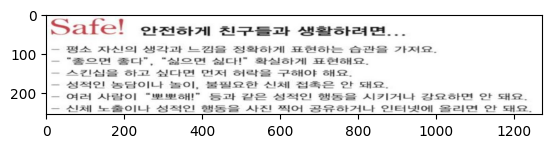

이미지는 한국어로 된 안전 수칙을 나열하고 있습니다. 평소 자신의 생각과 느낌을 진실하게 표현하라고 권고하며, "좋으면 좋다", "싫으면 싫다"라고 말하기를 제안합니다. 또한 스트레스를 해소하고 웃음 지을 것을 당부하며, 성적인 농담이나 놀이는 불쾌할 수 있으니 자제할 것을 당부하고 있습니다. 마지막으로 상대방의 행동을 시기하거나 견제하기보다는 인정하고 격려하는 자세가 중요함을 강조하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 한국어로 된 안전 수칙을 나열하고 있습니다. 평소 자신의 생각과 느낌을 진실하게 표현하라고 권고하며, "좋으면 좋다", "싫으면 싫다"라고 말하기를 제안합니다. 또한 스트레스를 해소하고 웃음 지을 것을 당부하며, 성적인 농담이나 놀이는 불쾌할 수 있으니 자제할 것을 당부하고 있습니다. 마지막으로 상대방의 행동을 시기하거나 견제하기보다는 인정하고 격려하는 자세가 중요함을 강조하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
58


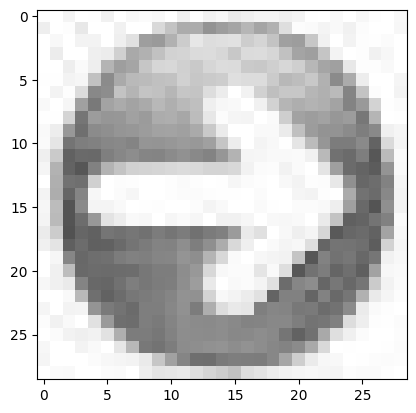

주어진 이미지는 흑백으로 되어있으며 원형 모양의 플라스틱 또는 금속 물체를 보여주고 있습니다. 그 물체는 외곽 가장자리가 톱니바퀴 모양으로 이루어져 있으며, 중앙에는 둥근 구멍이 있는 것으로 보입니다. 이 물체는 톱니바퀴나 기어와 같은 기계 부품일 것으로 추측됩니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 흑백으로 되어있으며 원형 모양의 플라스틱 또는 금속 물체를 보여주고 있습니다. 그 물체는 외곽 가장자리가 톱니바퀴 모양으로 이루어져 있으며, 중앙에는 둥근 구멍이 있는 것으로 보입니다. 이 물체는 톱니바퀴나 기어와 같은 기계 부품일 것으로 추측됩니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
59


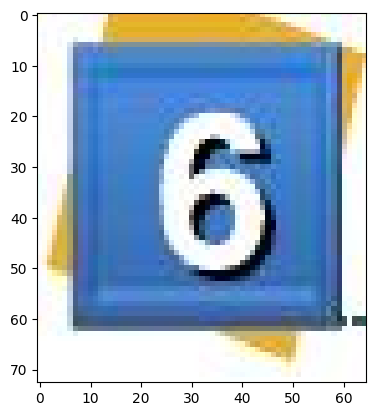

파란색 바탕에 큰 흰색 숫자 6이 있는 간단한 이미지입니다. 이 이미지는 숫자나 순서를 표현하는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '파란색 바탕에 큰 흰색 숫자 6이 있는 간단한 이미지입니다. 이 이미지는 숫자나 순서를 표현하는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
60


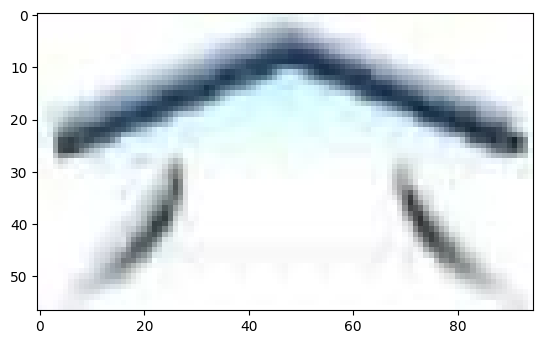

주어진 이미지는 파란색과 흰색 화살표로 이루어진 추상적인 모양을 나타내고 있습니다. 이는 아마도 어떤 방향이나 움직임을 상징하는 것 같습니다. 전체적으로 간결하고 단순한 디자인을 보여주면서도 역동적인 느낌을 자아내고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 파란색과 흰색 화살표로 이루어진 추상적인 모양을 나타내고 있습니다. 이는 아마도 어떤 방향이나 움직임을 상징하는 것 같습니다. 전체적으로 간결하고 단순한 디자인을 보여주면서도 역동적인 느낌을 자아내고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
61


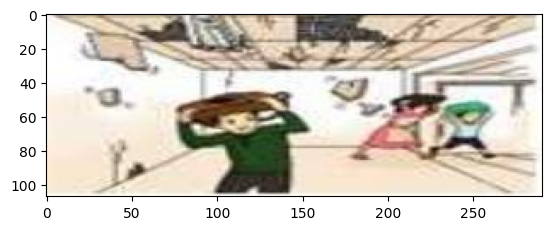

이 이미지는 지하철 또는 기차 안에서 일어난 사건을 묘사한 만화 스타일의 그림입니다. 한 여성이 서 있는 모습이 그려져 있고, 바닥에는 넘어진 다른 사람들이 있습니다. 이 장면은 갑작스러운 충격이나 사고로 인해 승객들이 넘어진 상황을 보여주는 것으로 보입니다. 그러나 개인 정보 보호를 위해 특정 개인을 식별할 수 있는 정보는 제공하지 않겠습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 지하철 또는 기차 안에서 일어난 사건을 묘사한 만화 스타일의 그림입니다. 한 여성이 서 있는 모습이 그려져 있고, 바닥에는 넘어진 다른 사람들이 있습니다. 이 장면은 갑작스러운 충격이나 사고로 인해 승객들이 넘어진 상황을 보여주는 것으로 보입니다. 그러나 개인 정보 보호를 위해 특정 개인을 식별할 수 있는 정보는 제공하지 않겠습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
62


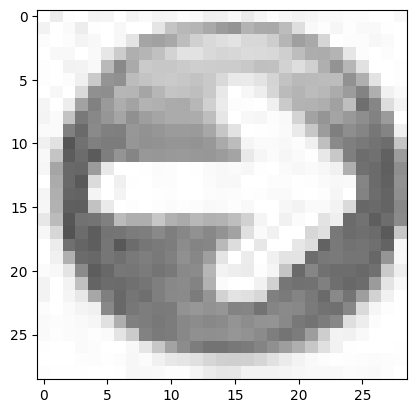

주어진 이미지는 달 모양의 벽 장식품을 보여줍니다. 은색과 회색 톤의 금속으로 만들어진 이 장식품은 달의 크레이터와 같은 질감을 표현하고 있습니다. 단순하지만 세련된 디자인으로 실내 공간을 꾸미는 데 활용될 수 있을 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 달 모양의 벽 장식품을 보여줍니다. 은색과 회색 톤의 금속으로 만들어진 이 장식품은 달의 크레이터와 같은 질감을 표현하고 있습니다. 단순하지만 세련된 디자인으로 실내 공간을 꾸미는 데 활용될 수 있을 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
63


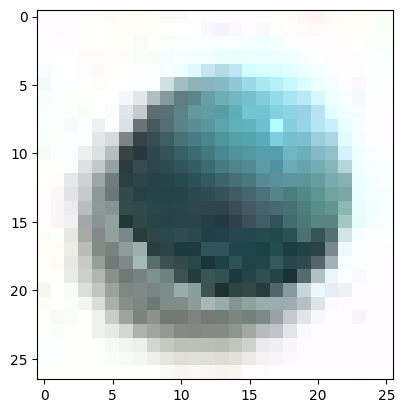

주어진 이미지는 녹색 물감 혹은 페인트가 섞인 물이 담긴 투명한 유리 그릇을 보여주고 있습니다. 유리 표면에 반사된 모습을 통해 원형의 유리 그릇임을 알 수 있습니다. 그릇 안의 액체는 물결 모양으로 움직이는 듯한 모습을 띠고 있어 생동감 있는 느낌을 줍니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 녹색 물감 혹은 페인트가 섞인 물이 담긴 투명한 유리 그릇을 보여주고 있습니다. 유리 표면에 반사된 모습을 통해 원형의 유리 그릇임을 알 수 있습니다. 그릇 안의 액체는 물결 모양으로 움직이는 듯한 모습을 띠고 있어 생동감 있는 느낌을 줍니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
64


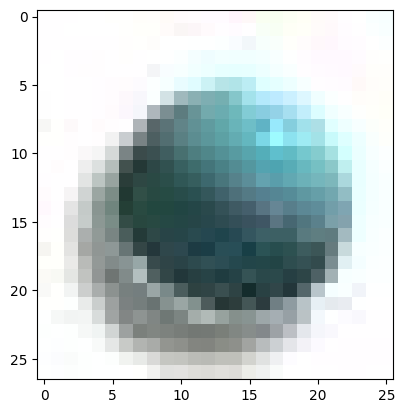

주어진 이미지는 에메랄드 녹색의 광활한 구 또는 행성과 같은 물체를 보여줍니다. 표면은 반짝이는 패턴으로 이루어져 있으며, 행성의 일부는 반사되어 금속 재질처럼 보입니다. 전체적으로 우주 공간에 떠 있는 신비로운 천체 같은 인상을 줍니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 에메랄드 녹색의 광활한 구 또는 행성과 같은 물체를 보여줍니다. 표면은 반짝이는 패턴으로 이루어져 있으며, 행성의 일부는 반사되어 금속 재질처럼 보입니다. 전체적으로 우주 공간에 떠 있는 신비로운 천체 같은 인상을 줍니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
65


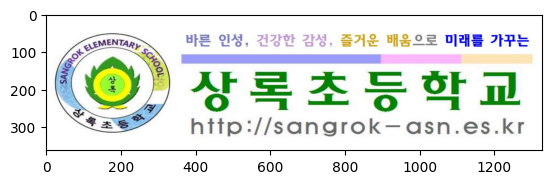

주어진 이미지는 상록초등학교의 로고와 웹사이트 주소를 보여주고 있습니다. 로고는 녹색 잎사귀 모양으로 되어 있으며, "바른 인성, 건강한 감성, 즐거운 배움으로 미래를 가꾸는" 라는 문구가 있습니다. 하단에는 학교 웹사이트 주소인 "http://sangrok-asn.es.kr"가 적혀 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 상록초등학교의 로고와 웹사이트 주소를 보여주고 있습니다. 로고는 녹색 잎사귀 모양으로 되어 있으며, "바른 인성, 건강한 감성, 즐거운 배움으로 미래를 가꾸는" 라는 문구가 있습니다. 하단에는 학교 웹사이트 주소인 "http://sangrok-asn.es.kr"가 적혀 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
66


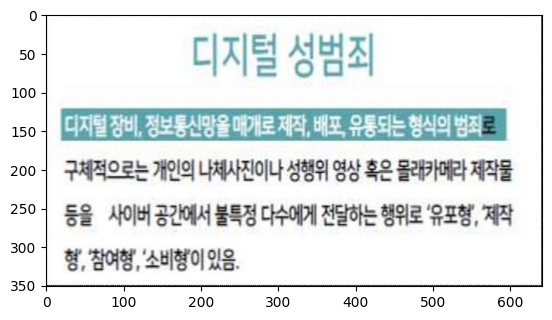

이미지는 '디지털 성범죄'에 대해 설명하고 있습니다. 디지털 성범죄란 불법 촬영물 유포, 성착취 영상물 제작 등을 말합니다. 이와 관련하여 협박, 유포, 제작 등의 범죄 행위가 언급되어 있습니다. 성범죄로 인한 피해를 예방하고 근절하기 위한 내용으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 '디지털 성범죄'에 대해 설명하고 있습니다. 디지털 성범죄란 불법 촬영물 유포, 성착취 영상물 제작 등을 말합니다. 이와 관련하여 협박, 유포, 제작 등의 범죄 행위가 언급되어 있습니다. 성범죄로 인한 피해를 예방하고 근절하기 위한 내용으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
67


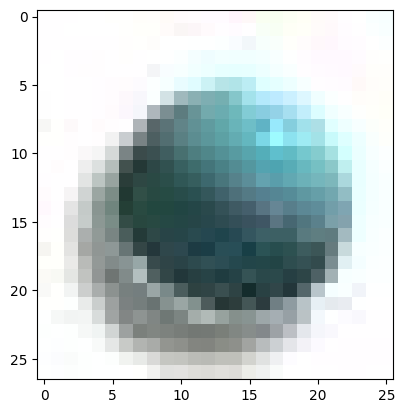

제시된 이미지는 녹색 바탕 위에 세상을 상징하는 푸른색 지구본 모형이 있습니다. 지구본 주변으로 여러 개의 작은 블록 조각들이 부유하고 있는 모습입니다. 이 이미지는 지구와 그 구성 요소들의 관계 및 상호 연결성을 표현하고 있는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제시된 이미지는 녹색 바탕 위에 세상을 상징하는 푸른색 지구본 모형이 있습니다. 지구본 주변으로 여러 개의 작은 블록 조각들이 부유하고 있는 모습입니다. 이 이미지는 지구와 그 구성 요소들의 관계 및 상호 연결성을 표현하고 있는 것으로 보입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
68


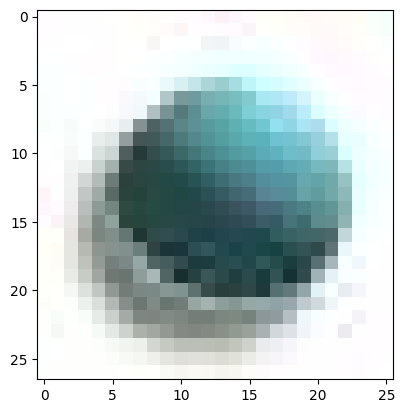

이 이미지는 대리석 질감의 표면 위에 있는 아름다운 녹색 보석을 보여주고 있습니다. 이 보석은 둥근 구체 모양으로 투명한 녹색 빛을 내며, 아름답게 세공된 입체적인 무늬 패턴이 새겨져 있습니다. 이 보석은 고급스럽고 예술적인 느낌을 주며, 보석의 섬세한 디테일과 반짝이는 광택이 매력적입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 대리석 질감의 표면 위에 있는 아름다운 녹색 보석을 보여주고 있습니다. 이 보석은 둥근 구체 모양으로 투명한 녹색 빛을 내며, 아름답게 세공된 입체적인 무늬 패턴이 새겨져 있습니다. 이 보석은 고급스럽고 예술적인 느낌을 주며, 보석의 섬세한 디테일과 반짝이는 광택이 매력적입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
69


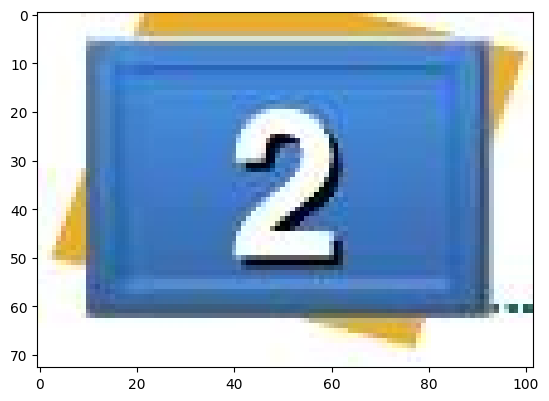

이미지는 파란색 배경에 큰 흰색 숫자 '2'가 있는 간단한 디자인의 간판을 보여줍니다. 이 간판은 아마도 번호, 순서 또는 위치를 표시하기 위한 용도로 사용되는 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 파란색 배경에 큰 흰색 숫자 '2'가 있는 간단한 디자인의 간판을 보여줍니다. 이 간판은 아마도 번호, 순서 또는 위치를 표시하기 위한 용도로 사용되는 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
70


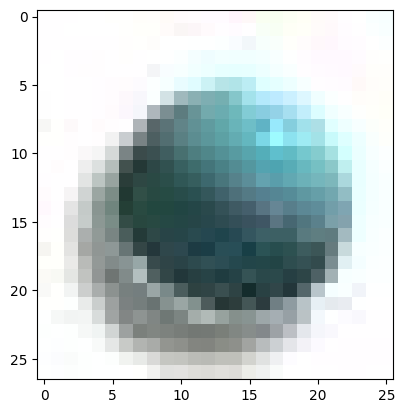

주어진 이미지는 녹색 바탕에 보석 모양의 탁구공과 같은 물체를 보여줍니다. 이 물체는 반투명하고 내부에 다른 층들이 있어 아름답고 신비로운 느낌을 줍니다. 전체적으로 단순하지만 정교하고 예술적인 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 녹색 바탕에 보석 모양의 탁구공과 같은 물체를 보여줍니다. 이 물체는 반투명하고 내부에 다른 층들이 있어 아름답고 신비로운 느낌을 줍니다. 전체적으로 단순하지만 정교하고 예술적인 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
71


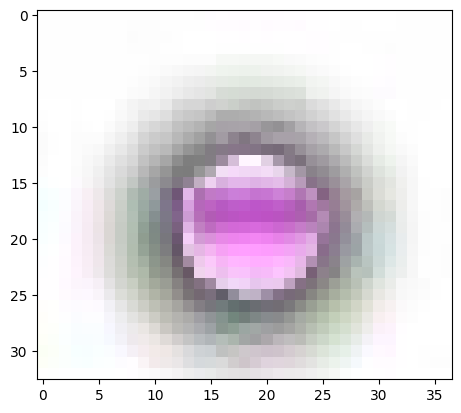

주어진 이미지는 둥근 핑크색 바탕에 보라색 꽃잎 모양의 무늬가 있는 방수 스티커 모양의 아이콘입니다. 중앙에는 흰색 바탕의 보라색 원이 있으며, 그 안에 작고 하얀 점이 있습니다. 이 이미지는 화려하고 부드러운 느낌을 주며, 아마도 뷰티 또는 스킨케어 제품의 브랜드 로고일 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 둥근 핑크색 바탕에 보라색 꽃잎 모양의 무늬가 있는 방수 스티커 모양의 아이콘입니다. 중앙에는 흰색 바탕의 보라색 원이 있으며, 그 안에 작고 하얀 점이 있습니다. 이 이미지는 화려하고 부드러운 느낌을 주며, 아마도 뷰티 또는 스킨케어 제품의 브랜드 로고일 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
72


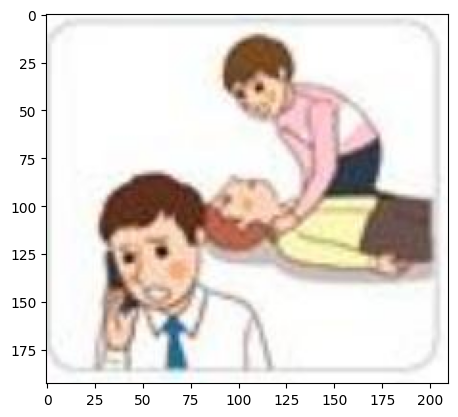

이미지에는 두 명의 남성이 있습니다. 한 남성이 다른 남성의 손을 잡고 있는 모습입니다. 이것은 협력이나 격려를 상징하는 것으로 보입니다. 그들의 옷차림으로 보아 직장 동료일 가능성이 높습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 두 명의 남성이 있습니다. 한 남성이 다른 남성의 손을 잡고 있는 모습입니다. 이것은 협력이나 격려를 상징하는 것으로 보입니다. 그들의 옷차림으로 보아 직장 동료일 가능성이 높습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
73


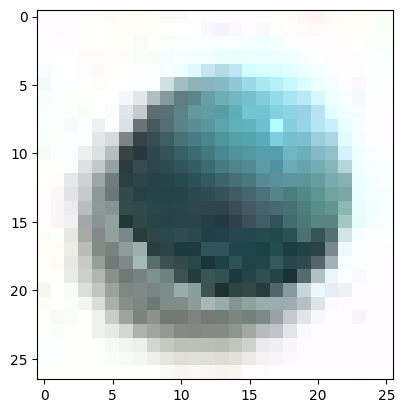

주어진 이미지는 푸른색 바탕에 투명한 유리구슬 모양의 물체가 있습니다. 이 물체는 작은 물방울 모양의 반사가 있어 마치 우주 공간을 연상케 합니다. 전체적으로 단순하지만 신비로운 분위기를 자아내는 추상적인 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 푸른색 바탕에 투명한 유리구슬 모양의 물체가 있습니다. 이 물체는 작은 물방울 모양의 반사가 있어 마치 우주 공간을 연상케 합니다. 전체적으로 단순하지만 신비로운 분위기를 자아내는 추상적인 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
74


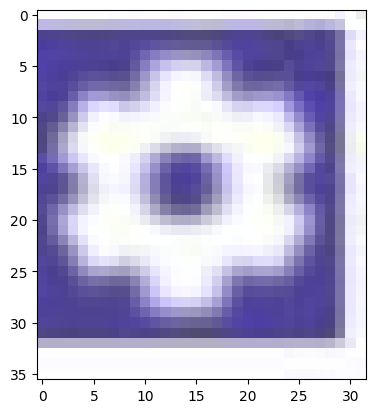

해당 이미지는 파란색 배경에 하얀색 축구공 모양의 아이콘이 있습니다. 이는 전 세계적으로 널리 알려진 축구 또는 풋볼 스포츠를 상징하는 단순하면서도 대표적인 디자인입니다. 이 아이콘은 스포츠 관련 프로그램, 웹사이트 또는 서비스 등에서 축구와 관련된 콘텐츠나 정보를 나타내는 데 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '해당 이미지는 파란색 배경에 하얀색 축구공 모양의 아이콘이 있습니다. 이는 전 세계적으로 널리 알려진 축구 또는 풋볼 스포츠를 상징하는 단순하면서도 대표적인 디자인입니다. 이 아이콘은 스포츠 관련 프로그램, 웹사이트 또는 서비스 등에서 축구와 관련된 콘텐츠나 정보를 나타내는 데 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
75


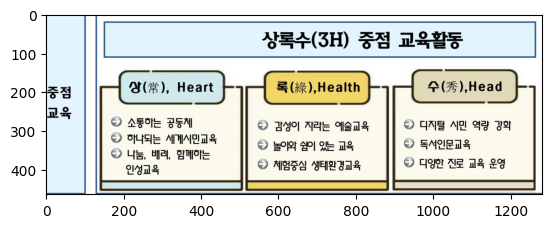

이 이미지는 한의학에서 상극수(3허) 중점 교육할동에 대해 설명하고 있습니다. 심(心), 폐(肺), 수(肰)의 세 가지 주요 부위별로 관련된 증상과 치료법을 나열하고 있습니다. 심(心)에는 소통하는 공두계, 어린아이 세계시민교육, 나듦, 배려, 압매하는 인성교육 등이 해당됩니다. 폐(肽)에는 감성이 자라는 예술교육, 놀이와 쉽이 있는 교육, 재영증심 생태환경교육 등이 해당됩니다. 수(肰)에는 디지털 시민 역량 강화, 독서인문교육, 디양한 지문 교육 운영 등이 포함되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 한의학에서 상극수(3허) 중점 교육할동에 대해 설명하고 있습니다. 심(心), 폐(肺), 수(肰)의 세 가지 주요 부위별로 관련된 증상과 치료법을 나열하고 있습니다. 심(心)에는 소통하는 공두계, 어린아이 세계시민교육, 나듦, 배려, 압매하는 인성교육 등이 해당됩니다. 폐(肽)에는 감성이 자라는 예술교육, 놀이와 쉽이 있는 교육, 재영증심 생태환경교육 등이 해당됩니다. 수(肰)에는 디지털 시민 역량 강화, 독서인문교육, 디양한 지문 교육 운영 등이 포함되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
76


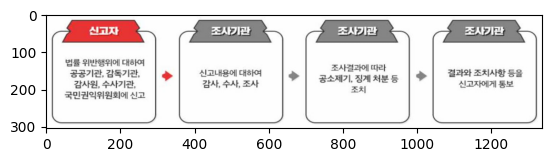

이 이미지는 조사 과정을 순서대로 보여주는 프로세스 다이어그램입니다. 첫 번째 박스에는 '신고자'라고 적혀 있고, 다음 박스에는 '조사기관'이라고 씌여 있습니다. 세 번째 박스는 조사 결과에 대한 공소제기, 징계 처분 등의 조치를 설명하고 있고, 마지막 박스에는 '결과와 조치사항 통보'라고 명시되어 있습니다. 전체적으로 신고 접수에서부터 조사, 결과 조치까지의 일련의 과정을 단계별로 설명하는 흐름도입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 조사 과정을 순서대로 보여주는 프로세스 다이어그램입니다. 첫 번째 박스에는 '신고자'라고 적혀 있고, 다음 박스에는 '조사기관'이라고 씌여 있습니다. 세 번째 박스는 조사 결과에 대한 공소제기, 징계 처분 등의 조치를 설명하고 있고, 마지막 박스에는 '결과와 조치사항 통보'라고 명시되어 있습니다. 전체적으로 신고 접수에서부터 조사, 결과 조치까지의 일련의 과정을 단계별로 설명하는 흐름도입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
77


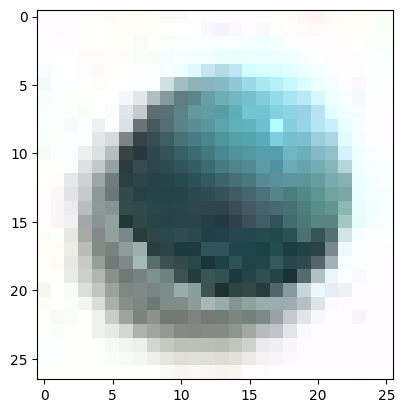

주어진 이미지는 푸른색과 녹색 계열의 색상이 섞인 둥근 구체 모양의 대상을 보여주고 있습니다. 표면에는 작은 돌기들과 균열 같은 패턴이 보이며, 마치 행성의 모습과 비슷한 느낌을 줍니다. 이 이미지는 추상적이고 예술적인 분위기를 자아내며, 우주나 자연의 경이로움을 연상시킵니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 푸른색과 녹색 계열의 색상이 섞인 둥근 구체 모양의 대상을 보여주고 있습니다. 표면에는 작은 돌기들과 균열 같은 패턴이 보이며, 마치 행성의 모습과 비슷한 느낌을 줍니다. 이 이미지는 추상적이고 예술적인 분위기를 자아내며, 우주나 자연의 경이로움을 연상시킵니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
78


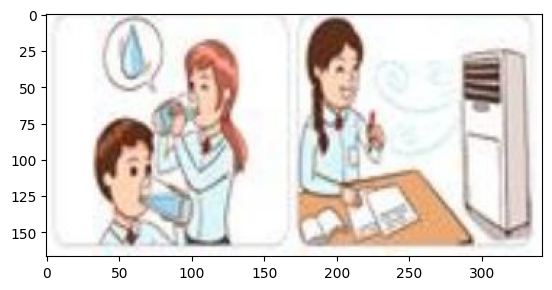

이 이미지는 사무실 장면을 보여주고 있습니다. 세 명의 직원들이 물 디스펜서 옆에 서서 이야기를 나누고 있는 모습입니다. 한 직원은 서류를 들고 있으며, 다른 직원은 팔짱을 끼고 있습니다. 이들의 표정과 자세를 통해 직장 동료 간의 일상적인 대화 장면을 엿볼 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 사무실 장면을 보여주고 있습니다. 세 명의 직원들이 물 디스펜서 옆에 서서 이야기를 나누고 있는 모습입니다. 한 직원은 서류를 들고 있으며, 다른 직원은 팔짱을 끼고 있습니다. 이들의 표정과 자세를 통해 직장 동료 간의 일상적인 대화 장면을 엿볼 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
79


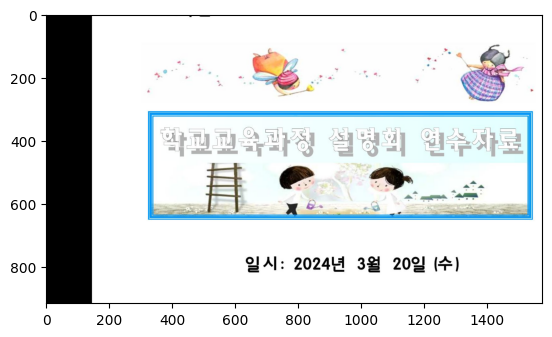

이미지에는 학교교육과정 실행계획이라는 제목의 파란색 프레임이 있습니다. 프레임 안에는 동화 같은 스타일로 그려진 두 명의 아이들이 마을 풍경을 배경으로 놀고 있는 모습이 묘사되어 있습니다. 이미지 상단에는 꽃과 요정 캐릭터가 있으며, 날짜는 2024년 3월 20일로 표시되어 있습니다. 전반적으로 밝고 평화로운 분위기를 자아내고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지에는 학교교육과정 실행계획이라는 제목의 파란색 프레임이 있습니다. 프레임 안에는 동화 같은 스타일로 그려진 두 명의 아이들이 마을 풍경을 배경으로 놀고 있는 모습이 묘사되어 있습니다. 이미지 상단에는 꽃과 요정 캐릭터가 있으며, 날짜는 2024년 3월 20일로 표시되어 있습니다. 전반적으로 밝고 평화로운 분위기를 자아내고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
80


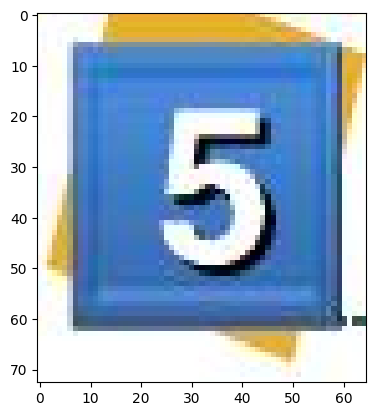

제공된 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 5가 표시되어 있습니다. 숫자 5는 간단하고 굵은 서체로 되어 있으며, 명확하게 보입니다. 이 이미지는 숫자, 색상 등을 강조하거나 식별하는 용도로 사용될 수 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 5가 표시되어 있습니다. 숫자 5는 간단하고 굵은 서체로 되어 있으며, 명확하게 보입니다. 이 이미지는 숫자, 색상 등을 강조하거나 식별하는 용도로 사용될 수 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
81


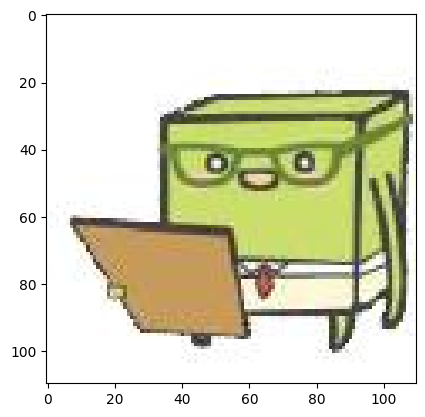

주황색과 초록색으로 표현된 재미있고 단순한 인간 모습의 캐릭터들이 있습니다. 이 캐릭터들은 서로 다른 모양과 표정을 가지고 있으며, 친근감 있고 유머러스한 분위기를 자아내고 있습니다. 이러한 단순하고 재치 있는 스타일의 그림은 아이들이나 젊은 층을 대상으로 한 콘텐츠에 잘 어울릴 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주황색과 초록색으로 표현된 재미있고 단순한 인간 모습의 캐릭터들이 있습니다. 이 캐릭터들은 서로 다른 모양과 표정을 가지고 있으며, 친근감 있고 유머러스한 분위기를 자아내고 있습니다. 이러한 단순하고 재치 있는 스타일의 그림은 아이들이나 젊은 층을 대상으로 한 콘텐츠에 잘 어울릴 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
82


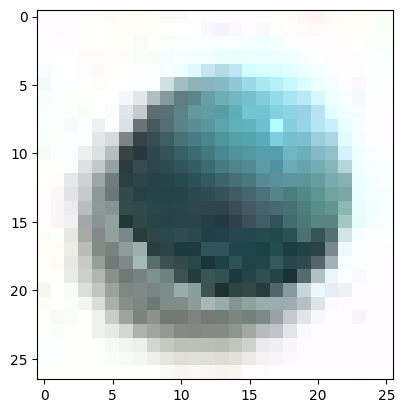

주어진 이미지는 녹색 바탕에 구체적인 물체가 있습니다. 이 물체는 둥근 모양의 금속 재질로 보이며, 밝은 빛이 반사되어 광택이 있습니다. 전체적으로 단순하지만 매끈한 구체 형태의 물체가 강조되어 있습니다. 구체의 정확한 용도나 의미는 알 수 없지만, 현대적이고 미니멀한 느낌을 줍니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 녹색 바탕에 구체적인 물체가 있습니다. 이 물체는 둥근 모양의 금속 재질로 보이며, 밝은 빛이 반사되어 광택이 있습니다. 전체적으로 단순하지만 매끈한 구체 형태의 물체가 강조되어 있습니다. 구체의 정확한 용도나 의미는 알 수 없지만, 현대적이고 미니멀한 느낌을 줍니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
83


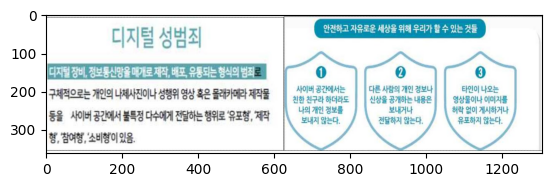

이미지는 디지털 성범죄에 대한 설명을 담고 있습니다. 디지털 성범죄의 정의와 디지털 성범죄로 인한 피해 유형 3가지를 제시하고 있습니다. 1) 사이버 공간에서는 원격 전자기기로 불법촬영이 가능하다는 점, 2) 다른 사람의 개인 정보나 신상을 공개하는 행위가 있다는 점, 3) 타인의 나체나 음란물이 유포되어 피해를 입을 수 있다는 점을 강조하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 디지털 성범죄에 대한 설명을 담고 있습니다. 디지털 성범죄의 정의와 디지털 성범죄로 인한 피해 유형 3가지를 제시하고 있습니다. 1) 사이버 공간에서는 원격 전자기기로 불법촬영이 가능하다는 점, 2) 다른 사람의 개인 정보나 신상을 공개하는 행위가 있다는 점, 3) 타인의 나체나 음란물이 유포되어 피해를 입을 수 있다는 점을 강조하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
84


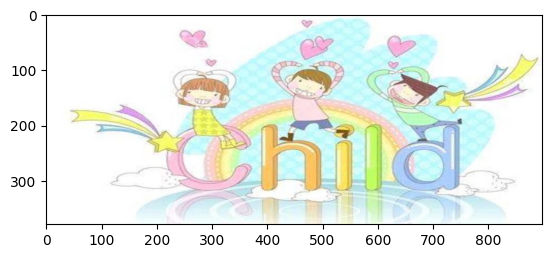

이미지는 아이들과 관련된 장면을 보여줍니다. 아기천사 모습의 세 명의 아이들이 무지개와 구름 위에서 행복하게 웃고 있습니다. 밝고 발랄한 색상과 하트 모양의 장식이 있어 유쾌하고 사랑스러운 분위기를 자아냅니다. 아동 관련 콘텐츠나 제품을 홍보하기에 적합한 이미지입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 아이들과 관련된 장면을 보여줍니다. 아기천사 모습의 세 명의 아이들이 무지개와 구름 위에서 행복하게 웃고 있습니다. 밝고 발랄한 색상과 하트 모양의 장식이 있어 유쾌하고 사랑스러운 분위기를 자아냅니다. 아동 관련 콘텐츠나 제품을 홍보하기에 적합한 이미지입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
85


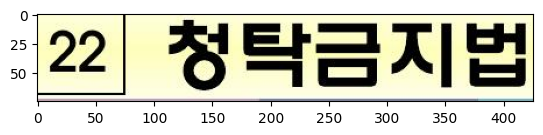

이미지는 숫자 22와 한국어 "청탁금지법"이라는 텍스트를 보여줍니다. 배경은 단색이며 텍스트 스타일은 간단하고 명료합니다. 이는 아마도 공공 캠페인이나 정부 정책을 나타내는 것 같습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 숫자 22와 한국어 "청탁금지법"이라는 텍스트를 보여줍니다. 배경은 단색이며 텍스트 스타일은 간단하고 명료합니다. 이는 아마도 공공 캠페인이나 정부 정책을 나타내는 것 같습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
86


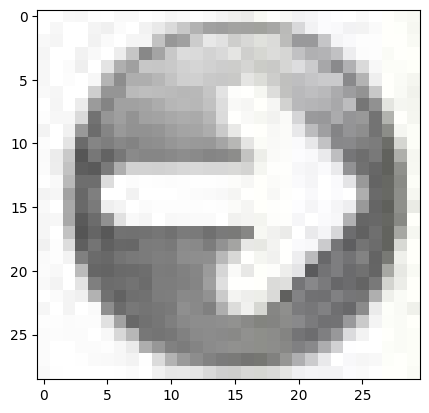

주어진 이미지는 보잉 항공기 회사의 로고를 보여주고 있습니다. 로고는 둥근 원 모양 안에 스텔스 전투기 형상의 조종석과 날개가 스타일화되어 있습니다. 로고의 색상은 회색 톤으로 단순하면서도 우아한 느낌을 줍니다. 보잉 항공기 회사의 첨단 기술력과 혁신을 상징하는 로고 디자인입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 보잉 항공기 회사의 로고를 보여주고 있습니다. 로고는 둥근 원 모양 안에 스텔스 전투기 형상의 조종석과 날개가 스타일화되어 있습니다. 로고의 색상은 회색 톤으로 단순하면서도 우아한 느낌을 줍니다. 보잉 항공기 회사의 첨단 기술력과 혁신을 상징하는 로고 디자인입니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
87


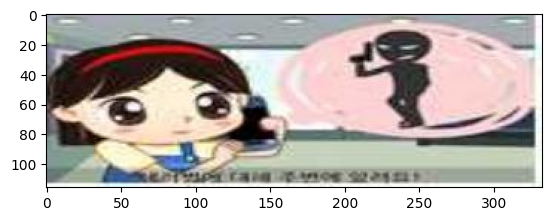

제공된 이미지는 한 여성의 캐릭터가 등장하는 그림입니다. 여성의 캐릭터는 검은 머리카락과 커다란 눈동자를 가지고 있으며, 하늘색 옷을 입고 있습니다. 오른쪽에는 "소녀시대"라는 한국 걸그룹 로고가 있습니다. 이미지는 재미있고 캐주얼한 스타일로 디자인되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '제공된 이미지는 한 여성의 캐릭터가 등장하는 그림입니다. 여성의 캐릭터는 검은 머리카락과 커다란 눈동자를 가지고 있으며, 하늘색 옷을 입고 있습니다. 오른쪽에는 "소녀시대"라는 한국 걸그룹 로고가 있습니다. 이미지는 재미있고 캐주얼한 스타일로 디자인되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
88


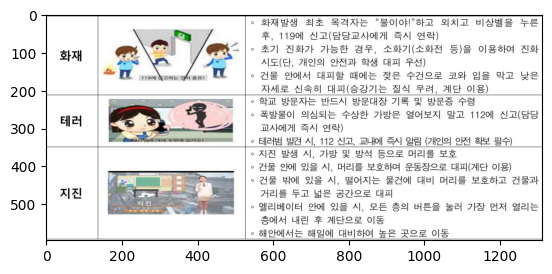

이미지는 화제 시간, 데리 시간, 지진 시간에 대한 정보와 그림을 보여주고 있습니다. 화제 시간 그림에는 태극기를 든 아이들이 있고, 데리 시간 그림에는 분홍색 배경에 여자 아이가 있습니다. 지진 시간 그림에는 교실에서 책상 아래로 숨은 선생님이 보입니다. 각 시간대에 취해야 할 행동 지침이 함께 제시되어 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이미지는 화제 시간, 데리 시간, 지진 시간에 대한 정보와 그림을 보여주고 있습니다. 화제 시간 그림에는 태극기를 든 아이들이 있고, 데리 시간 그림에는 분홍색 배경에 여자 아이가 있습니다. 지진 시간 그림에는 교실에서 책상 아래로 숨은 선생님이 보입니다. 각 시간대에 취해야 할 행동 지침이 함께 제시되어 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
89


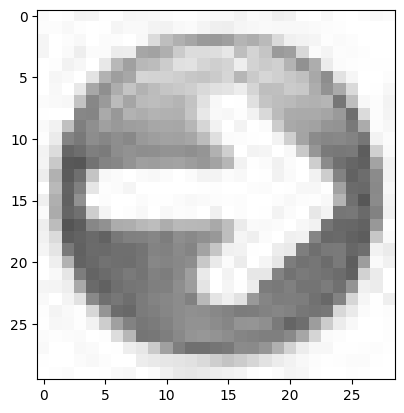

주어진 이미지는 둥근 수영장을 가로지르는 장대길이 투영된 그림자 모습을 보여줍니다. 수영장 바닥에는 물결 무늬가 있고, 수영장 주변으로는 야자수 그림자가 드리워져 있습니다. 이 이미지는 해변 리조트나 열대 분위기를 연상케 합니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 둥근 수영장을 가로지르는 장대길이 투영된 그림자 모습을 보여줍니다. 수영장 바닥에는 물결 무늬가 있고, 수영장 주변으로는 야자수 그림자가 드리워져 있습니다. 이 이미지는 해변 리조트나 열대 분위기를 연상케 합니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
90


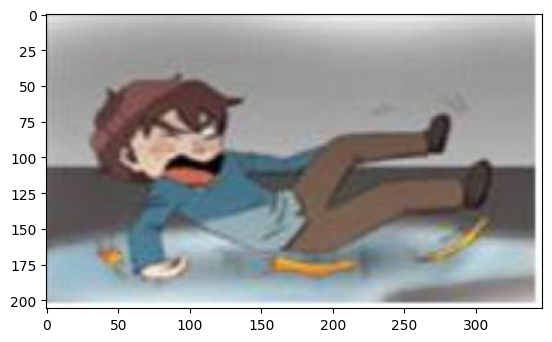

이 이미지는 실수로 미끄러져 떨어지는 한 남자 아이의 모습을 재미있게 묘사하고 있습니다. 바나나 껍질에 걸려 넘어지는 고전적인 장면을 보여주며, 만화 스타일의 그림체로 유쾌한 분위기를 자아내고 있습니다. 이런 단순하지만 웃긴 상황을 통해 유머러스한 메시지를 전달하고 있습니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '이 이미지는 실수로 미끄러져 떨어지는 한 남자 아이의 모습을 재미있게 묘사하고 있습니다. 바나나 껍질에 걸려 넘어지는 고전적인 장면을 보여주며, 만화 스타일의 그림체로 유쾌한 분위기를 자아내고 있습니다. 이런 단순하지만 웃긴 상황을 통해 유머러스한 메시지를 전달하고 있습니다.'
INFO:retry-bedrock-invocation:trying summary_img() [1/5]



==
91


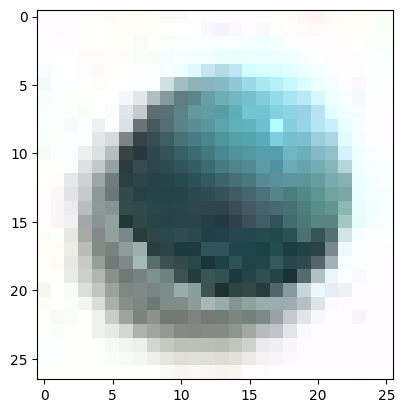

주어진 이미지는 녹색 바탕에 하얀 원 안에 녹색으로 둥근 행성 같은 물체가 있습니다. 이 행성 모양의 물체 안에는 땅과 바다, 구름 등이 섬세하게 표현되어 있어 지구를 연상케 합니다. 전체적으로 환경 및 지구 보호 개념을 상징하는 것으로 보입니다.

INFO:retry-bedrock-invocation:in retry(), summary_img() returned '주어진 이미지는 녹색 바탕에 하얀 원 안에 녹색으로 둥근 행성 같은 물체가 있습니다. 이 행성 모양의 물체 안에는 땅과 바다, 구름 등이 섬세하게 표현되어 있어 지구를 연상케 합니다. 전체적으로 환경 및 지구 보호 개념을 상징하는 것으로 보입니다.'



==
92


In [67]:
image_summaries = []
for idx, img_base64 in enumerate(img_info):
    summary = summary_img(summarize_chain, img_base64)
    image_summaries.append(summary)
    print ("\n==")
    print (idx)
    
#image_summaries = summarize_chain.batch(img_info, config={"max_concurrency": 1})

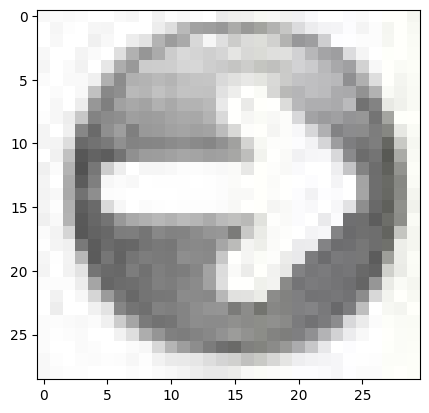

Summary: 제공된 이미지는 태양의 부분 일식 모습을 보여줍니다. 태양 일부가 달에 의해 가려져 있으며, 태양의 가장자리 일부만 환하게 빛나고 있습니다. 일식 현상 동안 태양의 고리 모양이 아름답게 포착되어 있습니다.


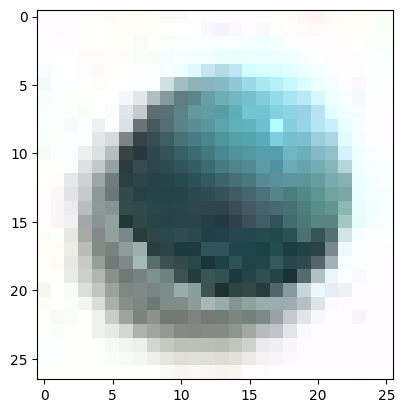

Summary: 제공된 이미지는 우주에서 촬영한 것으로 보이는 푸른 행성 지구의 모습입니다. 대기가 에워싸고 있으며 구름 무늬와 대륙의 모습이 선명하게 드러납니다. 지구 표면에는 바다, 대륙, 구름 등의 자연 현상이 아름답게 펼쳐져 있습니다.


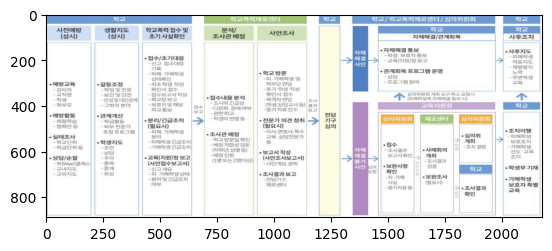

Summary: 이 이미지는 학교 조직 체계와 각 부서 간의 업무 흐름을 보여주는 도표입니다. 상단에는 학교와 학교폭력대책센터, 학교/학교폭력대책센터/심의위원회 등의 조직 구조가 표시되어 있습니다. 중간에는 주요 업무 프로세스인 자체해결, 자체해결 실패 시 절차, 심의위원회 개최 등의 절차가 순서대로 나열되어 있습니다. 하단에는 심의위원회, 제로센터, 심의위원회 결과에 따른 후속 조치 등이 제시되어 있습니다. 전체적으로 학교 내 사안 발생 시 해결 절차와 관련 부서 간의 업무 연계를 한눈에 파악할 수 있도록 구성되어 있습니다.


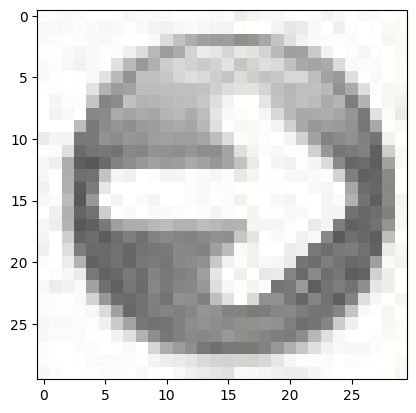

Summary: 주어진 이미지는 은색 동전 모습을 나타내고 있습니다. 그 중앙에는 부엉이 새 모양의 문양이 있으며, 테두리에는 "싱가포르 공화국" 이라는 글자가 새겨져 있습니다. 이는 싱가포르 화폐 단위인 싱가포르 달러의 동전 모습으로 보입니다.


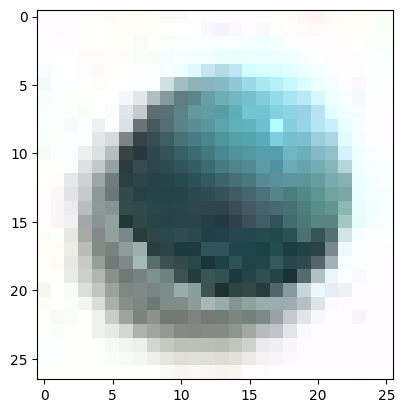

Summary: 주어진 이미지는 공기 중에서 돌고 있는 두 개의 동전 모습을 보여주고 있습니다. 동전의 양면에는 한국어로 '신뢰받는 기업'이라는 문구가 새겨져 있습니다. 동전의 중심부에는 초록색 원이 있어 기업의 로고 혹은 상징을 나타내는 것으로 보입니다. 전체적으로 기업의 신뢰도와 가치를 상징하는 이미지로 해석할 수 있습니다.


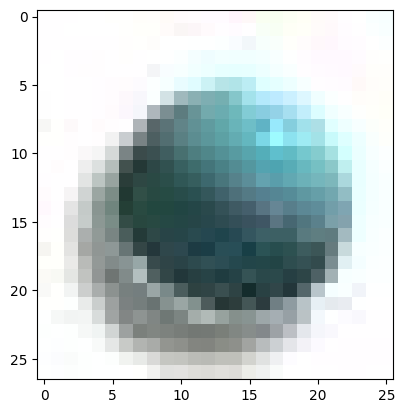

Summary: 주어진 이미지는 암록색 배경에 둥근 녹색 행성 모양의 지구본과 같은 구체가 있습니다. 구체의 표면은 푸른색과 갈색 등의 다양한 색상으로 이루어져 있어 지구의 대륙과 바다를 연상케 합니다. 이 이미지는 환경이나 지구 보호 등의 주제와 관련이 있을 것으로 보입니다.


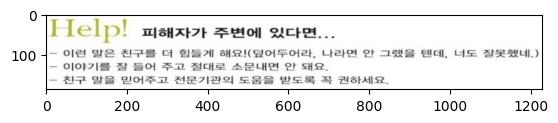

Summary: 이 이미지는 누군가가 도움이 필요한 상황에서 취할 수 있는 행동들을 알려주고 있습니다. 침착하게 행동하고, 아이를 안전하게 보호하며, 전문가의 도움을 구하라는 내용입니다. 위급 상황에서 대처하는 방법에 대한 조언을 제시하고 있는 것으로 보입니다.


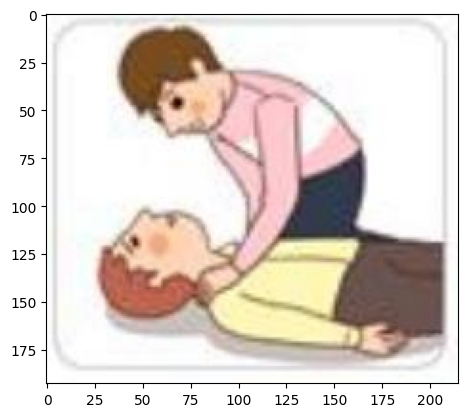

Summary: 이미지에는 한 여성이 누워 있는 다른 사람을 도와주는 모습이 나타나 있습니다. 여성은 분홍색 상의를 입고 있으며, 바닥에 누운 사람을 향해 구부려져 있습니다. 이는 응급 상황이나 구조 활동을 묘사한 것으로 보입니다.


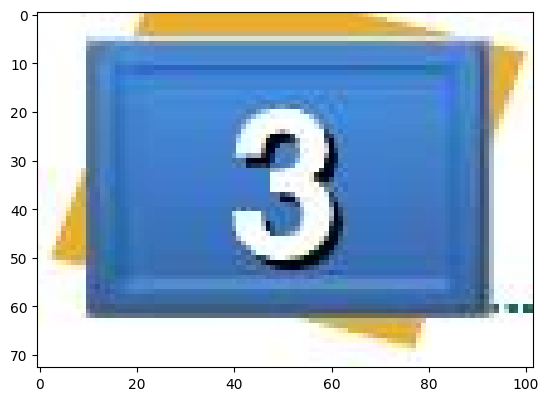

Summary: 이미지는 파란색 배경에 흰색 숫자 3이 크게 새겨진 작은 칠판을 보여줍니다. 누군가가 칠판을 손에 들고 있는 것으로 보입니다.


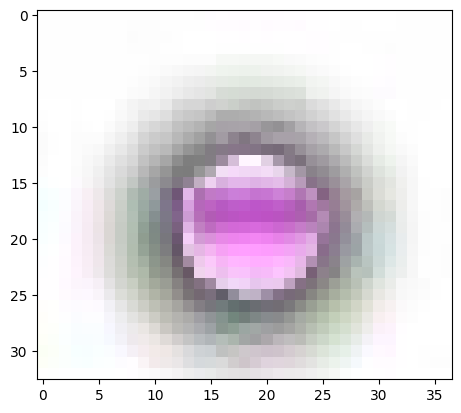

Summary: 주어진 이미지는 핑크색 배경에 보라색과 하얀색 원형 디자인이 있는 간단한 추상 이미지입니다. 원형 디자인은 중앙에 작은 원형 모양이 있고, 그 주변으로 방사형 모양의 선들이 퍼져 있는 형태입니다. 전체적으로 단순하면서도 세련되고 미니멀한 디자인을 보여주고 있습니다.


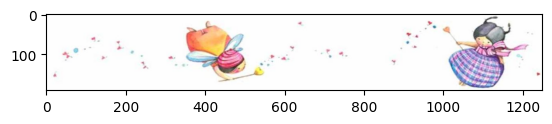

Summary: 이미지는 마카롱, 과일, 하트 모양의 반짝이와 함께 화려한 컬러로 그려진 작은 천사 캐릭터를 보여줍니다. 그림 속 천사 캐릭터는 활기차고 귀여운 분위기를 자아내며, 사랑과 행복의 메시지를 전달하는 것 같습니다. 전체적으로 밝고 낙관적인 분위기를 자아내는 일러스트레이션입니다.


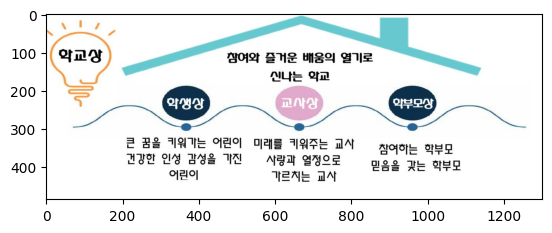

Summary: 이 이미지는 효과적인 학교생활을 위해 따라야 할 세 가지 영역인 학생상, 교사상, 학부모상을 설명하고 있습니다. 학생은 끊임없이 노력해야 하고, 교사는 학생들의 잠재력을 이끌어내야 하며, 학부모는 자녀의 성장을 지원해야 한다고 강조하고 있습니다. 전반적으로 학생, 교사, 학부모 간의 조화로운 관계와 역할이 중요하다는 메시지를 전달하고 있습니다.


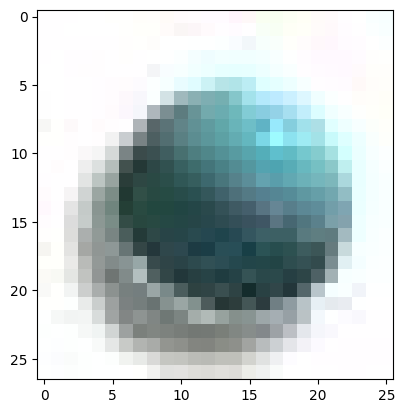

Summary: 주어진 이미지는 지구본 모양의 에메랄드 녹색 보석을 보여줍니다. 지구본의 대륙과 해양 지형이 보석 색상으로 섬세하게 표현되어 있습니다. 대륙의 지형이 약간 돌출되어 있어 입체감을 주고 있습니다. 전체적으로 단순하면서도 아름다운 디자인의 장신구 보석으로 보입니다.


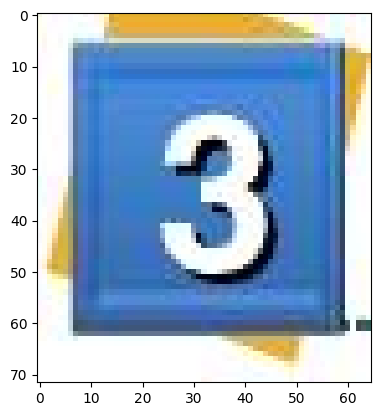

Summary: 주황색 배경에 큰 흰색 숫자 3이 새겨진 청색 정사각형 프레임이 있는 이미지입니다.


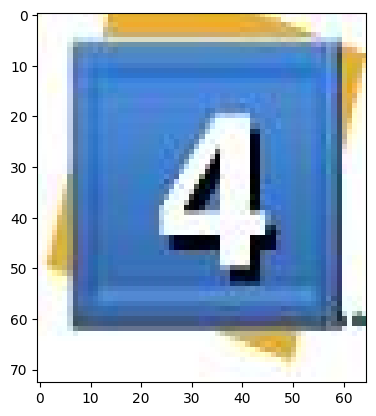

Summary: 주위 공기와 뚜렷한 대비를 이루는 어두운 바탕에 밝은 파란색으로 숫자 4가 크게 표시된 이미지입니다. 나무나 금속 등의 재질로 보이는 액자가 숫자를 감싸고 있습니다. 이미지는 단순하지만 숫자 4가 강렬하게 강조되어 있어 주목성이 높습니다.


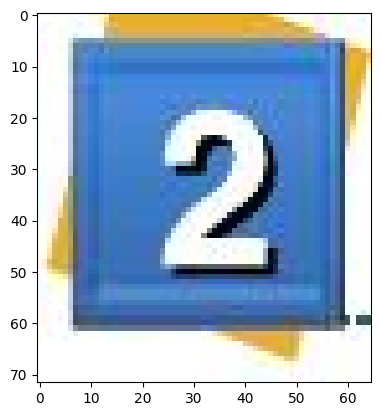

Summary: 주황색 바탕에 굵은 검정색 숫자 2가 크게 표시된 간단한 이미지입니다. 이 숫자 아이콘은 일반적으로 목록이나 순서를 나타낼 때 사용됩니다.


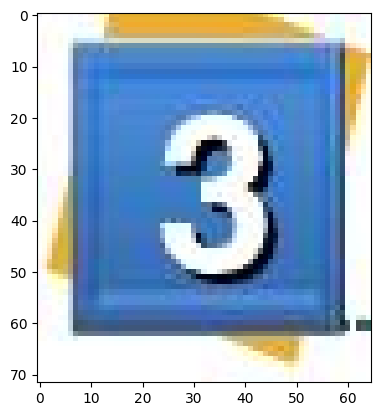

Summary: 주황색 배경에 큰 숫자 3이 파란색으로 표시된 간단한 이미지입니다.


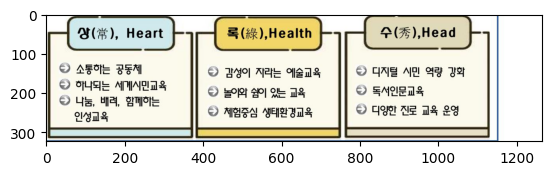

Summary: 이미지는 세 가지 주제인 마음(심), 건강(녹), 머리(수)에 대한 설명을 제공합니다. 각 주제에 대해 관련된 키워드와 개념들이 나열되어 있습니다. 마음과 관련해서는 소통, 공동체, 하나됨, 세계시민교육, 나눔, 배려, 앎 배우는 인성교육 등이 언급되어 있습니다. 건강과 관련해서는 건강이 자라는 예술피움, 놀이와 쉼의 여유, 제영營身 생체안전교육 등이 제시되어 있습니다. 마지막으로 머리와 관련해서는 디지털 시민 역량 강화, 독서인문교육, 디양한 진로 교육 운영 등이 나와 있습니다.


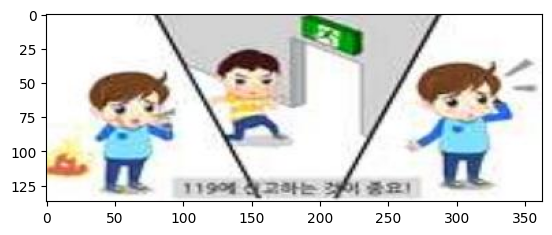

Summary: 이미지에는 세 명의 아이들이 각기 다른 행동을 취하고 있습니다. 왼쪽 아이는 물건을 내리고 있고, 가운데 아이는 비상구 표지판 아래에서 뛰어가고 있으며, 오른쪽 아이는 구경하는 듯한 모습입니다. 이 장면은 아이들이 위험한 상황에 놓여 있음을 암시합니다.


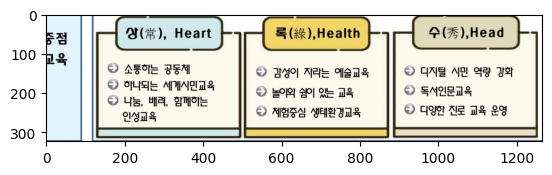

Summary: 이미지는 한국어로 상(심), 몸(체력), 머리(두부)의 세 가지 범주로 나뉘어져 있습니다. 각 범주에는 관련된 건강 문제나 증상들이 나열되어 있습니다. 상(심)에는 소화기 관련 증상, 아토피, 식욕 부진 등이 포함되어 있고, 몸(체력)에는 근육통, 불면증, 대사 장애 등의 증상이 있습니다. 머리(두부)에는 두통, 눈 건강 문제, 치과 문제 등이 기재되어 있습니다. 이 이미지는 신체 부위별로 겪을 수 있는 다양한 건강 문제들을 요약하여 제시하고 있습니다.


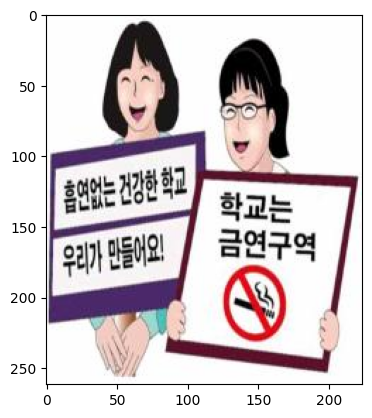

Summary: 이미지에는 금연과 건강한 생활 습관을 촉구하는 두 명의 여성이 있습니다. 한 여성은 "흡연은 건강을 해치고 습관이 됩니다"라는 문구가 적힌 판넬을 들고 있고, 다른 여성은 "한국은 금연국"이라는 메시지를 전하는 판넬을 들고 있습니다. 이들은 금연의 중요성과 건강한 생활 방식을 강조하는 캠페인에 참여하고 있는 것으로 보입니다.


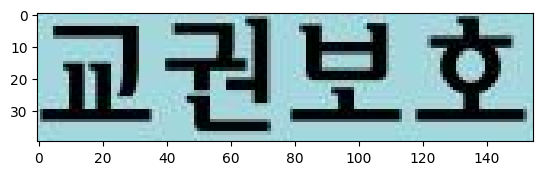

Summary: 주어진 이미지는 한국어로 "교권보호"라는 녹색 글씨로 된 헤드라인 또는 제목을 보여주고 있습니다. 글씨체는 직선적이고 단순한 스타일로, 배경은 어두운 녹색 계열의 단색으로 되어 있습니다. 이 이미지는 아마도 교사의 권위와 지위를 보호하는 것과 관련된 주제나 캠페인을 상징하는 것으로 보입니다.


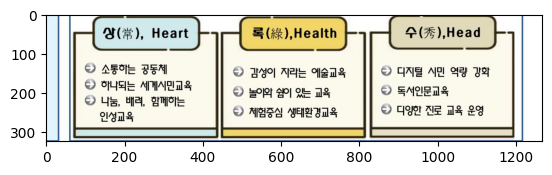

Summary: 이미지는 마음(심), 건강(녹), 머리(두)와 관련된 증상과 문제점들을 나열하고 있습니다. 마음(심)과 관련해서는 소통 애로, 외로움, 그리고 나쁜 습관들이 있음을 보여줍니다. 건강(녹)에서는 질병, 예술피부, 불안감, 재정적인 생활고를 다룹니다. 마지막으로 머리(두)에서는 디지털 중독, 독서인문교육, 그리고 잘못된 교육 운영 등의 문제점들을 제시하고 있습니다.


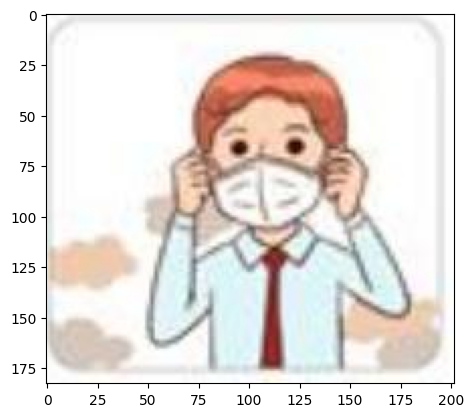

Summary: 주어진 이미지는 코로나19와 관련된 마스크 착용 안내 이미지로 보입니다. 마스크를 쓴 사람의 모습을 통해 마스크 착용의 중요성을 강조하고 있습니다. 이미지는 단순하고 명확한 메시지를 전달하고자 일러스트 형식으로 제작되었습니다.


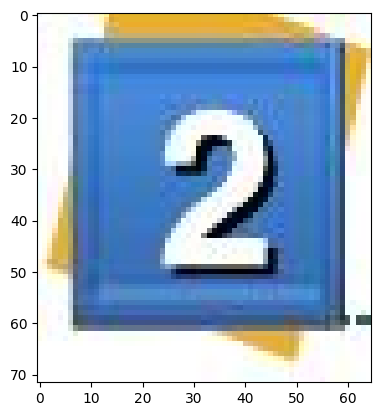

Summary: 주어진 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 2를 보여줍니다. 숫자는 굵고 단순한 서체로 표시되어 있습니다. 이 이미지는 숫자 또는 순서를 나타내는 데 사용될 수 있습니다.


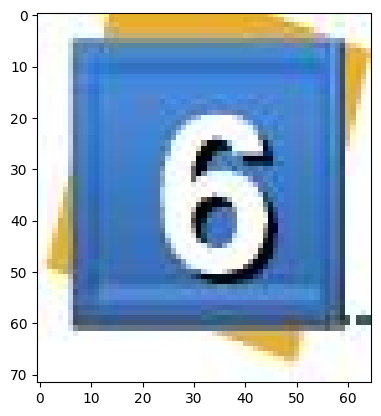

Summary: 주어진 이미지는 파란색 배경에 흰색 숫자 6이 큼직하게 표시되어 있습니다. 이 숫자는 아마도 어떤 순서나 번호를 나타내는 것 같습니다. 이미지는 매우 단순하고 직관적이며, 숫자 6이 전면에 크게 부각되어 있습니다.


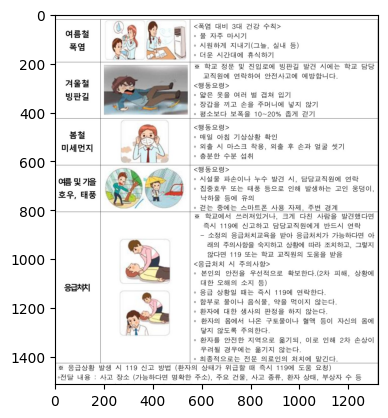

Summary: 이 표와 이미지는 여러 가지 응급상황 시 대처방법을 안내하고 있습니다. 상황별로 구분되어 응급조치법을 설명하고 있으며, 의료진, 환자, 보호자 등 다양한 인물이 묘사되어 있습니다. 전반적으로 응급상황 발생 시 신속하고 적절한 대응의 중요성을 강조하고 있습니다. 이해를 돕기 위해 구체적인 지침과 예시 상황을 제시하고 있습니다.


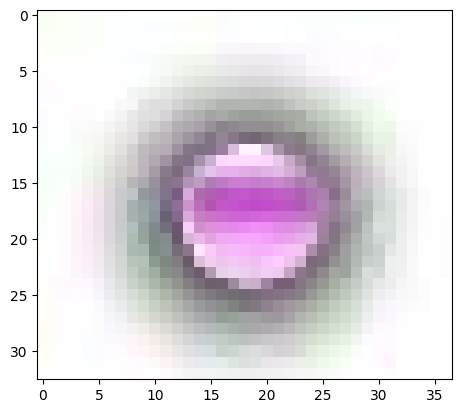

Summary: 주어진 이미지는 분홍색과 보라색 톤의 꽃잎이 나선형으로 겹쳐있는 아름다운 실크 꽃의 근접 촬영입니다. 꽃잎의 질감과 색상 대비가 매력적이고 부드러운 느낌을 줍니다. 중앙에는 노란색 꽃술이 있어 포인트를 주고 있습니다. 전체적으로 평화롭고 은은한 분위기를 자아내는 자연물 사진입니다.


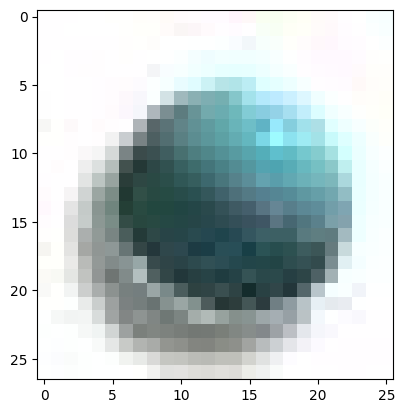

Summary: 주어진 이미지는 우주 공간을 배경으로 지구의 모습을 보여주고 있습니다. 지구 표면의 푸른 바다와 육지, 구름 무늬가 선명하게 드러나 있으며, 지구 주변을 우주 먼지가 환하게 빛나며 둘러싸고 있습니다. 이 이미지는 우주에서 바라본 지구의 아름다운 모습을 생생하게 포착하고 있습니다.


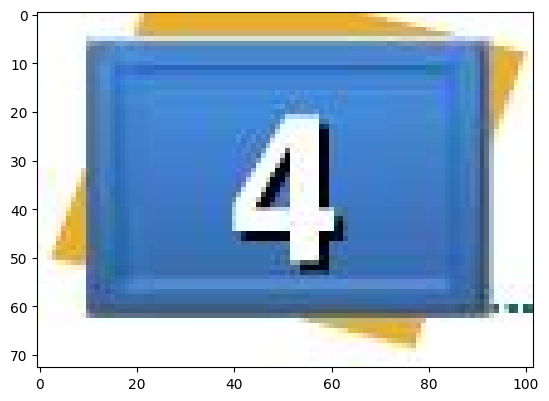

Summary: 주어진 이미지는 푸른색 플라스틱 프레임에 가운데 큰 숫자 "4"가 인쇄된 단색 번호판을 보여줍니다. 단순한 디자인이지만 번호를 명확하게 전달하는 데 목적이 있습니다.


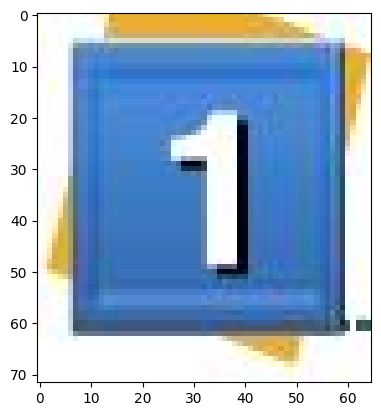

Summary: 제공된 이미지는 푸른 배경에 흰색 테두리로 둘러싸인 숫자 1이 있는 정사각형 아이콘을 보여줍니다. 이 아이콘은 목록이나 순서를 나타내는 데 사용될 수 있습니다.


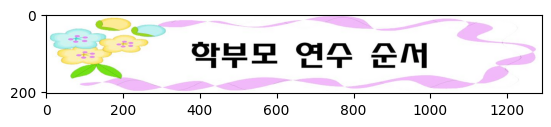

Summary: 주황색과 녹색 꽃 모양이 있고 비슷한 형태의 보라색 물결 문양이 있는 이미지입니다. 가운데에는 "약부모 연수 순서"라는 한국어 텍스트가 있습니다. 전체적으로 화사하고 밝은 느낌의 이미지입니다.


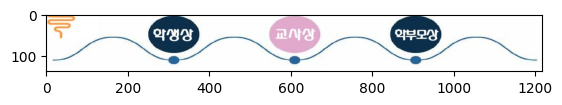

Summary: 이미지는 수평선을 따라 "억양상, 교사상, 억부모상"이라는 세 가지 개념을 보여주고 있습니다. 각각의 개념은 원형 모양으로 표시되어 있으며, 선으로 연결되어 있습니다. 이 이미지는 아마도 세 가지 개념 간의 관계나 연결성을 시각적으로 설명하고자 한 것으로 보입니다.


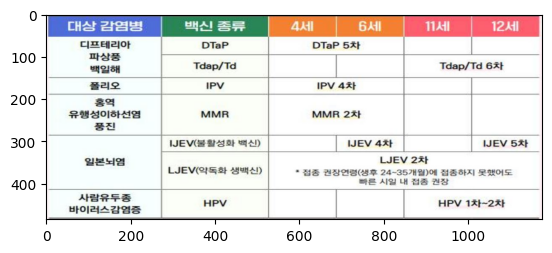

Summary: 이 표는 어린이와 청소년을 대상으로 한 예방접종 일정을 보여줍니다. 좌측 열에는 대상 감염병이 나열되어 있고, 상단 행에는 연령대별로 4세, 6세, 11세, 12세로 구분되어 있습니다. 각 셀에는 해당 연령대에서 접종해야 하는 백신의 종류와 횟수가 명시되어 있습니다. 예를 들어 4세에는 DTaP, IPV, MMR, IJEVP 백신을 접종하도록 되어 있습니다. 이 표를 통해 부모와 의료진이 적절한 예방접종 일정을 파악할 수 있습니다.


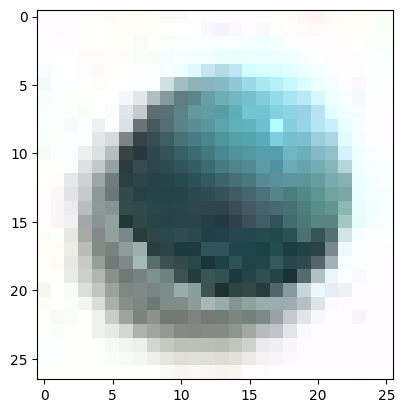

Summary: 제공된 이미지는 초록색 바탕에 푸른색과 흰색 물결 무늬가 있는 글래스 구체를 나타내고 있습니다. 이 구체는 3차원적이며 투명한 재질로 보입니다. 아름답고 현대적인 추상적 이미지입니다.


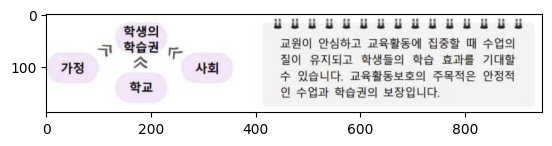

Summary: 이 이미지는 학생의 학습권, 사회, 가정, 학교 등 다양한 요소들이 서로 연결되어 있음을 보여주고 있습니다. 교육활동보다는 학생을 중심으로 한 수업의 질을 향상시키는 것이 중요함을 시사하고 있습니다.


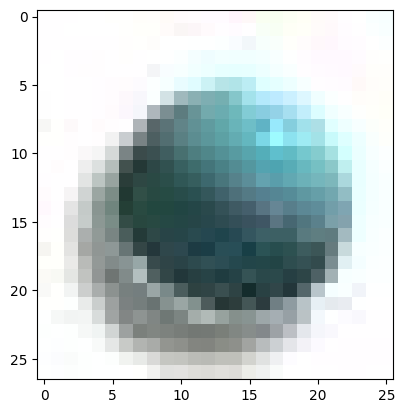

Summary: 주어진 이미지는 녹색 배경에 원형 물체가 있는 모습입니다. 이 물체는 대리석과 같은 질감의 표면을 가지고 있으며, 표면에는 작은 균열과 패인 부분이 있습니다. 전체적인 모양은 행성 지구를 연상시킵니다.


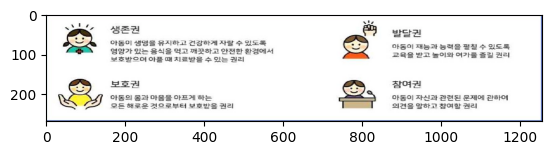

Summary: 이미지는 아동의 성장을 돕고 안전하게 보호하는 4가지 권리를 설명하고 있습니다. 성장권, 발달권, 보호권, 참여권 등이 아이콘과 간단한 문구로 표현되어 있습니다.


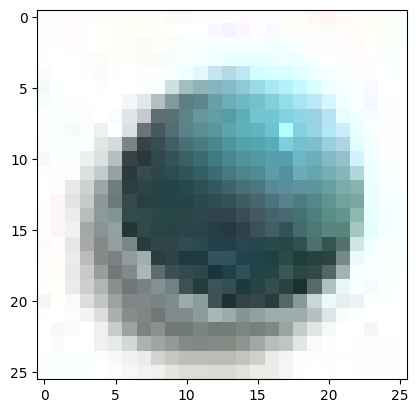

Summary: 주어진 이미지는 행성지구를 모티브로 한 유리 구슬 같은 녹색 유리 장식품을 보여줍니다. 구체적으로 푸른 바다와 초록의 대륙이 표현되어 있어 지구의 모습을 나타내고 있습니다. 유리 장식품은 빛에 반사되어 선명한 색상과 디테일을 드러내며 아름다운 외관을 자랑합니다.


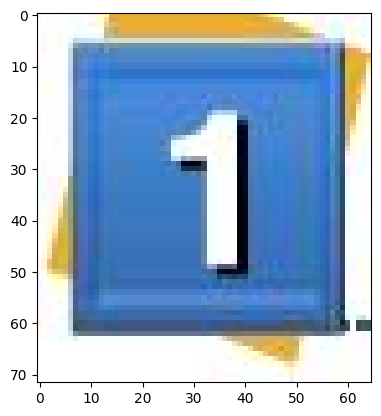

Summary: 주황색 배경에 큰 파란색 숫자 '1'이 강조되어 있는 이미지입니다. 숫자 1은 현수막이나 간판에 자주 사용되는 단순하고 대담한 디자인으로 표현되어 있습니다. 이 이미지는 첫 번째, 최고, 우선순위와 같은 의미를 전달하는 데 사용될 수 있습니다.


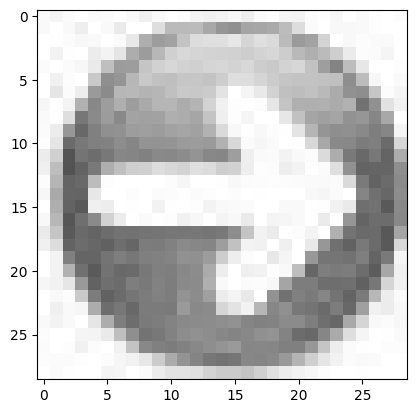

Summary: 주어진 이미지는 작은 단추에 달린 원형 투명 블록체입니다. 이 투명 블록체 내부에는 원형의 회색 건전지 모양 물체가 들어있습니다. 블록체는 광선을 굴절시켜 그 내부 물체를 확대해서 보여주는 것 같습니다. 전반적으로 단순하면서도 현대적인 디자인을 가진 물체로 보입니다.


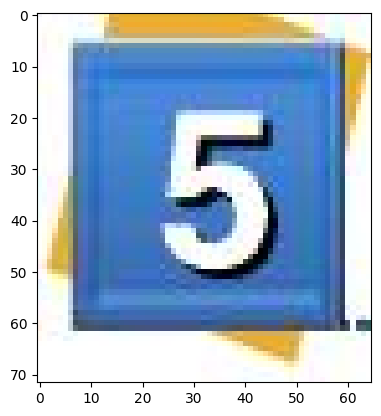

Summary: 해당 이미지는 하늘색 배경에 흰색 테두리가 있는 파란색 숫자 5가 확대된 모습을 보여줍니다. 이 숫자는 3D 효과를 주어 입체적으로 표현되었습니다. 단순하지만 뚜렷한 숫자 5의 이미지입니다.


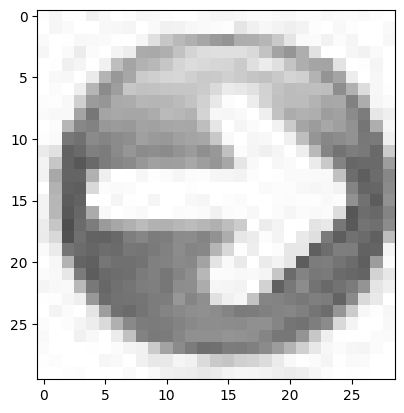

Summary: 이 이미지는 하얀 배경 위에 회색 구체가 있는 단순한 렌더링 된 그래픽입니다. 구체의 표면이 매끄럽고 은색 반사 효과가 있어 금속처럼 보입니다. 중력에 의해 구체가 약간 아래로 찌그러진 형태를 취하고 있어 현실감 있게 표현되었습니다.


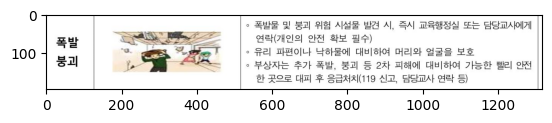

Summary: 이 이미지는 국가 교육행정실을 대상으로 한 풍자 만평을 보여줍니다. 이 만평에는 여러 가지 편견과 고정관념을 은유적으로 풍자하고 있습니다. 한 사람이 다른 사람들의 눈, 귀, 입을 막는 모습을 통해 교육 당국이 일방적으로 정책을 펴나가고, 학생과 교사들의 목소리를 외면하고 있음을 비판하고 있습니다.


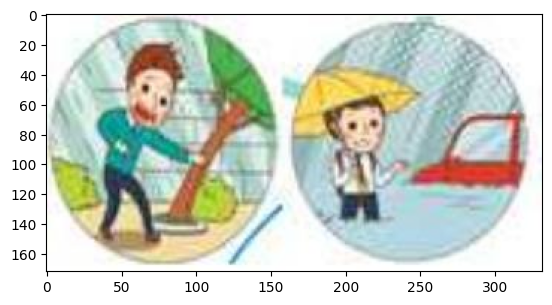

Summary: 주어진 이미지는 두 개의 원형 아이콘으로 구성되어 있습니다. 왼쪽 아이콘에는 녹색 배경에 빗자루를 들고 있는 남성 캐릭터가 있고, 오른쪽 아이콘에는 노란색 배경에 우산을 쓴 남성 캐릭터와 자동차가 있습니다. 이 아이콘들은 청소 서비스와 운송 서비스를 상징하는 것으로 보입니다.


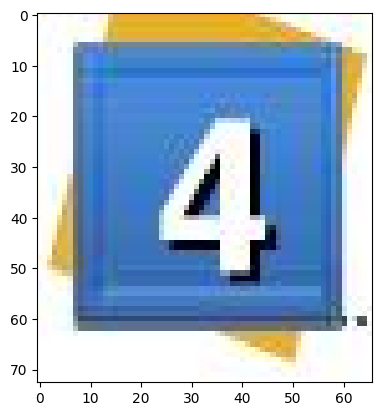

Summary: 이미지는 파란색 배경 위에 굵은 하얀색 숫자 '4'가 있는 간단한 이미지입니다. 숫자 4는 모서리가 둥근 사각형 모양의 프레임 안에 있습니다. 이 이미지는 번호나 순서를 나타내는 데 사용될 수 있습니다.


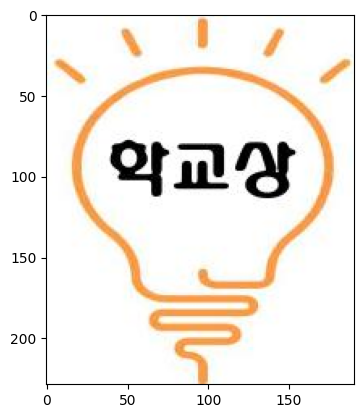

Summary: 이미지는 노란색 전구 모양의 아이콘 안에 "학교상"이라는 한국어 단어가 쓰여 있습니다. 이 아이콘은 교육이나 학습 관련 개념을 나타내는 것으로 보입니다.


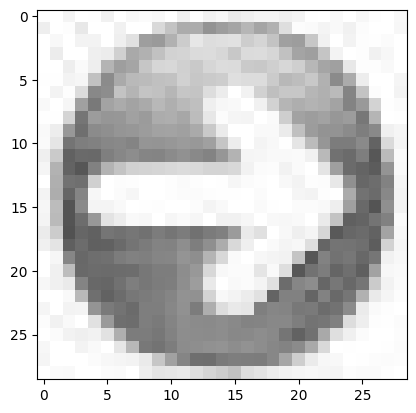

Summary: 제공된 이미지는 깨끗하고 단순한 매크로 샷으로, 빗방울 모양의 투명한 물방울이 있습니다. 물방울 안에는 한국의 국기인 태극기가 선명하게 반사되어 보입니다. 이 이미지는 아마도 한국의 정신과 자부심을 상징적으로 나타내고자 한 것 같습니다.


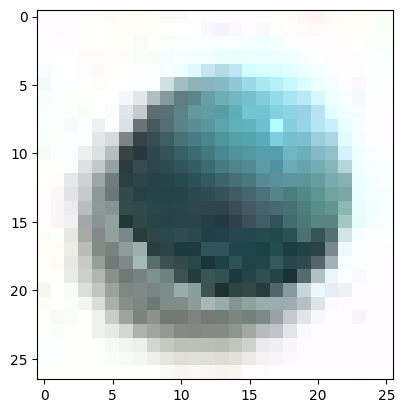

Summary: 주어진 이미지는 푸른색 바탕에 지구 본체와 대륙들이 녹색으로 표현된 단순화된 지구본 모습을 보여줍니다. 지구본의 디자인은 미니멀리즘 스타일로 깔끔하고 현대적인 느낌을 줍니다. 이 이미지는 환경 또는 지구 보호 개념을 상징할 수 있습니다.


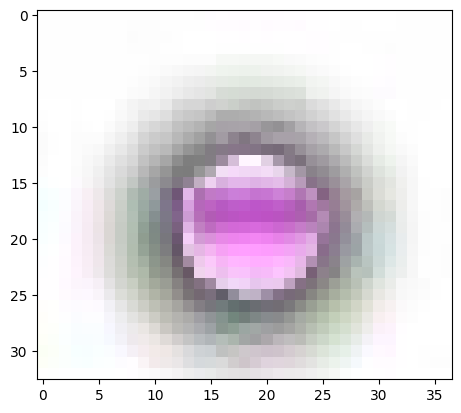

Summary: 주어진 이미지는 흰색 배경에 핑크색과 보라색 연기 고리가 있는 추상적인 디지털 아트 작품입니다. 연기 고리는 중앙에 위치하고 있으며 아름다운 곡선과 색상 그라데이션이 특징적입니다. 전체적으로 모던하고 미니멀한 분위기를 자아내며 흐르는 듯한 유동적인 형태가 인상적입니다.


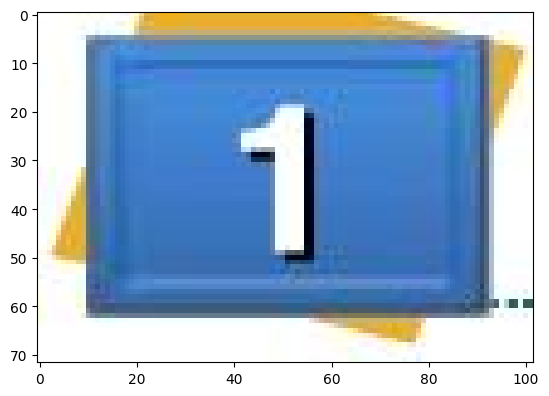

Summary: 주어진 이미지는 푸른색 스탠드에 큰 숫자 "1"이 프린트된 흰색 이동식 칠판을 보여주고 있습니다. 이러한 이동식 칠판은 교실이나 회의실 등에서 간단한 글씨나 숫자를 적는 데 사용되는 편리한 도구입니다.


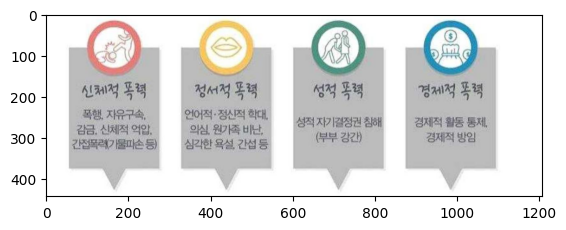

Summary: 이 이미지는 네 가지 유형의 건강 예방 지침을 보여주고 있습니다. 첫째는 금연, 절주, 건강한 식생활 등 신체적 복절, 둘째는 입술 모양의 아이콘으로 정신적 복절인 웃음과 긍정적인 마음가짐을 상징합니다. 셋째는 두 사람이 손을 잡은 모습으로 성적 예방을 나타내고, 넷째는 경제적 복절 즉 적정 소득과 경제적 행복을 의미합니다. 이 지침들은 전반적인 건강과 행복을 위한 권고사항을 제시하고 있습니다.


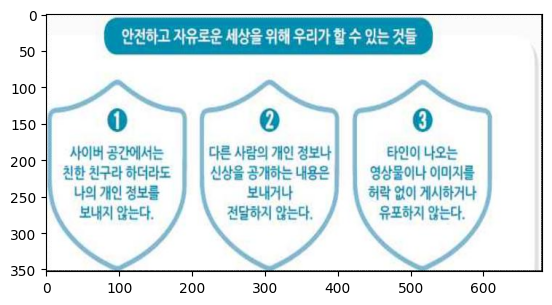

Summary: 안전하고 자유로운 세상을 위해 우리가 할 수 있는 것들을 설명하는 이미지입니다. 1) 시민버그를 신고하여 위험을 예방할 수 있습니다. 2) 타인의 사생활 정보 유출을 자제하여 개인정보를 보호해야 합니다. 3) 타인에 대한 악의적인 인터넷 공격을 자제하고 서로를 존중해야 합니다.


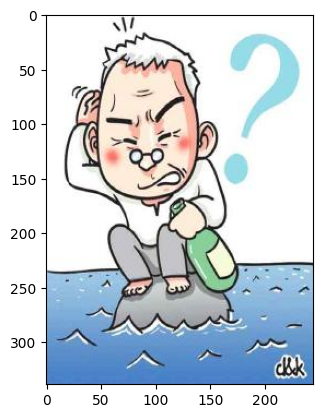

Summary: 이미지에는 화가 난 표정의 할아버지가 바다에서 표류하는 모습이 그려져 있습니다. 할아버지는 구명조끼를 입고 있으며, 물 위에 떠 있는 모습에서 당혹스러운 상황을 엿볼 수 있습니다. 이 그림은 해학적이면서도 유머러스한 분위기를 자아내고 있습니다.


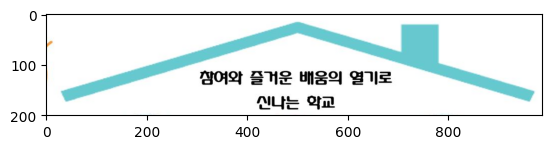

Summary: 이미지는 지붕 모양의 터키 블루 색상 프레임에 "잘 먹고 일하는 약국"이라는 한국어 문구가 있습니다. 간단하고 직관적인 그래픽 디자인으로, 약국의 역할과 업무를 상징하는 것 같습니다.


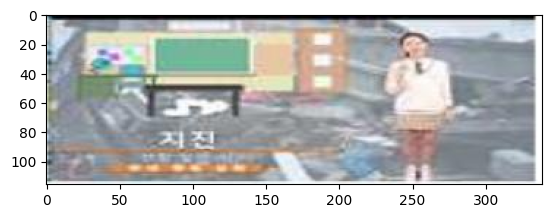

Summary: 이미지에는 폭우로 인해 침수된 거리 모습이 담겨 있습니다. 우비를 입은 한 남성이 허리 높이까지 차오른 물에 서 있는 모습이 보입니다. 가게 간판과 건물이 부분적으로 물에 잠긴 것으로 보아 심각한 수준의 침수 상황임을 알 수 있습니다. 이렇게 극심한 폭우 피해 상황이 한국의 어느 지역인지는 알 수 없지만, 자연재해로 인한 큰 피해 모습이 그대로 드러나 있습니다.


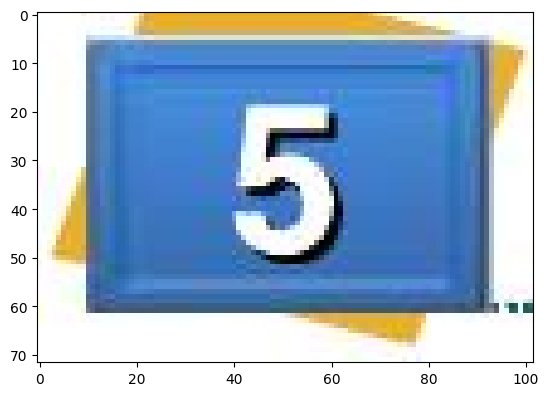

Summary: 제공된 이미지는 푸른 바탕에 흰색 숫자 5가 새겨진 간단한 표지판을 보여주고 있습니다. 표지판의 모서리가 둥글고 손잡이가 있어 들고 다닐 수 있는 형태입니다. 이런 식의 간단한 표지판은 프레젠테이션이나 강의 중에 활용되는 시각 보조 자료일 가능성이 높습니다.


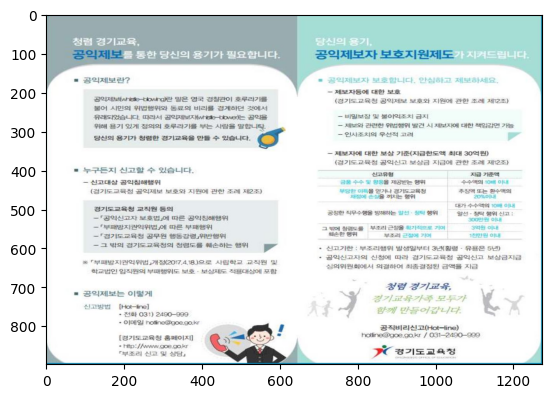

Summary: 이미지는 경기도교육청에서 제공하는 공익제보 안내 자료입니다. 왼쪽 부분은 공익제보의 정의와 누구든지 신고할 수 있음을 설명하고, 오른쪽에는 공익제보자 보호제도와 실제 제보 방법을 안내하고 있습니다. 하단에는 공익신고 핫라인 번호와 웹사이트 주소가 있어 제보 경로를 자세히 안내하고 있습니다. 전체적으로 공익제보 활성화를 위한 안내 자료의 성격을 지니고 있습니다.


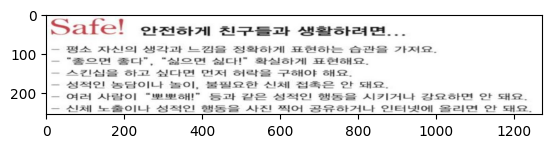

Summary: 이미지는 한국어로 된 안전 수칙을 나열하고 있습니다. 평소 자신의 생각과 느낌을 진실하게 표현하라고 권고하며, "좋으면 좋다", "싫으면 싫다"라고 말하기를 제안합니다. 또한 스트레스를 해소하고 웃음 지을 것을 당부하며, 성적인 농담이나 놀이는 불쾌할 수 있으니 자제할 것을 당부하고 있습니다. 마지막으로 상대방의 행동을 시기하거나 견제하기보다는 인정하고 격려하는 자세가 중요함을 강조하고 있습니다.


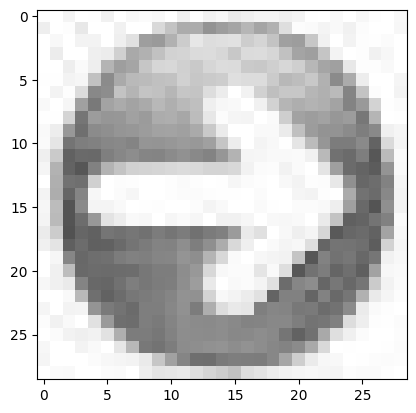

Summary: 주어진 이미지는 흑백으로 되어있으며 원형 모양의 플라스틱 또는 금속 물체를 보여주고 있습니다. 그 물체는 외곽 가장자리가 톱니바퀴 모양으로 이루어져 있으며, 중앙에는 둥근 구멍이 있는 것으로 보입니다. 이 물체는 톱니바퀴나 기어와 같은 기계 부품일 것으로 추측됩니다.


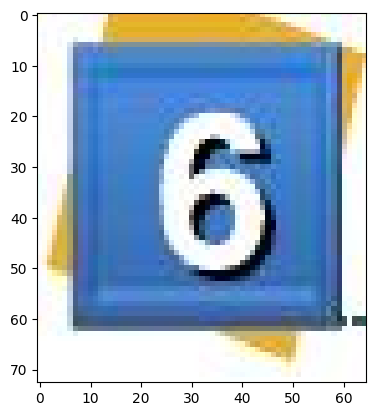

Summary: 파란색 바탕에 큰 흰색 숫자 6이 있는 간단한 이미지입니다. 이 이미지는 숫자나 순서를 표현하는 데 사용될 수 있습니다.


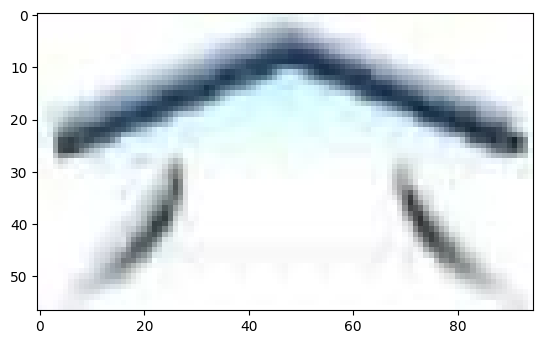

Summary: 주어진 이미지는 파란색과 흰색 화살표로 이루어진 추상적인 모양을 나타내고 있습니다. 이는 아마도 어떤 방향이나 움직임을 상징하는 것 같습니다. 전체적으로 간결하고 단순한 디자인을 보여주면서도 역동적인 느낌을 자아내고 있습니다.


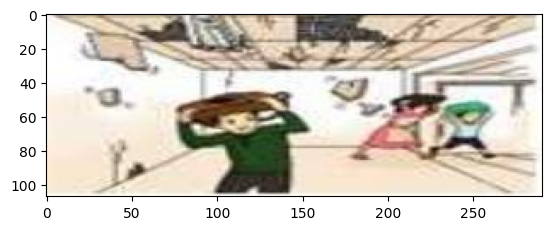

Summary: 이 이미지는 지하철 또는 기차 안에서 일어난 사건을 묘사한 만화 스타일의 그림입니다. 한 여성이 서 있는 모습이 그려져 있고, 바닥에는 넘어진 다른 사람들이 있습니다. 이 장면은 갑작스러운 충격이나 사고로 인해 승객들이 넘어진 상황을 보여주는 것으로 보입니다. 그러나 개인 정보 보호를 위해 특정 개인을 식별할 수 있는 정보는 제공하지 않겠습니다.


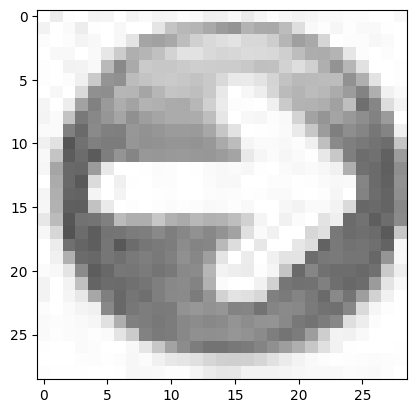

Summary: 주어진 이미지는 달 모양의 벽 장식품을 보여줍니다. 은색과 회색 톤의 금속으로 만들어진 이 장식품은 달의 크레이터와 같은 질감을 표현하고 있습니다. 단순하지만 세련된 디자인으로 실내 공간을 꾸미는 데 활용될 수 있을 것 같습니다.


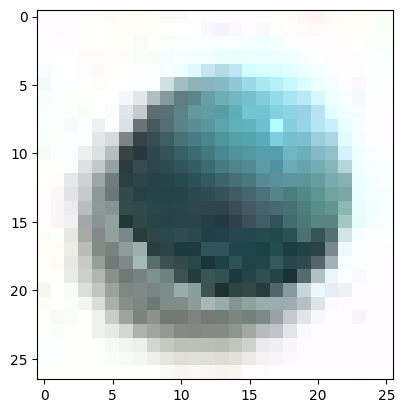

Summary: 주어진 이미지는 녹색 물감 혹은 페인트가 섞인 물이 담긴 투명한 유리 그릇을 보여주고 있습니다. 유리 표면에 반사된 모습을 통해 원형의 유리 그릇임을 알 수 있습니다. 그릇 안의 액체는 물결 모양으로 움직이는 듯한 모습을 띠고 있어 생동감 있는 느낌을 줍니다.


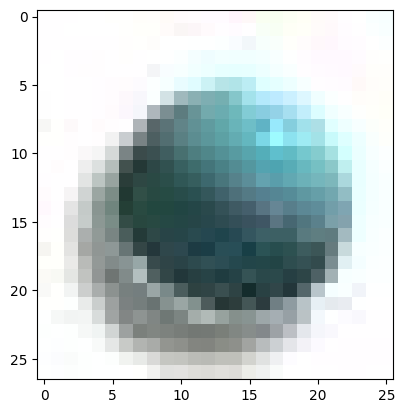

Summary: 주어진 이미지는 에메랄드 녹색의 광활한 구 또는 행성과 같은 물체를 보여줍니다. 표면은 반짝이는 패턴으로 이루어져 있으며, 행성의 일부는 반사되어 금속 재질처럼 보입니다. 전체적으로 우주 공간에 떠 있는 신비로운 천체 같은 인상을 줍니다.


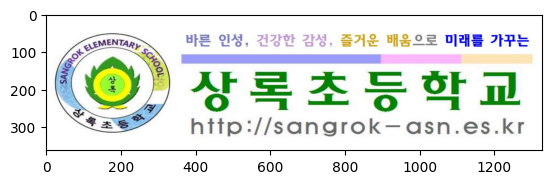

Summary: 주어진 이미지는 상록초등학교의 로고와 웹사이트 주소를 보여주고 있습니다. 로고는 녹색 잎사귀 모양으로 되어 있으며, "바른 인성, 건강한 감성, 즐거운 배움으로 미래를 가꾸는" 라는 문구가 있습니다. 하단에는 학교 웹사이트 주소인 "http://sangrok-asn.es.kr"가 적혀 있습니다.


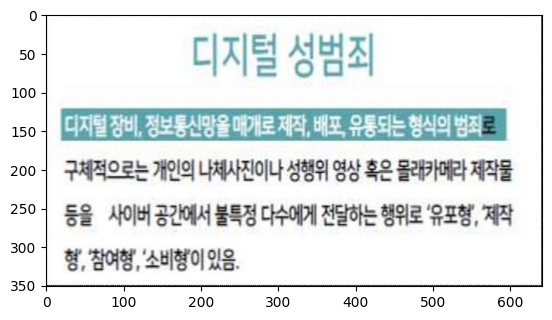

Summary: 이미지는 '디지털 성범죄'에 대해 설명하고 있습니다. 디지털 성범죄란 불법 촬영물 유포, 성착취 영상물 제작 등을 말합니다. 이와 관련하여 협박, 유포, 제작 등의 범죄 행위가 언급되어 있습니다. 성범죄로 인한 피해를 예방하고 근절하기 위한 내용으로 보입니다.


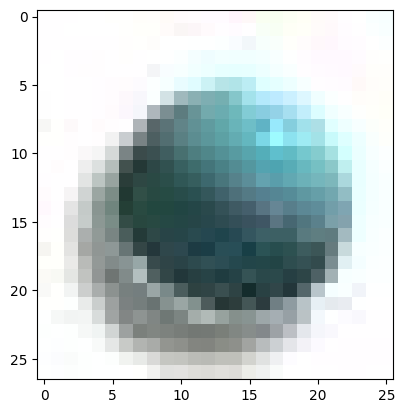

Summary: 제시된 이미지는 녹색 바탕 위에 세상을 상징하는 푸른색 지구본 모형이 있습니다. 지구본 주변으로 여러 개의 작은 블록 조각들이 부유하고 있는 모습입니다. 이 이미지는 지구와 그 구성 요소들의 관계 및 상호 연결성을 표현하고 있는 것으로 보입니다.


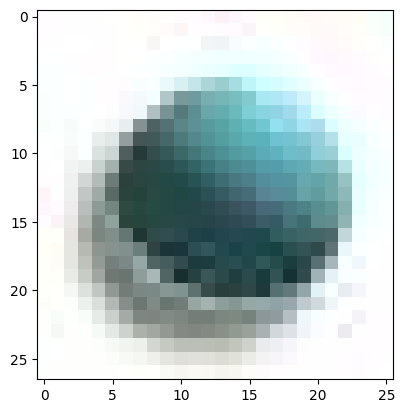

Summary: 이 이미지는 대리석 질감의 표면 위에 있는 아름다운 녹색 보석을 보여주고 있습니다. 이 보석은 둥근 구체 모양으로 투명한 녹색 빛을 내며, 아름답게 세공된 입체적인 무늬 패턴이 새겨져 있습니다. 이 보석은 고급스럽고 예술적인 느낌을 주며, 보석의 섬세한 디테일과 반짝이는 광택이 매력적입니다.


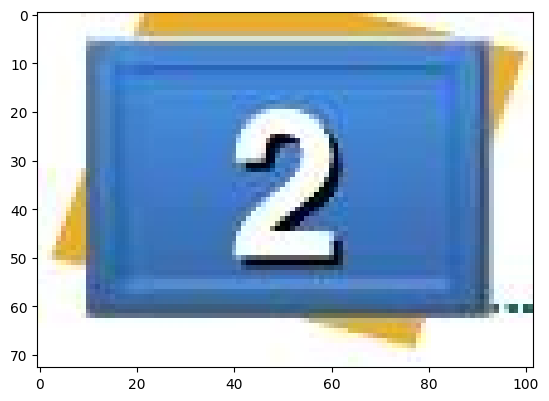

Summary: 이미지는 파란색 배경에 큰 흰색 숫자 '2'가 있는 간단한 디자인의 간판을 보여줍니다. 이 간판은 아마도 번호, 순서 또는 위치를 표시하기 위한 용도로 사용되는 것 같습니다.


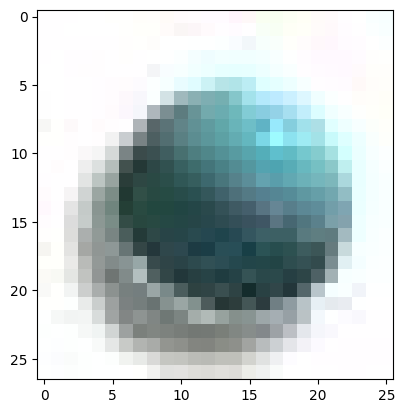

Summary: 주어진 이미지는 녹색 바탕에 보석 모양의 탁구공과 같은 물체를 보여줍니다. 이 물체는 반투명하고 내부에 다른 층들이 있어 아름답고 신비로운 느낌을 줍니다. 전체적으로 단순하지만 정교하고 예술적인 이미지입니다.


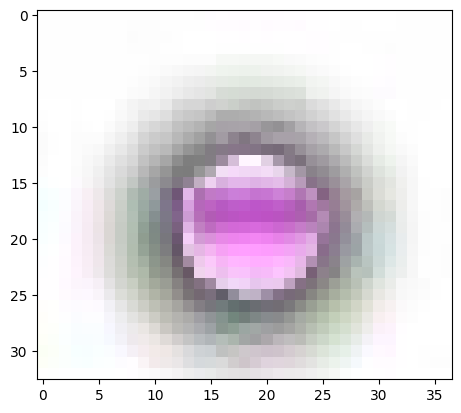

Summary: 주어진 이미지는 둥근 핑크색 바탕에 보라색 꽃잎 모양의 무늬가 있는 방수 스티커 모양의 아이콘입니다. 중앙에는 흰색 바탕의 보라색 원이 있으며, 그 안에 작고 하얀 점이 있습니다. 이 이미지는 화려하고 부드러운 느낌을 주며, 아마도 뷰티 또는 스킨케어 제품의 브랜드 로고일 것 같습니다.


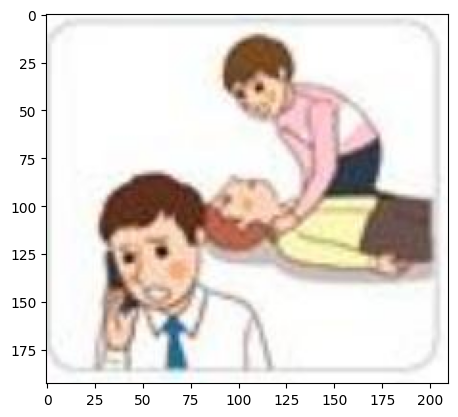

Summary: 이미지에는 두 명의 남성이 있습니다. 한 남성이 다른 남성의 손을 잡고 있는 모습입니다. 이것은 협력이나 격려를 상징하는 것으로 보입니다. 그들의 옷차림으로 보아 직장 동료일 가능성이 높습니다.


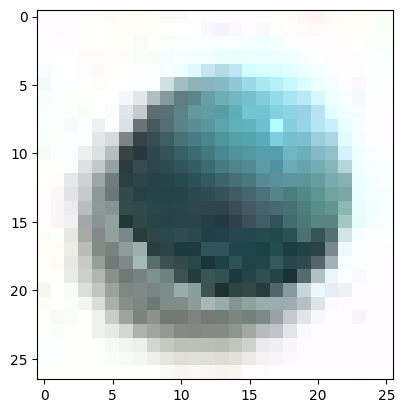

Summary: 주어진 이미지는 푸른색 바탕에 투명한 유리구슬 모양의 물체가 있습니다. 이 물체는 작은 물방울 모양의 반사가 있어 마치 우주 공간을 연상케 합니다. 전체적으로 단순하지만 신비로운 분위기를 자아내는 추상적인 이미지입니다.


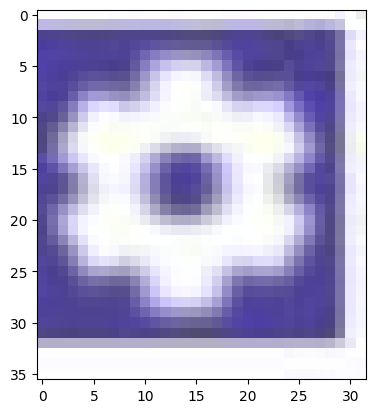

Summary: 해당 이미지는 파란색 배경에 하얀색 축구공 모양의 아이콘이 있습니다. 이는 전 세계적으로 널리 알려진 축구 또는 풋볼 스포츠를 상징하는 단순하면서도 대표적인 디자인입니다. 이 아이콘은 스포츠 관련 프로그램, 웹사이트 또는 서비스 등에서 축구와 관련된 콘텐츠나 정보를 나타내는 데 사용될 수 있습니다.


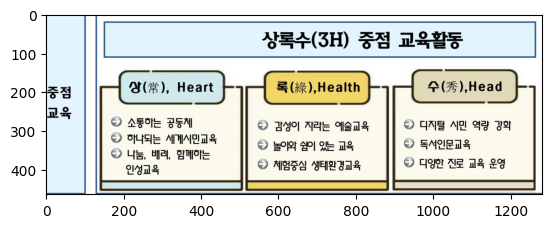

Summary: 이 이미지는 한의학에서 상극수(3허) 중점 교육할동에 대해 설명하고 있습니다. 심(心), 폐(肺), 수(肰)의 세 가지 주요 부위별로 관련된 증상과 치료법을 나열하고 있습니다. 심(心)에는 소통하는 공두계, 어린아이 세계시민교육, 나듦, 배려, 압매하는 인성교육 등이 해당됩니다. 폐(肽)에는 감성이 자라는 예술교육, 놀이와 쉽이 있는 교육, 재영증심 생태환경교육 등이 해당됩니다. 수(肰)에는 디지털 시민 역량 강화, 독서인문교육, 디양한 지문 교육 운영 등이 포함되어 있습니다.


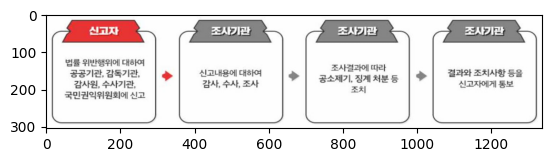

Summary: 이 이미지는 조사 과정을 순서대로 보여주는 프로세스 다이어그램입니다. 첫 번째 박스에는 '신고자'라고 적혀 있고, 다음 박스에는 '조사기관'이라고 씌여 있습니다. 세 번째 박스는 조사 결과에 대한 공소제기, 징계 처분 등의 조치를 설명하고 있고, 마지막 박스에는 '결과와 조치사항 통보'라고 명시되어 있습니다. 전체적으로 신고 접수에서부터 조사, 결과 조치까지의 일련의 과정을 단계별로 설명하는 흐름도입니다.


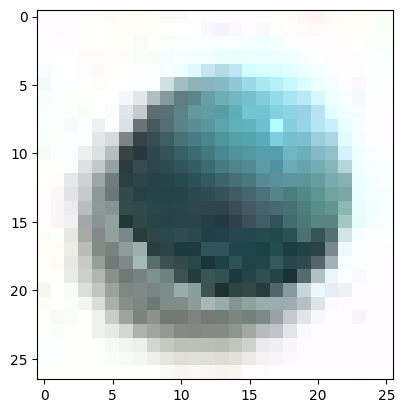

Summary: 주어진 이미지는 푸른색과 녹색 계열의 색상이 섞인 둥근 구체 모양의 대상을 보여주고 있습니다. 표면에는 작은 돌기들과 균열 같은 패턴이 보이며, 마치 행성의 모습과 비슷한 느낌을 줍니다. 이 이미지는 추상적이고 예술적인 분위기를 자아내며, 우주나 자연의 경이로움을 연상시킵니다.


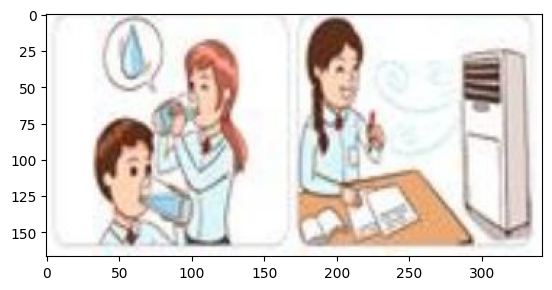

Summary: 이 이미지는 사무실 장면을 보여주고 있습니다. 세 명의 직원들이 물 디스펜서 옆에 서서 이야기를 나누고 있는 모습입니다. 한 직원은 서류를 들고 있으며, 다른 직원은 팔짱을 끼고 있습니다. 이들의 표정과 자세를 통해 직장 동료 간의 일상적인 대화 장면을 엿볼 수 있습니다.


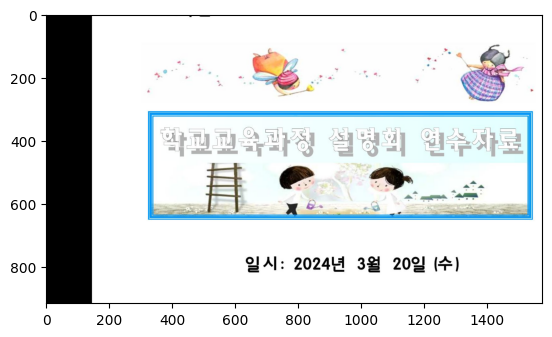

Summary: 이미지에는 학교교육과정 실행계획이라는 제목의 파란색 프레임이 있습니다. 프레임 안에는 동화 같은 스타일로 그려진 두 명의 아이들이 마을 풍경을 배경으로 놀고 있는 모습이 묘사되어 있습니다. 이미지 상단에는 꽃과 요정 캐릭터가 있으며, 날짜는 2024년 3월 20일로 표시되어 있습니다. 전반적으로 밝고 평화로운 분위기를 자아내고 있습니다.


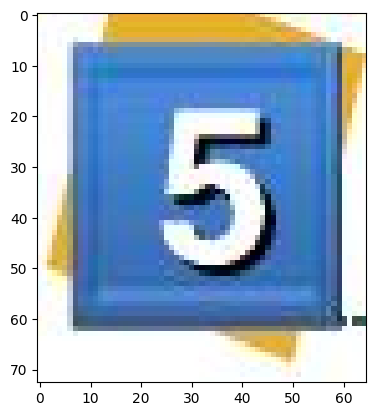

Summary: 제공된 이미지는 파란색 배경에 흰색 테두리가 있는 큰 숫자 5가 표시되어 있습니다. 숫자 5는 간단하고 굵은 서체로 되어 있으며, 명확하게 보입니다. 이 이미지는 숫자, 색상 등을 강조하거나 식별하는 용도로 사용될 수 있습니다.


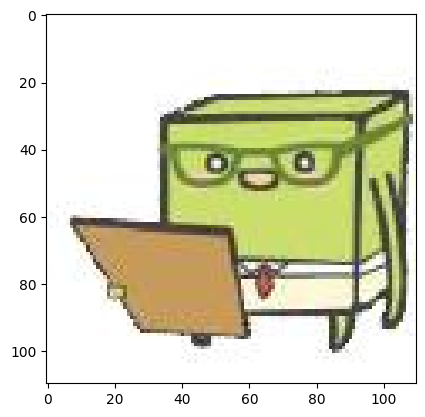

Summary: 주황색과 초록색으로 표현된 재미있고 단순한 인간 모습의 캐릭터들이 있습니다. 이 캐릭터들은 서로 다른 모양과 표정을 가지고 있으며, 친근감 있고 유머러스한 분위기를 자아내고 있습니다. 이러한 단순하고 재치 있는 스타일의 그림은 아이들이나 젊은 층을 대상으로 한 콘텐츠에 잘 어울릴 것 같습니다.


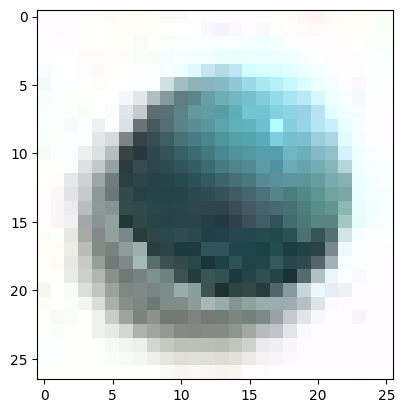

Summary: 주어진 이미지는 녹색 바탕에 구체적인 물체가 있습니다. 이 물체는 둥근 모양의 금속 재질로 보이며, 밝은 빛이 반사되어 광택이 있습니다. 전체적으로 단순하지만 매끈한 구체 형태의 물체가 강조되어 있습니다. 구체의 정확한 용도나 의미는 알 수 없지만, 현대적이고 미니멀한 느낌을 줍니다.


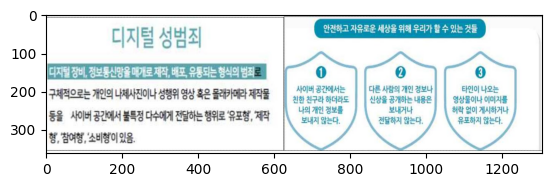

Summary: 이미지는 디지털 성범죄에 대한 설명을 담고 있습니다. 디지털 성범죄의 정의와 디지털 성범죄로 인한 피해 유형 3가지를 제시하고 있습니다. 1) 사이버 공간에서는 원격 전자기기로 불법촬영이 가능하다는 점, 2) 다른 사람의 개인 정보나 신상을 공개하는 행위가 있다는 점, 3) 타인의 나체나 음란물이 유포되어 피해를 입을 수 있다는 점을 강조하고 있습니다.


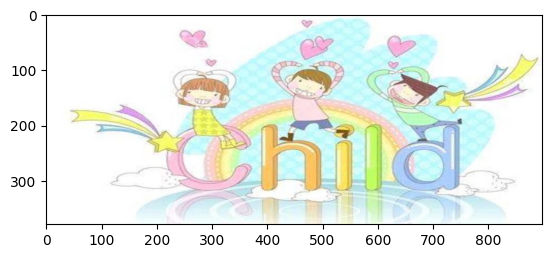

Summary: 이미지는 아이들과 관련된 장면을 보여줍니다. 아기천사 모습의 세 명의 아이들이 무지개와 구름 위에서 행복하게 웃고 있습니다. 밝고 발랄한 색상과 하트 모양의 장식이 있어 유쾌하고 사랑스러운 분위기를 자아냅니다. 아동 관련 콘텐츠나 제품을 홍보하기에 적합한 이미지입니다.


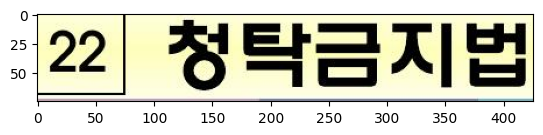

Summary: 이미지는 숫자 22와 한국어 "청탁금지법"이라는 텍스트를 보여줍니다. 배경은 단색이며 텍스트 스타일은 간단하고 명료합니다. 이는 아마도 공공 캠페인이나 정부 정책을 나타내는 것 같습니다.


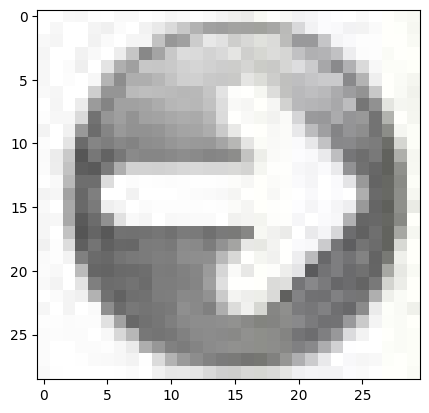

Summary: 주어진 이미지는 보잉 항공기 회사의 로고를 보여주고 있습니다. 로고는 둥근 원 모양 안에 스텔스 전투기 형상의 조종석과 날개가 스타일화되어 있습니다. 로고의 색상은 회색 톤으로 단순하면서도 우아한 느낌을 줍니다. 보잉 항공기 회사의 첨단 기술력과 혁신을 상징하는 로고 디자인입니다.


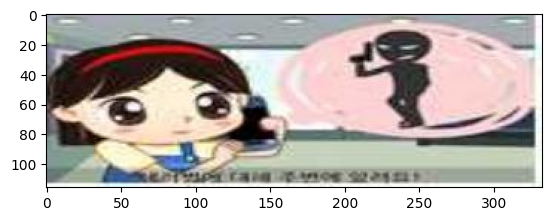

Summary: 제공된 이미지는 한 여성의 캐릭터가 등장하는 그림입니다. 여성의 캐릭터는 검은 머리카락과 커다란 눈동자를 가지고 있으며, 하늘색 옷을 입고 있습니다. 오른쪽에는 "소녀시대"라는 한국 걸그룹 로고가 있습니다. 이미지는 재미있고 캐주얼한 스타일로 디자인되어 있습니다.


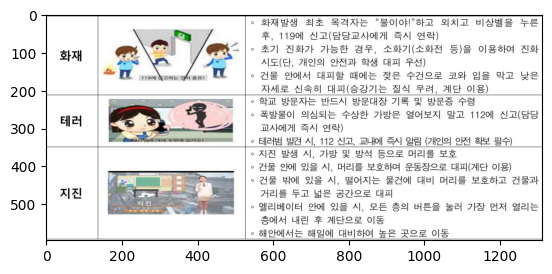

Summary: 이미지는 화제 시간, 데리 시간, 지진 시간에 대한 정보와 그림을 보여주고 있습니다. 화제 시간 그림에는 태극기를 든 아이들이 있고, 데리 시간 그림에는 분홍색 배경에 여자 아이가 있습니다. 지진 시간 그림에는 교실에서 책상 아래로 숨은 선생님이 보입니다. 각 시간대에 취해야 할 행동 지침이 함께 제시되어 있습니다.


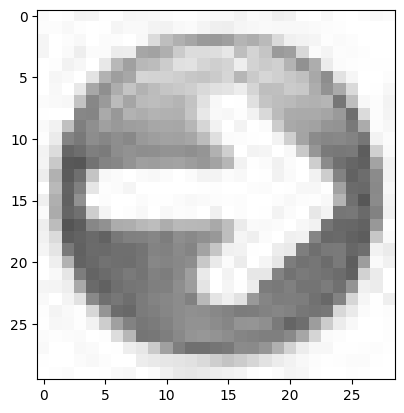

Summary: 주어진 이미지는 둥근 수영장을 가로지르는 장대길이 투영된 그림자 모습을 보여줍니다. 수영장 바닥에는 물결 무늬가 있고, 수영장 주변으로는 야자수 그림자가 드리워져 있습니다. 이 이미지는 해변 리조트나 열대 분위기를 연상케 합니다.


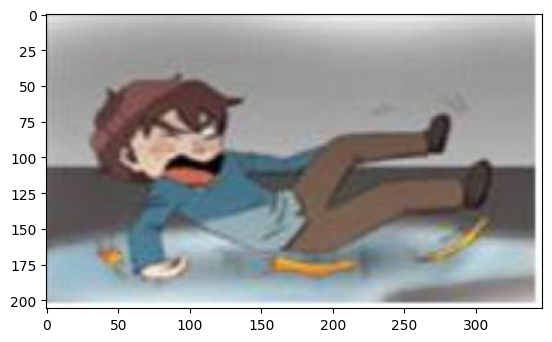

Summary: 이 이미지는 실수로 미끄러져 떨어지는 한 남자 아이의 모습을 재미있게 묘사하고 있습니다. 바나나 껍질에 걸려 넘어지는 고전적인 장면을 보여주며, 만화 스타일의 그림체로 유쾌한 분위기를 자아내고 있습니다. 이런 단순하지만 웃긴 상황을 통해 유머러스한 메시지를 전달하고 있습니다.


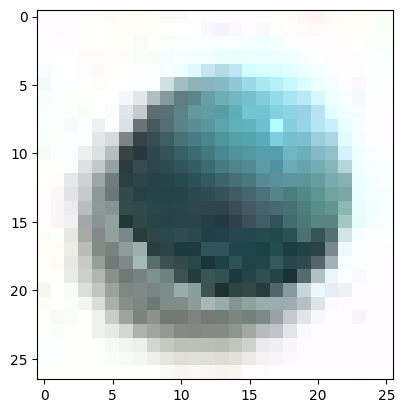

Summary: 주어진 이미지는 녹색 바탕에 하얀 원 안에 녹색으로 둥근 행성 같은 물체가 있습니다. 이 행성 모양의 물체 안에는 땅과 바다, 구름 등이 섬세하게 표현되어 있어 지구를 연상케 합니다. 전체적으로 환경 및 지구 보호 개념을 상징하는 것으로 보입니다.


In [68]:
verbose = True
if verbose:
    for img_base64, summary in zip(img_info, image_summaries):

        print ("============================")
        img = Image.open(BytesIO(base64.b64decode(img_base64)))
        plt.imshow(img)
        plt.show()

        print (f'Summary: {summary}')

`요약`된 내용을 Document의 `page_content`로, `OCR`결과는 metadata의 `origin_image`로 사용

In [69]:
images_preprocessed = []

for img_path, image_base64, summary in zip(images, img_info, image_summaries):
    
    metadata = {}
    metadata["img_path"] = img_path
    metadata["category"] = "Image"
    metadata["image_base64"] = image_base64
    
    doc = Document(
        page_content=summary,
        metadata=metadata
    )
    images_preprocessed.append(doc)

### For tables

In [70]:
human_prompt = [
    {
        "type": "text",
        "text": '''
                 Here is the table: <table>{table}</table>
                 Given table, give a concise summary.
                 Don't insert any XML tag such as <table> and </table> when answering.
                 Write in Korean.
        '''
    },
]
human_message_template = HumanMessagePromptTemplate.from_template(human_prompt)

In [71]:
prompt = ChatPromptTemplate.from_messages(
    [
        system_message_template,
        human_message_template
    ]
)

#summarize_chain = prompt | llm_text | StrOutputParser()
summarize_chain = {"table": lambda x:x} | prompt | llm_text | StrOutputParser()

In [72]:
if table_by_llama_parse and table_by_pymupdf:
    tables = tables + docs_table_llamaparse + docs_table_pymupdf
elif table_by_llama_parse:
    tables = tables + docs_table_llamaparse
elif table_by_pymupdf:
    tables = tables + docs_table_pymupdf

In [73]:
table_info = [(t.page_content, t.metadata["text_as_html"]) for t in tables]
table_summaries = summarize_chain.batch(table_info, config={"max_concurrency": 1})
if table_as_image: table_info = [(t.page_content, t.metadata["text_as_html"], t.metadata["image_base64"]) if "image_base64" in t.metadata else (t.page_content, t.metadata["text_as_html"], None) for t in tables]

제시된 표는 '특기와 소질을 가꾸어 미래를 준비하는 창의적인 어린이'를 교육 목표로 제시하고 있습니다.제공된 표는 학교의 연간 교육활동 계획을 보여주고 있습니다. 크게 1) 학교 교육 환경 개선, 2) 학교교육 참여 기회 확대, 3) 전문적 학습공동체 조직 운영, 4) 학생 자치 활동 능력 신장 및 인권/평화 교육, 5) 나눔, 배려, 함께하는 인성교육 및 학교폭력 예방교육 등의 영역으로 구성되어 있습니다. 각 영역별로 구체적인 활동 내용, 시기, 대상, 관련 부서 등이 명시되어 있습니다.이 표는 초등학교의 문화예술, 체육, 환경 교육 관련 활동 계획을 연간 시기별로 정리한 것입니다. 주요 내용은 다음과 같습니다.

21. 감성이 자라는 예술교육 
- 문화예술교실(악기교실), 아르떼 예술강사 무용 수업, 1인 1악기(칼림바) 등 예술 교육 강화

22. 놀이와 쉼이 있는 교육
- 학년별 놀이교실 운영, 수요일 블록타임 놀이시간 확보 등 

23. 체험중심의 생태환경교육
- 숲체험교실, 탄소중립 환경교육, 환경교육주간 운영 등
- 학교 교재원 운영(화단, 재배원, 수생식물원 관리)  

각 활동은 대상 학년, 시기, 관련 부서가 명시되어 있습니다.이 표는 학교에서 실시하는 다양한 교육활동 계획을 나타냅니다. 교육정보화 지원, 디지털 시민 역량 강화, 독서교육 활성화, 진로교육 등의 영역별로 구체적인 활동 내용, 시기, 대상 학년, 관련 부서가 제시되어 있습니다. 학생들의 전인적 성장을 위해 정보화 교육, 인문소양 교육, 진로 탐색 교육 등 다방면의 교육활동을 체계적으로 계획하고 있음을 알 수 있습니다.이 표는 2019학년도 1학기 월별 학사일정을 보여줍니다. 각 주별로 날짜와 요일, 수업일수, 학교 행사 및 공휴일 등의 정보를 제공합니다. 3월에는 입학식, 진단활동주간, 학부모총회 등이 있었고, 4월에는 국회의원 선거, 아동학대 예방교육주간, 체육대회, 숲체험교실 등의 행사가 있었습니다. 5월에는 어린이날, 석가탄신일, 인성교육주간, 방과후수업 공개, 소방훈련 

부터 12월 23일까지입니다.이 표는 방과후학교 운영일정에 대한 정보를 제공합니다. 운영기간은 4기로 나누어져 있고, 각 기간별 날짜가 명시되어 있습니다. 또한 운영시간도 주중과 방학 중으로 구분되어 있습니다. 수요조사와 만족도조사 실시 계획일정도 안내하고 있습니다.이 표는 오후돌봄에 대한 정보를 제공하고 있습니다. 대상은 1~2학년 중 맞벌이 및 저소득 가정 학생이며, 2024년 3월부터 12월까지 운영됩니다. 방과후부터 오후 5시 내외까지 운영되며, 방학 중에는 오전 9시부터 오후 2시 40분까지 운영됩니다. 3개 학급으로 편성되어 있고, 보드게임, 창의놀이, 음악줄넘기, 독서논술, 체육 등의 프로그램이 제공됩니다. 방학 및 재량휴업일에는 개인 도시락을 지참해야 합니다. 돌봄 담당자는 김영0 선생님입니다.주어진 표는 학생들이 학교생활을 하면서 확인할 수 있는 다양한 서비스 내역을 나열하고 있습니다. 크게 학교정보, 학교생활, 평가정보, 건강정보 등의 범주로 나누어져 있으며, 각 범주 안에서는 학교정보 조회, 시간표/출결/봉사활동 조회, 성적 및 학습진단 조회, 건강기록 및 PAPS 활동 조회 등의 세부 서비스를 제공하고 있습니다.이 표는 학생들을 대상으로 한 정보통신 윤리교육의 세부사항을 보여주고 있습니다. 방송 시청 및 학습지 활동을 통해 스마트폰 중독의 문제점과 바른 사용법을 교육하고, 교실에 스마트폰 사용 습관 진단 자료를 게시하여 학생 스스로 자신의 습관을 점검할 수 있도록 합니다. 또한 가정통신문을 통해 사이버 폭력 예방과 올바른 인터넷, 스마트폰 사용 방법을 학부모와 공유하고 있습니다.이 표는 공무원 행동강령 위반 시 적용되는 징계양정기준을 보여주고 있습니다. 금품수수, 모금강요, 직접개입, 간접개입 등의 위반행위에 대해 위반금액과 목적, 인지여부에 따라 경고에서 파면까지 징계수위를 규정하고 있습니다. 또한 불법찬조금 홍보 미실시에 대한 처분기준도 제시되어 있습니다.이 표는 아동학대의 유형을 신체학대, 정서학대, 성학대, 방임·유기로 나누어 각각

In [74]:
from utils.common_utils import print_html

0
table: 교육 목표 바른 인성으로 존중과 나눔을 실천하는 자주적인 어린이 몸과 마음이 건강하고 예술을 향유하는 문화적인 어린이 특기와 소질을 가꾸어 미래를 준비하는 창의적인 어린이
----------------------------
summary: 제시된 표는 '특기와 소질을 가꾸어 미래를 준비하는 창의적인 어린이'를 교육 목표로 제시하고 있습니다.
----------------------------
html:


J R 뽀 4,특 기 와 소 질 을 가 꾸 어 미 래 를 준 비 하 는 창 의 적 인 어 린이


----------------------------
image


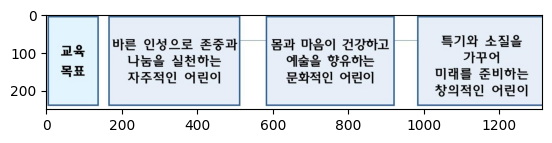

1
table: 구현중점 교육활동 시기 대상 관련부서 111. 학교 교육 환경개선 ◦교실 학습 환경 구성 ◦학년 및 학급 규칙 제정 및 준수 ◦인권 친화적 학생 생활인권규정 제정 준수 3월,9월 3월 연중 4~6학년 1~6학년 1~6학년 생활인권 공동체 112. 학교교육 참여기회 확대 ◦학교 운영위원회 활성화 ◦학교 교육 설명회 ◦학부모 학교교육 참여기회 확대 ◦수업 공개의 날 운영 연중10회 2회 연중 5월 학운위 학부모 학부모 학부모 생활인권 생활인권 생활인권 교육과정 113. 전문적 학습공동체 조직 운영 ◦학년별 협의회 구성 ◦자율과정과 연계되는 학습공동체 운영 ◦자율적인 참여로 집단지성 발휘 연중 전교사 교육과정 12. 121. 학생 자치 활동 능력 신장 ◦전교 어린이회 임원 선출 ◦전교 어린이회 운영 ◦학급임원선출 7월,12월 연중 3월,8월 3~6학년 1~6학년 2~6학년 생활인권 하나되는 세계시민 교육 122. 인권교육 및 평화 교육 ◦평화교육(민주시민교육) ◦인권교육주간 운영 ◦장애학생 이해교육 ◦다문화 이해교육 실시 연중 연중 연중 연중 1~6학년 생활인권 131. 체험위주의 인성교육 ◦인성교육 실천주간 ◦학급별 특색있는 인성교육 ◦친구사랑의 날 ◦예절교실 운영 연중 연중 4,11월 연중 1~6학년 생활인권 13. 나눔, 배려, 함께하는 인성교육 132. 학교폭력 예방교육 ◦교외 생활 지도 ◦학교폭력예방 프로그램 운영 ◦방학 전 생활안전교육주간 운영 ◦위클래스(상담실) 운영 방학중 연중 학기말 연중 전교사 1~6학년 1~6학년 1~6학년 생활인권
----------------------------
summary: 제공된 표는 학교의 연간 교육활동 계획을 보여주고 있습니다. 크게 1) 학교 교육 환경 개선, 2) 학교교육 참여 기회 확대, 3) 전문적 학습공동체 조직 운영, 4) 학생 자치 활동 능력 신장 및 인권/평화 교육, 5) 나눔, 배려, 함께하는 인성교육 및 학교폭력 예방교육 등의 영역으로 구성되어 있습니다. 각 영역별로 구체적인 활동 

| 춤 ㅡ 누 중 버 김 서 0 -,"가 KH -0 뺏재 가 노 K R 카 매 삐 2이 픈 . 이 눈 페 ] 줄 우스 우 HipTE = 빼 온 대온 호허 6운 =r KO I 고 , 버 님 히 메인 L PrU T AR cHBo ..: o o ㅇ",게 Zme 이 ™,회 옥 EE2E o v 깎 22,띠 ol 헤 20
,= 모 페 노 ㅡ 홀리 오 께 ~ 슨민 응 하 었 . 월 이 드 회*운 B8 S oy 해 헤 메 며 기 이 of 액 80 애 화 논 디 Hom X 더 머 or @ E IS G| ..: o 0 0 ㅇ,꺼 cgem Bl,노 머 머 머 뛴 과 과 과 10 100 100 30,찌 삐 찌 RO ol ol ol 헤 헤 헤 야 F030H
,80 얘 T — By B | 얘 훼 ㅡ 80 ㅠ 쯔 22 o K T | 홍 오 캐 일 동쿼푸랭 s ™| |0 펀 며으 |9 이근 | Y B 값 이 0 히 ol 매 펜 기 띠 RO oo TRK| ..: o o ㅇ,8,| ㅋ 녀 지,%0 디 얘 녀
| N ㅎ,| . 밝。 ¥ 헤 지 | gy s 쁠팸 O 제 회 현 입 1흠 © © ST K 래 53 | 30 o por @AM CRIRIG . 핀 o o o,해 깨 Sl ~ B 2 mT/___ w_v.,T 밝 밝 밝 KRNI,찌 히 께 %0
리 i} g 띠 | 야 보먼 O 이크 ㅎ 더 -~ITEH 내 분 과토뉘 눅 우 헤 어,얘 쇼 덕 애 ㅜ = 더 그 | 펀 괴 80 애 < ] B 수 애 더 애 해 바 으 혼 며 기 S % S A . 덕 얘 애 50 으 30 . 리 더 더 Y Gl TS OH | . 90062 핀 o o o o,00 40 4000 Bl 81 81 Bl,밝 2,찌 히 께 %0
,서 | 햄 B ㅣ 더 즈 접이 | 51 바 기 |> 지 혀 게 280 N ㅡ i e 애] | 노 애 70 | 하 390 mEAWmTA| & X000 R | Lol RT| m o 0 o ㅇ,— 4200 믿 02 18 — Bl 어 이 학 9,포 밝 2,찌 히 께 %0
,90 얘 60 위 넌 헤아 좌 or 덕 덕 ok 30 메 D 중반 오 인에 교 = 을 올 흘구 끈 헨 으 ez B < AT = pr of H % G F 6 아 뺀0 o 0o o,- | o 만 00 12 8 모 구0 9 끼 8!,Sy 녀 밝 T & 2 뻬 뻬,찌 히 께 %0


----------------------------
image


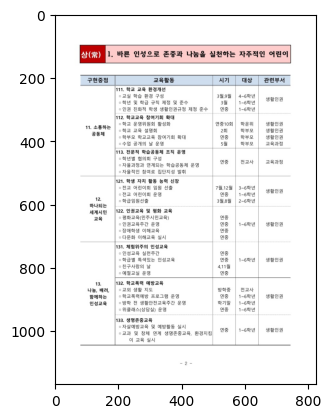

2
table: 구현중점 교육활동 시기 대상 관련부서 211. 문화예술교육의 강화 ◦아르떼 예술강사 무용 수업 ◦1인 1악기(칼림바) ◦문화예술교실(악기교실) ◦상록 문화예술의 날 연중 연중 연중 11월 1~4학년 1~6학년 1~6학년 1~6학년 교무기획 교무기획 교무기획 교무기획 21. 감성이 자라는 예술교육 212. 학교 스포츠클럽의 활성화 ◦반별 학교 스포츠 클럽 조직 및 운영 ◦스포츠클럽데이 운영 연중 11월 2~6학년 5학년부 213. 건강, 체력 증진 프로그램 운영 ◦줄넘기 급수제 실시 연중 1-6학년 ◦건강체력교실 운영 ◦건강365교실 연중 연중 1-6학년 5-6학년 5학년부 ◦학생 생존수영 교육 ◦해양 안전 체험 활동 5-6월 3월 3-4학년 6학년 214. 놀이와 쉽이 있는 교육과정 운영 22. ◦학년별 놀이교실 확보 놀이와 ◦매주 수요일 1,2교시 블록타임-놀이시간확보 연중 1-6학년 교육과정 쉼이 있는 교육 ◦학년별 놀이교실에 놀잇감 확보 ◦점심식사 후 자유놀이 시간 확보 231. 생태전환교육 ◦숲체험 교실 운영 ◦탄소중립 환경교육 실시 ◦교과 연계 환경교육 실시 ◦환경교육주간 운영 4월,10월 연중 연중 6월 1-4학년 1-6학년 1-6학년 1-6학년 교무기획 23. 체험중심의 생태환경교육 232. 학교 교재원 운영 ◦학교 교재원화 ◦재배원 관리 ◦수생식물원 관리 연중 전교생 교무기획
----------------------------
summary: 이 표는 초등학교의 문화예술, 체육, 환경 교육 관련 활동 계획을 연간 시기별로 정리한 것입니다. 주요 내용은 다음과 같습니다.

21. 감성이 자라는 예술교육 
- 문화예술교실(악기교실), 아르떼 예술강사 무용 수업, 1인 1악기(칼림바) 등 예술 교육 강화

22. 놀이와 쉼이 있는 교육
- 학년별 놀이교실 운영, 수요일 블록타임 놀이시간 확보 등 

23. 체험중심의 생태환경교육
- 숲체험교실, 탄소중립 환경교육, 환경교육주간 운영 등
- 학교 교재원 운영(화단, 재배원, 수생식물원 관

느 = 21. 이 자 라 성 + 성 근 o,ㅇ 1 인 1 악 기 ( 칼 림 바 ) ㅇ 아 르 떼 예,11 월,1~6 학 년,교 무 기 획
,"으 :영 츠 =] 조 직 란 브 너 별 학 교 스 포 츠 클 , 반 스 포 츠 클 럽 데 이 운 영 브 o o",11 월,,
,얘 녀 B0 가 베 Z0 끼 o 너 0 께 360 4 od o0 30 o,10 Bl Ko Bl 5-6 월,1-6 학 년 3-4 학 년,
22. 4 [ ㅁ,214. 놀 이 와 쉽 이 있 께 궤 녀 Hn B m 끼,,,
,,"4 월 ,10 월 10 Bl",녀 1-4 학 1-6 학 |,
,얘,Ko Bl,0 더 4,


----------------------------
image


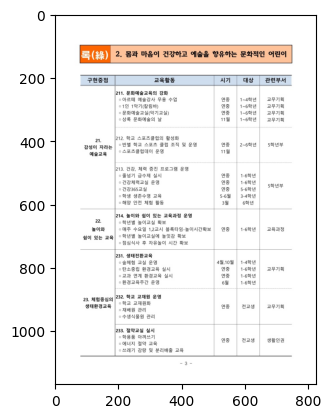

3
table: 구현중점 교육활동 시기 대상 관련부서 331. 교육정보화 지원확대 및 학습 준비 철저 ◦컴퓨터실 정비 및 각종 교육 S/W 구비 ◦방송실의 효율적 운영 ◦학습준비물의 효율적인 선정 및 구입 7, 2월 연중 연중 1~6학년 생활인권 31. 디지털 시민 역량 강화 332. 학교홈페이지 및 알리미 체제 운영 ◦학교홈페이지 구성 및 활성화 ◦하이클래스를 활용한 교육 주체 간 소통 연중 1~6학년 생활인권 교무기획 333. 에듀테크교육 및 정보통신 윤리교육의 강화 ◦에듀테크교육 환경 구축 ◦개인정보 보호 활성화 및 저작권 교육 강화 ◦SW 교육(미래체험) 프로그램 체험 기회확대 ◦디지털 시민교육(코딩교실 운영) 연중 연중 연중 2학기 1~6학년 1~6학년 1~6학년 1~4학년 생활인권 231. 독서교육의 활성화 ◦교육과정 재구성을 통한 온책읽기 연중 1~6학년 교육과정 ◦질문과 토론이 있는 독서토론교육 운영 연중 1~6학년 32. 232. 독서인문교육을 돕는 도서관 운영 독서인문교육 ◦도서관 운영 계획 수립 3월 1~6학년 ◦도서관 활용 수업 활성화 및 도서 확충 연중 1~6학년 ◦독서 교실 운영 방학중 1~6학년 교육과정 ◦학생 참여의 독서 행사 운영 연중 1~6학년 ◦독서인문교실-작가와의 만남 5-6학년 11월 ◦미디어리터러시 교육 1-6학년 1회 331. 꿈을 키우는 학생 맞춤형 진로교육 강화 ◦진로체험교실 운영 ◦교과 및 창의체험 활동을 통한 진로교육 운 영 연중 연중 1~6학년 1~6학년 생활인권 33. ◦학년 수준에 맞는 진로탐색 프로그램 운영 ◦사이버 진로교육 운영-커리어넷 2회 연중 1~6학년 4~6학년 다양한 진로 교육 실시 332. 진로연계교육 실시 ◦1-2학년은 성장이음과정 실시 ◦3학년은 교과목 설명 및 전담과목 및 안내 학년초 학년초 1-2학년 3학년 교육과정
----------------------------
summary: 이 표는 학교에서 실시하는 다양한 교육활동 계획을 나타냅니다. 교육정보화 지원, 디지털 시민 역량 강화,

2 6 <R 무 페교 뜨 곰 대역,51 ㅇ 30 o 2 매 | 운 00 ] 제 X | 므 2 | 띠 아아 | 핸 이핑 | IO 허끼 | 벼 T 역 에 | 울 | | [ 걱 | o @,0 0 81 84,,
,"쐐 쁘 인 < 얘 N 끼 며 s T 해 으 . 회 oo 개 훼 , 여 매 을 208 저 . 읍 다에 야 srRm 더 등기 MmET ) 헨 때 wHS 중 BB . 이 o o @",Ko 8l,m 학 %,넨 뻘 ol N 페 마 30 덕
,곱 좁 RO - 꺼 애 — N ㅋ . a® LE&| 똑 핵 애 으 Mo = 3 A U mrEHg | 드 아 은랑 | 80 어 인 만 A | 데 애 업 뜨 너 | HefE | 눔 따 퍼 애 스 | 누 노 0 더 떼 | 때 이 늘 6 | 중 논 이던 | o o o o,ㅡ Ko Ko Ko ™ = 81 84 84 펌,끼 ] 끼 끼 ] 9 학 학 학 s 『 개 PREY| 는 ㅎ - ㅠ,넨 리 페 20
얘 v o 때 ㅇ 35l X 네,0 께 80 oh X oo U 뚜 흐 09 . 매 0 = 이 o 5 > MBI 구이 . | ~ 삐 자 게 환 혀 액 | - = 에 헤 에 X2 애 논 가 80 버 픽 국 쥐 때 느 겐구 | 멜 pRelucp | @RI Lo . 욱 레 레 므 브 히 즌 | WITTTT (WU AW T | @ o o o o 0 o,m 끼 KO 0 곱 급 규 Ko 오 Ko 한 환 m Bl 낯 8l 우 우 꼬 ) =,MW T B B B | 322202 | 핀 히 임 애 꺼 BRREST| 는 ㅎ ㅠ ㅠ,0 디 얘 녀
o B m =,야 oo 090 0 얘 녀 얘 때 곱 ＊ AR 멈 힌 메포 | W 흐 0 킷 굽 에 10 i 띠 잘 해 밴 M 올 페 | 치이 T 히 [ w A M X 개 헤 흐 드며 안 겸 을 호먼 R ) 배 비 에 포 메 간 노 Y. 페스 R BT 삐 o 뺀 9 0,Ko Ko w7 00 81 8l 쁘 8l,"o 끼 4 o 끼 4 그 - 그 , 1끼 . 긴 핸 10 10 ol 30 OB %% - ㅠ — <t",| ol 페 20
- 8o 앰 Q03 *,족 = ol oK 니 조 꼬 궤 묶 띠 R0 타 매 | i 기 애 끄흔 70 | 앰 듀 페 | 문 힐 | 푸 앨 여 | oW | @AW | g 뾰。 우,범 번 떠」 떠」 10 300,m 34 끼 홈 개 ㅣ 고 R ㅡ,KO 디 앓 녀


----------------------------
image


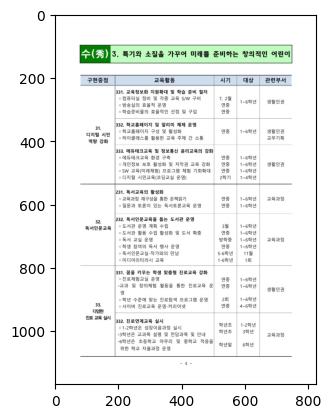

4
table: 월 주 기 간 요일별 날짜 일 월 화 수 목 금 토 휴 업 일 수 수업일수 교 학 과 교 운 행 영 사 계 월별 수업 일수 공 휴 일 및 학교 행 사 활 동 3 4 1 03.04∼03.08. 3 4 5 6 7 8 9 2 03.11.∼03.15. 10 11 12 13 14 15 16 3 03.18.∼03.22. 17 18 19 20 21 22 23 0 4 03.25.∼03.29 24 25 26 27 28 29 30 0 5 03.31.∼04.05. 31 1 2 3 4 5 6 6 04.08.∼04.12. 7 8 9 10 11 12 13 0 7 04.15.∼04.19. 14 15 16 17 18 19 20 0 8 04.22.∼04.26. 21 22 23 24 25 26 27 0 0 0 0 2 0 1 0 0 0 1 0 5 5 5 5 5 4 5 5 5 5 5 5 5 4 5 5 20 24 3.1.(금) 삼일절 3.4.(월) 시업식,입학식. (4교시) (1학년:급식 미실시,2~6학년:급식 실시) 3.11(월)~3.15(금) 진단활동주간(2∼6학년) 3.8.(금) 1학기 학급임원선거 안산화정영어마을체험학습(5학년) 3.15,18:5-1/3.19,20:5-2,3/3.21,22:5-4,5 3.20(수) 학부모총회, 교육과정설명회 3.18.(월)~3.22.(금) 생명존중교육주간 4.1.(월)∼4.5.(금) 건강평가주간 4.1.(월)∼4.5.(금) 학부모상담주간 4.10.(수) 20대 국회의원선거 4.15.(월)~4.19.(금)아동학대예방교육주간 4.18.(목) 장애이해교육 4.19.(금) 과학의 날 행사 4.22.(월)~29.(월) 학년별 체육대회 (22:1,23:2,24:3,25:4,26:5,29:6) 숲체험교실(1학기) 1학년:4.29-4.30 2학년:4.17-4.18 3학년:4.15-4.16 4학년:5.2-5.3 9 04.29.∼05.03. 28 29 30 1 2 3 4 0 0 5 5 5 10 05.07.∼05.10. 5 6 7 8 9 10 11 0 11 05

----------------------------
image


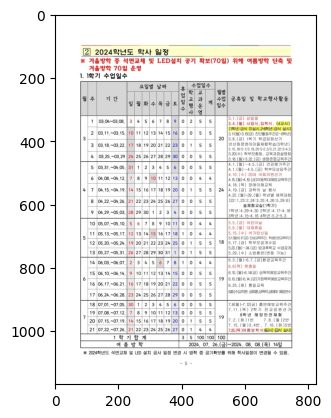

5
table: 
----------------------------
summary: 이 표는 2019년 5월부터 7월까지의 달력을 나타내고 있습니다. 각 주에 대해 날짜와 요일이 표시되어 있으며, 특별한 날짜나 행사에 대한 설명이 있습니다. 5월에는 환경교육주간, 6월에는 현충일, 성폭력예방교육주간, 가정폭력예방교육주간, 통일교육 등이 있었고, 7월에는 흡연예방교육주간, 2학기 전교임원선거, 해양안전체험, 여름방학 등의 일정이 있습니다.
----------------------------
html:


----------------------------
image


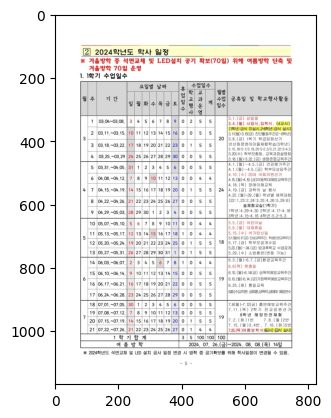

6
table: 요일별 날짜 월 주 기 간 일 월 화 수 목 금 토 8 1 9 10 0 5 2 08.12.∼08.16. 11 12 13 14 15 16 17 1 3 08.19.~08.23. 18 19 20 21 22 23 24 0 4 08.26.∼08.30. 25 26 27 28 29 30 31 0 08.05.~08.09. 4 6 7 8 휴 업 일 수 수업일수 교 과 운 영 1 5 0 5 학 교 행 사 0 1 0 0 계 1 4 5 5 월별 수업 일수 15 공휴일 및 학교행사활동 8..9.(금) 개학식(4교시)(급식실시) 8.16.(금) 2학기 학급임원선거 9 10 5 09.02.∼09.06. 1 2 3 4 5 6 7 6 09.09.∼09.13. 8 9 10 11 12 13 14 0 7 09.19.∼09.20. 15 16 17 18 19 20 21 3 8 09.23.∼09.27. 22 23 24 25 26 27 28 0 9 09.30.∼10.04. 29 30 1 2 3 4 5 10 10.07.∼10.11. 6 7 8 9 10 11 12 1 11 10.14.∼10.18. 13 14 15 16 17 18 19 0 12 10.21.∼10.25. 20 21 22 23 24 25 26 0 0 2 0 0 0 0 0 0 0 0 5 5 5 5 3 4 5 5 5 5 2 5 3 4 5 5 17 22 9.2.(월)~9.6.(금) 양성평등실천주간 9.9.(월)~9.13.(금) 생명존중교육주간 9.14.(토)~9.18.(수) 추석연휴 9.24.(화)1학년 1,2반 현장체험학습 9.26.(목)1학년 3,4반 현장체험학습 9.24.(화)4학년 1,2반 현장체험학습 9.26.(목)4학년 3,4반 현장체험학습 9.26.(목)6학년 1,2반 현장체험학습 9.27.(금)6학년 3,4,5반 현장체험학습 10.3(목) 개천절 10.4.(금) 학교장재량휴업일(1일) 10.9.(수) 한글날 10.8(화)5학년 1,2,3반 현장체험학습 10.10(목)5학년 4,5반 현장체험학습 10.14.(월)~10.1

----------------------------
image


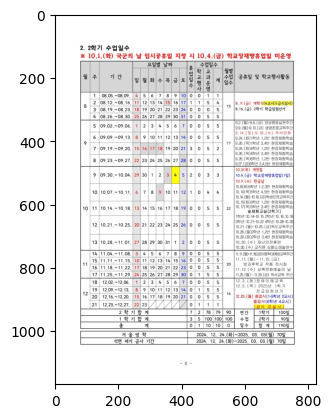

7
table: 
----------------------------
summary: 이 표는 11월부터 12월까지의 월간 일정을 보여주고 있습니다. 11월에는 아동학다예방교육주간, 방과후학교작품전시회, 상록문화예술의날, 독서교육주간 등의 행사가 있습니다. 12월에는 장애이해교육, 2025년 1학기 전교임원선거, 종업식 등이 예정되어 있습니다. 각 주별로 구체적인 날짜와 행사 내용이 제시되어 있습니다.
----------------------------
html:


----------------------------
image


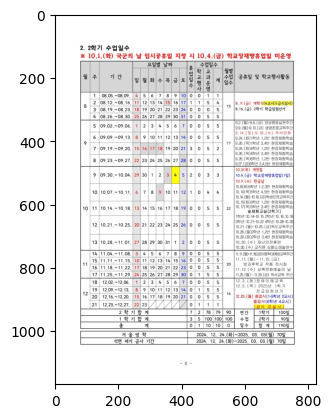

8
table: 구분 내용 ※ 결석한 날로부터 5일 이제 제출 ① 1일~2일 ② 3일 이 상 질병 결석 ③ 미세먼지 기저질환 질병결석 대상: 기저질환(천식, 알레르기, 아토피, 호흡기질환, 심혈관 질환 등)인 학생 결 기준: 에어코리아 앱(휴대폰) 당일 등교시간대 거주지 또는 학교 주변 실시간 미세먼지 농도 ‘나쁨’ 이상 인정 요건 담임교사에게 08:50까지 사전 연락(하이톡, 하이콜) 석 ▸부모·가족 봉양, 가사 조력, 간병 등에 해당하는 부득이한 기타 결석 사유임을 학교장이 미리 인정한 경우 해당 결석 ▸감염병 위기경보단계가 ‘심각, 경계’ 단계이며, 등교를 원하지 않는 경우 ▸그 외 합당하지 않은 사유나 고의(태만, 가출, 출석거부 등)로 결석한 경우 미인정 결석 ▸초․중등교육법시행령 제31조(학생징계 등)로 인한 가정학습 기간, 미인정유학, 어학연수 캠프, 출석인정 일수 초과한 교외체험학습, 사전 허가된 기간을 초과한 교환학습, 사전 미허가 가족여행 등 경조사 구 분 결 혼 입 양 대 상 형제, 자매 본인 부모 및 부모의 부모 부모의 조부모·외조부모 일 수 1 20 5 사망 형제·자매 및 그의 배우자 부모의 형제·자매 3 1 출 감염병 증상 ▸감염병 질환(학교보건법 제8조에 따른 등교중지): 수두, 수족구병, 결핵, 일본뇌염, 유행성이하선염, 유행성 결막염, 인플루엔자(독감:확진 검사 포함), A형 간염, 홍역 *비법정감염병:의료기관 ‘등교중지 필요하다’ 증빙서류 있을 시 ▸기저질환: 폐질환, 만성심혈관질환, 당뇨, 신장질환, 만성간 석 인 기저 질환 및 장애를 가진 질환, 악성종양, 면역저하자 등 ▸장애: 보건복지부 ‘장애복지카드’ 소지자(의사 진단서 하에 발급)에 한함 정 결 고위험군 학생 감염병위기단계 경계 심각 출결 사항 출석인정결석 인정 요건 학교장 사전 허가 석 제출자료 결석계와 담임교사확인서 결석계와 담임교사확인서+증빙서류 (의사 소견서, 진료 확인서, 입·퇴 원 확인서 등 병명, 진료 기간 등 이 기록된 증빙서류) 결석계와 담임교사확인서+

구 분,,내 용 ※ 결 석 한 날 로 부 터,5 일 이제 제 출,제 출 자 료
질 병 결석,@,1 일 ~2 일,,6656 와 담 임 교 사 확 인 서
,®,39 이상 으,(,"gt 담 임 교 사 확 인 서 +68 빼 터 의 사 소 견 서 , 진 료 확 인 서 , 입 . 퇴 원 확 인 서 등 병 명 , 진 료 기 간 등 이 기 록 된 증 빙 서 류 )"
,[ ㅣ 대,"미 세 먼 지 기 저 질 환 질 병 결석 상 : 기 저 질 환 ( 천 식, 알 레 르 기 , 아 토 피 , 질 환 등 )인 학 생","호 흡 기 질 환 , 심 혈 관 (",. . |66 톱 | 와 담 임 교 사 확 인 서 +=3 랩 톰 의 사 소 견 서 또 는 진 단 서 )
,,255992 기 준 : 에 어 코 리 아 W(EUE) 당 일 등 교 시 간 대 거 주 지 또 는 학 교 | 담 임 시 ， 주 변 실 시 간 미 세 먼 지 농 도 L' 이상 |,6 인 정 요 건 교 사 에 게 _08:50 까 지 _ _ ( 콜 ) ㅣ,"※ 학 기 초 관 련 증 빙 서 류 를 제 출 한 경 우 , 추 후 결 석 계 만 제 출 ( 증 빙 쳐빌。러체뺏호 e ㅇ = 。 """
기타,", ㅣ","AR 부 모 . 가 족 봉 양 . 가 사 조 력 , 간 병 등에 T "" = o o, 4=, “o o 결석 사 유 임 을 학 교 장 이 미 리 인 정 한","연 릭 하 이 톡 , 하 이 해 당 하 는 부 득 이 산 o 느 T 크 므 경 우 해 당",65 미 와 담 임 교 사 확 인 서 + 돕 22589 찌 또느 (이사 소겨서 또느 진 단 서 SRR 느 느
미 인 정 결석,"* |, ㅣ","LG9 위 기 경 보 단 계 가 심 각 , 경 계 원 하 지 않 는 경 우 그 외 합 당 하 지 않 은 사 유 나 고 의 ( = A SE 경 우 등 ) 로 결 석 한 경 우 ” . 초 . 중 등 교 육 법 시 행 령 제 31 조 ( 학 생 징 계 기 간 , 미 인 정 유 학 , 어 학 연 수 캠 프 , 출 . 66+7+02 교 외 체 험 학 습 , 사 허 가 기 간 조","' 단 계 이 며 , 등 교 를 | ( 태 만 , 가 출 , 출 석 거부 S Sz 인 한 가 정 학 습 | 석 인 정 일 수 초 과 한 | e 과 교 환 학 습 , 사 전",톤 56| 와 담 임 교 사 확 인 서 +68800 템 의 사 소 견 서 또 는 진 단 서 ) 1~2 일 : EEEeH 담 임 교 사 확 인 ㅅ 이 !- 퀼샤 펩캘효흘홉교느빌삐캘 9 ㅋ 르 STERLAEC L SE + 6
,,전 된 을 미 허 가 가 족 여 행 등,한,
경 조 사,,"구 분 대 _ 상 결 혼 형 제 , 자 매 아 향 바 스 느 므",일 수 1 20 ],담 임 교 사 확 인 서 + 톨 밀 랩 테 |FEEEISt im0 R 청천 만 시 고 사 신 고 서 (9
,ㆍ,부 모 및 부 모 의 부 모 사 망 부 모 의 조 부 모 . 외 조 부 모 형 제 자 매 및 그 의 배 부 모 의 형 제 - 자 매 감 염 병 질 환 ( 학 교 보 건 법 제 8 조 에 따 른,5 R 우 자 » 1 등 교 중 지 ):,"[ 청 청 장 , 부 고 장 , 망 일 이 상 ) 등 닥 익 하 이 콕 는 하 이토 락 담 임 교 사 에 하 이 콜 또 는 하 이 톡 연 락 밸 봄 [ 와 테"
각 역 병 oo o 증 상 기저 질 환 및 장 애 를 . 가 진 고 위 험 군 | 학 생,ㅣ * 비 *,"수 두 , 수 족 구 병 , 결 핵 , 일 본 뇌 염 , 유 행 TT, TARETS, 8%, 르 뜨 지 러 ㅠ 결 막 염 , 인 플 루 엔 자 ( 독 감 확 진 검 사 포 법 정 감 염 병 : 의 료 기 관 “ 등 교 중 지 필 요 하 기 저 질 환 : 폐 질 환 , 만 성 심 혈 관 질 환 , 당","성 이 하 선 염 , 유 행 성 ㅎ 민 러 , ㅠ 2 ㅇ ( 함 A 간 염 , 홍 역 | 다 ' 증 빙 서 류 있 을 시 뇨 , 신 장 질 환 , 만 성 간","론 교 사 확 인 서 +23800 oo = =ae=lalka 의 사 소 견 서 : 병 명 , 진 료 기 간 , 등교 가 승 읍 빈인라 토로 IS 흐 |10 여 우 S0 기 재 )"


----------------------------
image


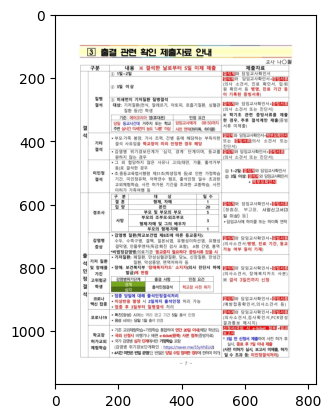

9
table: ( )학년 ( )반 ( )번 성명: 결석기간 202 년 월 일 ~ 202 년 월 일( )일간 결석사유 ※ 해당사항에 □V 표시하세요. 결석 증빙서류 □ 담임교사확인서 □ 진료확인서 □ 의사소견서(진단서) □ 입·퇴원 확인서 □ 학부모확인서 □ 기타 ※ 3일 이상 질병으로 인한 결석시에는 병명, 진료 기간 등이 기록된 증빙서류를 함께 첨부해서 제출 ★ 상세 사항: 뒷장 안내 참고 □ 청첩장 □ 부고장 □ 사망신고서 출석 인정 결석 경조사 ※ 1~2일: 청첩장, 부고장, 사망신고서 ※ 조문으로 인한 출석인정 결석 3일 이상: 사망신고서(사본 가능) 감염병 증상 □ 의사소견서(진단서) ※ 병명, 기간, 등교가능 여부 등 기재 기저 질환 및 장애 가진 고위험군 학생 □ 의사소견서(진단서) ※ 결석 3일전까지 신청 증빙 서류 코로나 백신 접종 코로나 생리통(여학생) 202 년 월 일 보호자: (인) 상록초등학교장 귀하 ★ 다음 경우 미인정 결석 처리함: 보호자 서명 없음, 증빙서류 미제출 ￭ 제출서류(붉은색: 학부모 준비 서류) 1. 질병결석인 경우 ① 1일~2일: 결석계와 담임교사확인서(담임교사 작성) ② 3일 이 상 : 결석계와 담임교사확인서 + 증빙서류(의사 소견서, 진료 확인서, 입·퇴원 확인서 등 병명, 진료 기간 등이 기록된 증빙서류)
----------------------------
summary: 이 표는 학생의 결석계를 작성하기 위한 양식입니다. 결석 기간과 사유를 기록하고, 증빙서류의 종류를 체크할 수 있습니다. 질병, 경조사, 감염병 증상, 기저질환 등 다양한 결석 사유에 따라 제출해야 하는 증빙서류가 상세히 안내되어 있습니다. 마지막으로 보호자 서명란이 있어 보호자의 확인을 받을 수 있습니다.
----------------------------
html:


----------------------------
image


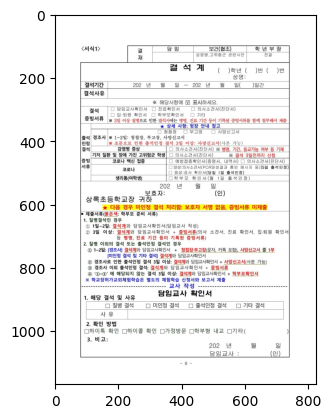

10
table: 
----------------------------
summary: 이 표는 학생의 결석 시 제출해야 하는 서류에 대해 설명하고 있습니다. 결석 기간과 사유에 따라 결석계, 담임교사 확인서, 병원 진단서, 학부모 확인서 등 다양한 증빙서류를 제출해야 합니다. 또한 교외체험학습의 경우 별도의 신청서와 동의서를 제출해야 합니다.
----------------------------
html:


2.,질 병 이,상 외 의,"등 병 명 , 진 료 결석 또 는 출 석",기 인 정,간 결,50| 기 석인,경,록 우,된,증,빙,서 류 ),,료,인,"서 , 서 , 원 서",
@,1~2,일 : [ 경 [ 미,조 사 ] 결 석 계 와 담 인 정 결석 및 기타,임 교 결,사 확 석 ] 결,인 서 석,＊,,청 담 임,첩 교,장 ' 부 사 확,고 장 ( 문 자 인 서,", 카",포 함,사 망,톡 신 고 서 중 1 부,
,조,로,,,,계 와,,,,와,,교,+,,고,,
,경,사,인 한 출 인,결석,3 일,이,결,석,계,,담 임,사 확 인,서,망 신,서 ( 사,사 본 가 능 ),
@ @ @,경 ‘@@,조 사 이 에,석 정 외 출 석 인 정 결 해 당 되 지 않 는,석 : 결 결석,석 계 3 일,상 : 와 담 이 상,:,임,교 석,사 결,확 인 계 와,서 + 담 임 교 사,증 빙 확 인,+ 학,부 모 확,서 류 서 인 서,
※,학 교,장 허 가,교 외 체 험 학 습 은,별,도 의,체 험 학,습,사,신,청,서 와 성,보 서,,,,고 제 출,


----------------------------
image


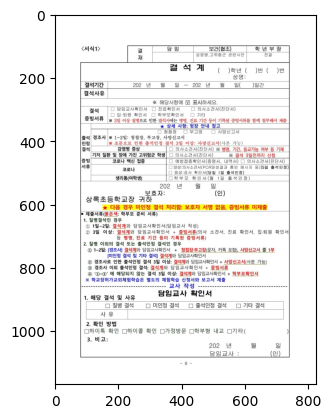

11
table: 구 분 내 용 및 방 법 시기: 개학 후 2주 동안 대상: 전교생, 교과 및 창체 학생의 발달 상황을 종합적으로 파악하기 위해 교육활동 속에서 통합적 진단 활동 주간 이고 지속적으로 관찰하여 기록하는 ‘진단활동’실시 초3 맞춤형 자율평가 실시-문해력, 수리력 2-6학년 진단평가 실시-국어, 수학 교과평가 ‧ 논술형 평가를 포함한 다양한 수행평가 방법으로 실시 ‧ 학생의 자아개념, 가치관, 태도, 흥미, 책임, 협력, 동기 등 정의적 능력 평가실시 ‧ 각 학급의 지도내용에 따른 교사별 문제출제 및 평가 ‧ 학습결손 요소 확인을 통한 처치, 학습활동 안내 ‧ 평가 후 feed-back 시스템을 통한 누적된 학습부진의 예방 ‧ 운영방법 : -교육과정과 연계한 평소 단위 수업시간 등을 활용한 평가 -평가 후 feed-back 시스템을 통한 누적된 학습부진의 예방 거로 학년별로 정함. 창의적 체험활동평가 ‧ 영역별 누가 기록은 공정성, 객관성, 투명성, 신뢰도, 타당도 등이 확 보되도록 학생의 구체적 활동 내용이 포함된 자료를 바탕으로 전산 입력 하여 관리함을 원칙으로 함. ‧ 평가 결과는 평소 활동 상황을 누가 기록한 자료를 토대로 학생의 활동 실적, 성장의 정도, 행동의 변화, 특기 사항 등을 담임 또는 담당 교사 가 수시로 기록. 행동특성 평가 ‧ 학년 발달 단계에 맞는 평가 영역과 덕목을 선정하고 평가 척도 기준을
----------------------------
summary: 이 표는 학기 초에 실시하는 진단활동, 교과평가, 창의적 체험활동평가, 행동특성평가 등의 학생평가 방법에 대해 설명하고 있습니다. 진단활동은 학생의 전반적인 발달 상황을 파악하기 위해 실시하며, 교과평가는 논술형 평가와 수행평가를 포함한 다양한 방식으로 이루어집니다. 창의적 체험활동평가는 영역별 활동 내용과 평가 기준을 학년별로 정하고, 행동특성평가는 학년 발달 단계에 맞는 평가 영역과 덕목을 선정하여 평가합니다. 평가 결과는 피드백을 통해 학습 부진을 예방하고 지속

,,교 과 평 가 ｜,", ㆍ 논 술 형 평 가 를 포 함 한 다 양 한 수 행 평 가 방 법 으 로 실 시 ㆍ 학 샘 의 자 아 개 념 , 가 치 관 , 태 도 , 흥 미 , 책 임 , 협 력 , 동 기 S 정 의 적 ㆍ 각 학 급 의 지 도 내 용 에 따 른 교 사 별 문 제 출 제 및 평 가 ㆍ 학 습 결 손 R4 확 인 을 통 한 처 치 , 학 습 활 동 안 내 ㆍ 평 가 후 feed-back 시 스 템 을 통 한 누 적 된 학 습 부 진 의 예 방 ㆍ 운 영 방 법 : - 교 육 과 정 과 연 계 한 평 소 단 위 수 업 시 간 등 을 - 평 가 후 1060-680( 시 스 템 을 S8 누 적 된 학 습"
를3,체,창 의 적 험 활 동 평 가 ㅣ,"ㆍ 창 의 적 체 험 활 동 의 영 역 별 활 동 내 용 , 평 가 방 법 및 기 준 은 거로 학 년 별 로 정 함 . ㆍ 영 역 별 누 가 기 록 은 공 정 성 , 객 관 성 , 투 명 성 , 신 뢰 도 , 보 되 도록 학 샘 의 구 체 적 활 동 내 용 이 포 함 된 자 료 를 바 탕 하 여 관 리 함 을 원 칙 으 로 함 . ㆍ 평 가 결 과는 평 소 활 동 상 황 을 누 가 기 록 한 자 료 를 토 대 실 적 , 성 장 의 정 도 , 행 동 의 변 화 , 특 기 사 항 등 을 담 임 가 수 시 로 기 록 ."
,S,,ㆍ 학 년 발달 단 계 에 맞 는 평 가 영 역과 덕 목 을 선 정 하 고 평 성 정 하 여 스 시 과창 기 록 하 흐 한 저이 핸 도 특 서 을 무


----------------------------
image


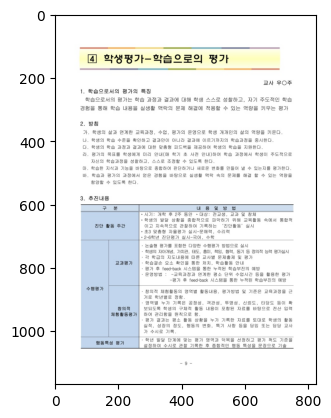

12
table: 순 대상 시기 형태 내용 1 교원 4월 연수 「공교육 정상화 촉진 및 선행교육 규제에 관한 특별법」연수 2 학부모 3월 교육 「공교육 정상화 촉진 및 선행교육 규제에 관한 특별법」연수
----------------------------
summary: 이 표는 교원과 학부모를 대상으로 하는 연수/교육 일정을 보여주고 있습니다. 교원은 4월에 '공교육 정상화 촉진 및 선행교육 규제에 관한 특별법' 연수를 받고, 학부모는 3월에 같은 내용의 교육을 받습니다. 하단의 표는 의미 있는 정보를 포함하지 않은 것으로 보입니다.
----------------------------
html:


ㅠ |,| of | 녀,| 헤 Y|,가 | 8 |,가 31 끄 핀 삐 3 | 흐 놈 ㄷ | 애 녁 ® | 매 이 세 언 <0 %0 애 념 MO 2 |
이,벨 | 공 or,| 헤 ㅇ,| 얘 녀,| 가 | 284 | 71 | 패 | 비 | 0 BB | 흐 | 6 E | 얘 ｜ 녀 | 0 | 2K | = | 베 | 언 <0 | 0 | 얘 | 녁 | MO ㅁ


----------------------------
image


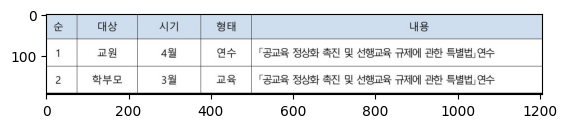

13
table: 구분 세부내용 생활안전 시설 안전, 실내활동, 실외활동, 신체활동, 여가 활동안전, 식생활 안전 교통안전 보행자, 자전거, 오토바이, 자동차, 대중교통(선박, 항공, 철도 등) 안전 폭력 및 신변안전 언어 및 신체폭력, 자살 및 집단 따돌림, 성폭력, 사이버 폭력, 유괴 및 미아사고 약물사이버 중독 흡연 및 음주, 의약품, 인터넷(게임 및 인터넷, 스마트폰) 중독, 정보 보호 등 재난안전 화재, 폭발, 붕괴, 화학적 오염, 자연재난(태풍, 홍수, 지진 등) 직업안전(초등제외) 실험 및 실습, 특성화고 취업준비 등 응급처치 기본 응급처치, 유형별 응급처치
----------------------------
summary: 이 표는 생활안전, 교통안전, 폭력 및 신변안전, 약물·사이버 중독, 재난안전, 직업안전(제외), 응급처치 등 여러 가지 안전 영역에 대한 세부 내용을 제시하고 있습니다. 각 영역별로 실내외 활동, 신체 활동, 여가 활동, 보행자와 차량 운전, 언어폭력과 성폭력, 흡연/음주/인터넷 중독, 화재/자연재해, 실험실습 안전, 응급처치 방법 등 다양한 하위 범주를 포함하고 있습니다.
----------------------------
html:


"' | || w,a G |",디 2 @ =0 흐 < 구1 Sl o i x|z 1% O | 0 니 눈 구 랄 벽 wo 니 절 = 귀 샌 넨곤 께 <
2 해 ] ㅋ,= 전 | 어 | 0 | 너 | HE | | ®° 라 % | 5 No | 유 | 누 9616 ㅠ — | D2 힐 | 어 R 는 빠 | | o
= | E| | 께 ] 베,미 아 사 고 | = | 패 e 리 | °F : \ 이 E 2 D ¥ 네 199 - | 02 | 페 | 1 | B |y 조] WX ~ L | 2 라 T | 3|
| W 9 = ZIEID| | 때 | 소 히,비 )이 퍼 | 네 | 바 10 PN 또 4 쌕 ， | X 엔 | 22 | | 지 혼 몰흠 떠 | 어 써 | 이 이 ] | | 했 | 8
T : | e T,"니 0 본 데 "" A 、 | e | 픈 | 소죄 ] 조 | 주 | 올 TR 어 ] 제 10 | | 1 | | 습 M | 페 조 = | | 1"
스 은 Jo ¥ M = 5 오이 ㅠ N,| 입 | 그 줄 륜 밖 걸 B 고 %o | 기 게 ] | 화 | ® | =


----------------------------
image


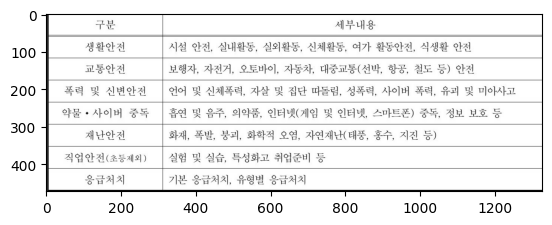

14
table: 학생 생활에 관한사항 검사, 휴대전화 등 전자기기의 사용, 학교 내 교육 연구 활동 보호와 질서 유지에 관한 사항 학생자치활동의 조직 및 운영 학칙의 개정 절차 등
----------------------------
summary: 이 표는 학생 생활 관련 규정들을 나열하고 있습니다. 주요 내용으로는 전자기기 사용, 교육 연구 활동 보호와 질서 유지, 학생 자치활동 조직 및 운영, 학칙 개정 절차 등이 포함되어 있습니다. 표의 형식은 다소 복잡하지만, 학교 생활에 필요한 주요 규정들을 정리하고 있는 것으로 보입니다.
----------------------------
html:


,50 힘 10,"함 으 교 육 목 적 상 필 요 한 소 지 보 호 와 질 서 유 지 에 et 새 ” 모 도 으 전 자 기 기 의 사 용 , 학 교 내 교 육 연 구 활 : TS © O 드 박 보 자 드 2 =, 1 70 버 K ~ 이인 어 뜨 누 KO | g SRR 0T 야 버 *| 50 < 1 RO @"
ㄷ래,— 오 애 =0 0. <,| 80 애 oK | gr| K| | i | B 뚜 | 3이 | Jor| |e
,60 > 허 관,99 = X 302 — > 핏 10 e


----------------------------
image


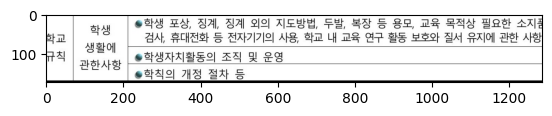

15
table: 교사의 인격권 침해하는 경우 교사의 업무를 방해하는 행위 ☞ 학부모가 교사에게 폭언하거나 폭행하는 경우 ☞ 사이버상에 교사를 비방하는 행위(카톡, 밴드) ☞ 사생활(이혼, 이성문제 등)을 다른 학부모에게 ☞ 교무실, 교실에서 폭력, 재물을 파손하는 경우 ☞ 시험 출제 경향을 요구, 수행평가 점수를 올려 달라는 행위 ☞ 생활기록부의 부당한 정정, 기록을 요구하는 유포하는 행위 ☞ 수업형태, 생활지도를 비하하는 내용을 유포 ☞ 전화, 이메일, SNS 등을 통한 폭언, 협박 등 경우 ☞ 안전사고 피해시 학부모의 부당한 협박이나 민원 제기 ☞ 학교폭력 처리과정에서 교사에 대한 부당한 협박, 욕설
----------------------------
summary: 이 표는 학부모가 교사의 인격권을 침해하거나 교사의 업무를 방해하는 다양한 행위들을 나열하고 있습니다. 폭언, 폭행, 사이버 상의 비방, 사생활 유포, 폭력 및 기물 파손, 부당한 요구, 생활지도 비하, 협박 등의 행위가 포함됩니다. 또한 안전사고 피해 시 부당한 협박이나 민원 제기, 학교폭력 처리 과정에서의 부당한 대우 등도 언급되어 있습니다.
----------------------------
html:


>,"유 포 하 행 위 _ on 수 업 형 태 , 생 활 지 도 를 비 하 하 는 내 용 을 유 포",|- 안 전 사 고 피 해 시,학 부 모 의 부 당 한 협 박 이 나
=,"I 의 co 토 하 포 혁 바 드 전 화 , 이 메 일 , 545 등 을 통 한 폭 언 , 협 박",민 원 제기 o= | 뉴 으 폭 력 처 리 과,정 에 서 교 사 에 대 한 부 당 한


----------------------------
image


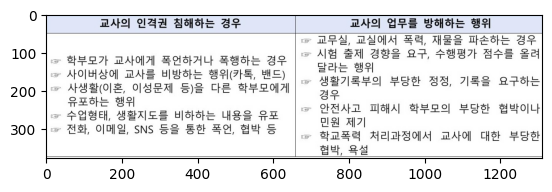

16
table: 학생 학생 외 침해자 ① 학교에서의 봉사 ② 사회봉사 ③ 학내외 전문가에 의한 특별교육 이수 또는 심리치료 ④ 출석정지 ⑤ 학급교체 ⑥ 전학 ⑦ 퇴학처분(퇴학 처분은 의무교육 대상자에게 는 적용 안 됨) ▩ 형사 고소·고발 - 학부모를 비롯한 학생 외 침해자에 대하여는 학교의 장에게 징계권한이 없으므로 형사처벌 법규에 위반하는 심각한 침해행위에 대하여 형사고소· 고발로서 대응합니다. 이때, 피해교사가 원하면 교육청 차원에서 형사고 발이 이뤄지게 됩니다. ▩ 학교교권보호위원회 분쟁 조정, 심의·통지 - 학교교권보호위원회는 피해교원과 침해행위자 모두 희망할 경우 분쟁 조정 절차를 담당하기도 합니다. 학교교권보호위원회는 학생 외 침해자의 행위를 심의하여 교육활동 침해행위 여부를 밝히고, 그 결과를 각 당사자 에게 통지합니다.
----------------------------
summary: 이 표는 교사에 대한 학생 및 학생 외 침해자의 행위에 대한 조치 사항을 제시하고 있습니다. 학생 침해자의 경우 ① 학교 내 봉사부터 ⑦ 퇴학처분까지의 징계 조치가 있습니다. 학생 외 침해자의 경우에는 형사고소·고발이 가능합니다. 또한 학교교권보호위원회를 통해 분쟁 조정 및 침해행위 여부 심의, 통지 절차가 있습니다.
----------------------------
html:


@,학 교 에 서 의 봉 사,생 형 사 고 소 고 발,


----------------------------
image


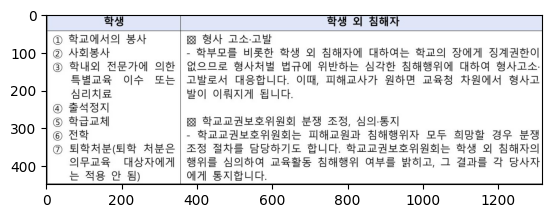

17
table: < 자녀 > < 학부모 > < 교사 > 1) 학습권 침해로 정상적 교육 활동에 저해 2) 학교 문화 붕괴로 행복한 학 교 생활 저해 3) 담임 교체 등 2차 피해 발생 1) 정신적 스트레스와 정서 불안 2) 학생에 대한 PTSD 증후군 발생 3) 정상적 교육활동 지속 불가 1) 학부모의 불법 행위로 인한 민․형사 소송처리로 심각한 수업권 침해 2) 소문 등으로 인한 정신적 스트 레스로 정상적 교육활동 어려움
----------------------------
summary: 이 표는 학생, 학부모, 교사가 각각 겪게 되는 폭력 사건으로 인한 피해 상황을 요약하고 있습니다. 

학생들은 학습권 침해, 행복한 학교생활 저해, 2차 피해 발생 등의 어려움을 겪게 됩니다. 

학부모는 정신적 스트레스, 정서 불안, 자녀의 PTSD 증상 등을 겪게 되고,

교사는 학부모의 불법 행위로 인한 민형사 소송, 정신적 스트레스, 수업권 침해 등의 피해를 입게 됩니다.
----------------------------
html:


침 정 상 적 으 교 육 해 로 2,,아 핵 으 의 불 법
,스 트 레 스 와 정 ——=,때 소 송 처 리
,대 한 050,
,교 육,


----------------------------
image


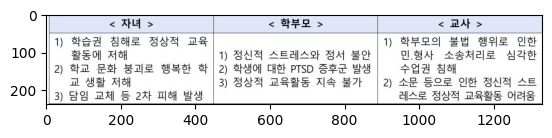

18
table: 프로그램명 수업 일시 학년 정원 수업횟수 분기별(3개월) 수강료 가야금 수 1:00~2:10 2:10~3:20 1학년 2~6학년 10명 10명 10회 73,500원 (가야금은 학교에 비치) 노래보컬 금 1:50~3:00 3:10~4:20 1~2학년 3~6학년 20명 20명 12회 81,840원 독서토론 논술 목 1:50~3:00 3:10~4:20 1~2학년 3~6학년 25명 25명 12회 91,320원 (자체제작 교재포함) 뜨개질 & 바느질 금 1:50~3:00 3:10~4:20 1~3학년 4~6학년 25명 25명 12회 78,720원 재료비: 39,000원 로봇과학 수 1:00~2:10 2:40~3:50 1~2학년 3~6학년 25명 25명 10회 68,200원 재료비: 85,000원 미술 목 1:50~3:00 3:10~4:20 1~2학년 3~6학년 25명 25명 12회 78,720원 재료비: 21,000원 방송댄스 월 1:00~2:10 2:40~3:50 1~2학년 3~6학년 25명 25명 11회 75,020원 영어(기초) 영어(초급) 영어(중급) 영어(고급) 화,목,금 화,목,금 화,목,금 화,목,금 1:50~2:30 2:30~3:10 3:10~3:50 3:50~4:30 1~2학년 1~6학년 (레벨 테스트 후 결정) 25명 25명 25명 25명 36회 36회 36회 36회 132,120원 교재비: 15,000~19,440원 예쁜글씨 캘리 수 1:00~2:10 2:20~3:30 1~2학년 3~6학년 25명 25명 10회 65,600원 재료비: 21,000원 창의과학 목 1:50~3:00 3:10~4:20 1~2학년 3~6학년 25명 25명 12회 78,720원 재료비: 56,000원 축구 수 1:00~2:10 2:20~3:30 1~2학년 3~6학년 25명 25명 10회 68,200원 컴 퓨 터 A 컴 퓨 터 B 컴퓨터 기초 OA 마스터 스팩 자격증 코딩 (기초) 코딩 (게임) 월,수 월,수 월,수 금 금 12:50~1:40 1:50~2:40 

----------------------------
image


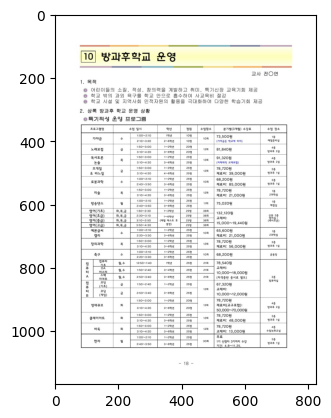

19
table: 
----------------------------
summary: 이 표는 초등학생을 대상으로 한 방과후학교 프로그램을 소개하고 있습니다. 프로그램에는 컴퓨터, 코딩, 영재교육, 클레이아트, 바둑, 한자 등 다양한 과목이 있으며, 학년별로 시간과 수강인원, 수강료 등의 정보를 제공하고 있습니다.
----------------------------
html:


----------------------------
image


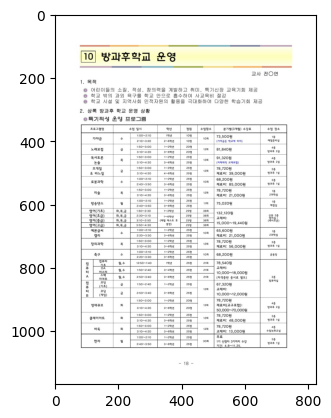

20
table: 구 분 운 영 기 간 비 고 1기 2024년 3월 11일 ~ 5월 31일 2기 2024년 6월 1일 ~ 8월 31일 여름방학 2주, 방과후 방학 포함 3기 2024년 9월 1일 ~12 월 23일
----------------------------
summary: 이 표는 2024년 초등돌봄교실의 운영기간을 3개 기수로 나누어 보여주고 있습니다. 1기는 3월 11일부터 5월 31일까지, 2기는 6월 1일부터 8월 31일까지로 여름방학 2주와 방과후 방학이 포함되어 있으며, 3기는 9월 1일부터 12월 23일까지입니다.
----------------------------
html:


----------------------------
image


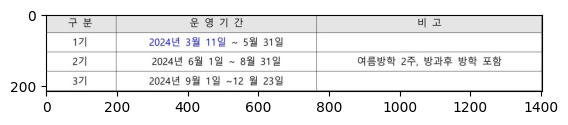

21
table: 운영기간 1기 3월 11일 ~ 5월 31일 2기 6월 1일 ~ 8월 31일 3기 9월 1일 ~ 12월 23일 4기 방과후학교 운영계획 운영시간 주중 월, 수 13:00~16:30 화, 목, 금 13:50~16:30 방학중 9:30~12:30 수요조사 실시 계획 10월 21일~ 10월 25일 만족도조사 실시 계획 1학기 5월 20일 ~ 5월 24일 2학기 11월 18일 ~ 11월 22일
----------------------------
summary: 이 표는 방과후학교 운영일정에 대한 정보를 제공합니다. 운영기간은 4기로 나누어져 있고, 각 기간별 날짜가 명시되어 있습니다. 또한 운영시간도 주중과 방학 중으로 구분되어 있습니다. 수요조사와 만족도조사 실시 계획일정도 안내하고 있습니다.
----------------------------
html:


,,노추 S 테,,"월 , 수 노 화 , 목",", 금",1300~1630 13:50~16:30,. 악 으 기 으,,,030-12:30 DU~ 12:
요 조 사,실 시 계 획,,,,,10 월 21 일 ~,10 월 25,일,,
도 조 사,실 시 계 획 |,1 학 기,,5 월,20 일 ~,5 월 24 일,2 학 기,,11 월,18 일 ~ 11 월 22 일


----------------------------
image


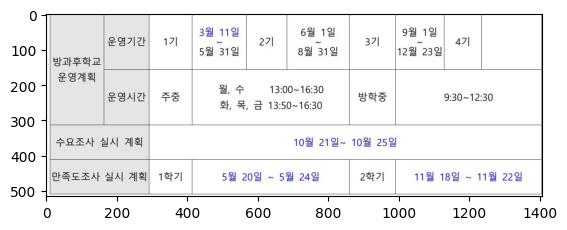

22
table: 구분 오후돌봄 대상 1~2학년 중 맞벌이 및 저소득 가정의 학생으로 추가 돌봄이 필요한 경우 2024.03.05. ~ 2024.12.23.(방학 중 석면제거 공사 예정) 운영기간 (학교, 지역 실정에 맞게 연중(재량휴업일, 돌봄방학 5일 외 방학기간 포함) 개설·운영) 운영시간 방과후 ~ 17:00 내외/1개반 19시 내외 연장운영 (방학중 09 ~ 14:40 운영) 학급편성 3개 학급 (돌봄1반, 돌봄2반, 돌봄3반) 전용교실 돌봄1반(본관 3층), 돌봄2반,3반(본관 2층) 프로그램 프로그램 (보드게임. 창의놀이, 음악줄넘기, 독서논술, 체육) 개인 활동 (과제 수행, 글쓰기, 독서 활동, EBS시청, 블록게임 등) 특별프로그램 보드게임, 창의놀이, 음악줄넘기, 독서논술, 체육 급 ․ 간식 학부모 수요조사 결과 미실시(방학 및 재량휴업일 운영시 개인도시락 지참) 돌봄 담당 김O영
----------------------------
summary: 이 표는 오후돌봄에 대한 정보를 제공하고 있습니다. 대상은 1~2학년 중 맞벌이 및 저소득 가정 학생이며, 2024년 3월부터 12월까지 운영됩니다. 방과후부터 오후 5시 내외까지 운영되며, 방학 중에는 오전 9시부터 오후 2시 40분까지 운영됩니다. 3개 학급으로 편성되어 있고, 보드게임, 창의놀이, 음악줄넘기, 독서논술, 체육 등의 프로그램이 제공됩니다. 방학 및 재량휴업일에는 개인 도시락을 지참해야 합니다. 돌봄 담당자는 김영0 선생님입니다.
----------------------------
html:


상 대 차,,1~2,학 년 중 맞 벌 이 추 가 돌 봄,및 저 이 필,소 득 가 정 의 요 한 경 우,학 생 으 로,,
운 영 기 간 _ |,"( 학 교 ,",2024.03.05. 지 역 실 정 에,~ 2024.12.23.( 맞 게 연 중 ( 재 량 개,방 휴 업 설 ㆍ,"학 중 석 면 일 , 돌 봄 방 운 영 )",제거 공 사 학 5 일 외,예 정 ) 방 학 기 간,포 함 )
운 영 시 간,방 과,후 ~ 17:00 내,외 /1 개 반 19 시,내 외,연 장 운 영 (,방 학 중 09,14:40,운 영 )
학 급 편 생 리 =<,,,"3 ( 1 반 ,",개,"학 급 2반 , 3tl¥)",,,
전 용 교 실,,,1 반 ( 본 관 3 층,"),","2 반 ,3 반 (",본 관 2 층 ),,
프 로 그 램,개,프 로 그 램 ( 인 활 동 ( 과,"드 게 임 . 창 의 놀 제 수 행 , 글 쓰 기","이 , ,","음 악 줄 넘 기 독 서 &S,",", 독 서 논 술 685 시 청 , 블",HS) 록 게 임,등 )
,,보 드,"임 , 창 의 놀 이 ,",음 악,"줄 넘 기 , 독","서 논 술 , 체",육,
,학 부 모,수 요 조 사,결 과 미 실 시 ( 방 학,및,재 량 휴 업 일,운 영 시 개,인 도 시 락,지 참 )
,,,,김 0,영,,,


----------------------------
image


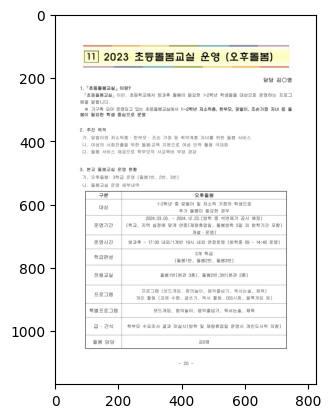

23
table: 구 분 서비스 내역 학교정보 학교정보, 식단정보, 과목 및 담당교사, 학교의 교과용도서 조회, 교육비 납입현황 등 학교생활 학교생활기록 조회, 시간표 조회, 출결정보 조회, 봉사활동내역 조회, 학교스포츠클럽 조회, (고등학교) 대입전형자료 조회 등 평가정보 (초등학교)교과평가 및 성적 조회 (중학교) 학교생활통지표 조회 (중.고등학교) 성적표 조회, 고사별 정오답표 조회, 성적향상도 조회, 학습진단 분석, (고등학교) 표준점수분석표 조회, 성적변화표 분석 등 건강정보 건강기록 조회, PAPS 활동 처방 및 조회, PAPS 평가결과 조회, PAPS 평가결과 이력 조회, PAPS 통계분석 조회, PAPS 지수 조회 등
----------------------------
summary: 주어진 표는 학생들이 학교생활을 하면서 확인할 수 있는 다양한 서비스 내역을 나열하고 있습니다. 크게 학교정보, 학교생활, 평가정보, 건강정보 등의 범주로 나누어져 있으며, 각 범주 안에서는 학교정보 조회, 시간표/출결/봉사활동 조회, 성적 및 학습진단 조회, 건강기록 및 PAPS 활동 조회 등의 세부 서비스를 제공하고 있습니다.
----------------------------
html:


----------------------------
image


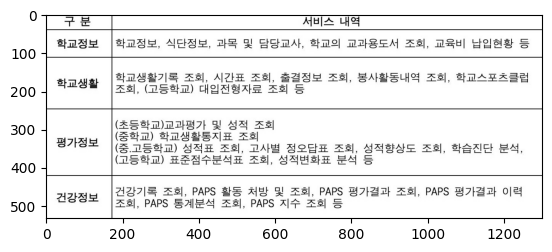

24
table: 세부사항 대상 정보통신 윤리교육 방송시청 및 학습지 활동 ․ 방송 내용 -스마트폰 중독의 사례 -스마트폰 중독의 유형 및 문제점 -스마트폰 사용의 올바른 방법 ․ 영상 시청 후 학습지 완성하기 1-6학년 (영상 시청) 3-6학년 (학습지 활동) 교실에 스마트폰 사용 습관 진단 자료 게시 ․ 스마트폰 중독 증상, 중독 유형, 중독 현황 및 실태 ․ 스스로 자신의 스마트폰 사용 습관을 진단해보고 바른 사용을 위한 방법 이야기 나누기 1-6학년 가정통신문 발송 ․ 사이버 폭력 예방 및 올바른 인터넷, 스마트폰 사용을 지도하기 위한 방법 안내 학부모 및 전교생
----------------------------
summary: 이 표는 학생들을 대상으로 한 정보통신 윤리교육의 세부사항을 보여주고 있습니다. 방송 시청 및 학습지 활동을 통해 스마트폰 중독의 문제점과 바른 사용법을 교육하고, 교실에 스마트폰 사용 습관 진단 자료를 게시하여 학생 스스로 자신의 습관을 점검할 수 있도록 합니다. 또한 가정통신문을 통해 사이버 폭력 예방과 올바른 인터넷, 스마트폰 사용 방법을 학부모와 공유하고 있습니다.
----------------------------
html:


uluj i < 4o T T <0 30 <1 <I<I 80


----------------------------
image


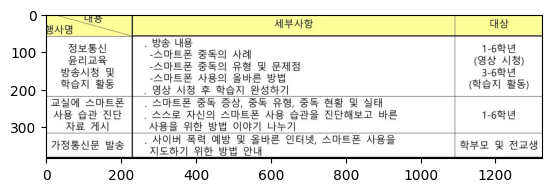

25
table: 500만원 미만 500만원 이상 ～ 1,000만원 미만 1,000만원 이상 ～ 3,000만원 미만 3,000만원 이상 ～ 5,000만원 미만 5,000만원 이상 ～ 1억원 미만 1억원 이상 모금 모금 강요 직접개입 간접개입 경고 경고 경고-견책 견책-정직 정직 정직-해임 해임-파면 경고-견책 견책-감봉 감봉-정직 정직-해임 ․ 조성 절차 미이행 부당목적 정당목적 주의 주의-경고 주의-경고 경고-견책 경고 견책 견책-감봉 감봉-강등 경고-견책 견책-감봉 감봉-정직 그 외의 경우 사안의 경중에 따라 처분양정 결정 모금강요 직접개입 경고 견책 견책-감봉 감봉-정직 정직-해임 해임-파면 부당한 목적 집행 모금강요 간접개입 모금을 인지하지 못한 경우(조성절차 미이행 등) 경고 경고-견책 경고-견책 견책 견책 견책-감봉 감봉-정직 정직-해임 견책-감봉 감봉 감봉-강등 모금강요 직접개입 경고 경고-견책 견책-감봉 감봉-정직 정직-강등 정직-해임 집행 정당한 목적 집행 모금강요 간접개입 모금을 인지하지 못한 경우(조성절차 미이행 등) 경고 경고 경고-견책 경고-견책 견책 견책-감봉 감봉-정직 정직-강등 견책 견책-감봉 감봉-정직 교직원 개인적 금품.향응수수 「경기도교육청 공무원 행동강령」 [별표4] 금품등 수수금지 위반 징계양정기준 적용 그 외의 경우 사안의 경중에 따라 처분양정 결정 불법찬조금 홍보 미실시 경고
----------------------------
summary: 이 표는 공무원 행동강령 위반 시 적용되는 징계양정기준을 보여주고 있습니다. 금품수수, 모금강요, 직접개입, 간접개입 등의 위반행위에 대해 위반금액과 목적, 인지여부에 따라 경고에서 파면까지 징계수위를 규정하고 있습니다. 또한 불법찬조금 홍보 미실시에 대한 처분기준도 제시되어 있습니다.
----------------------------
html:


----------------------------
image


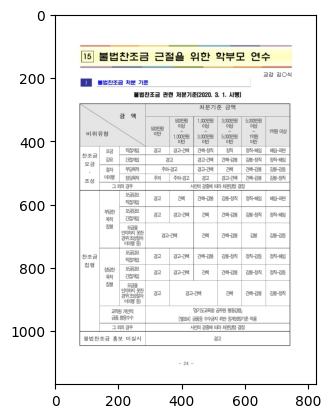

26
table: 신체학대 정서학대 성학대 성인이 아동에게 신체적 손상을 입히거나 이를 허용하는 모든 행위 (도구를 사용하거나 신체에 유해한 물질로 신체를 가해하는 행위, 완력을 사용 하여 신체를 위협하는 행위) 성인이 아동에게 하는 언어적·정서적 위협, 감금·억제·기타 가학적인 행위 (언어적 폭력, 정서적 위협, 아동에 대한 비현실적인 기대 또는 강요, 보호자의 종교 행위를 강요, 형제나 친구 등과 비교·차별·편애·왕따 시키는 행위) 성인의 성적 만족을 위해 아동의 신체에 접촉하는 행위나 아동과의 부적절한 성 적 행동 (아동을 관찰하거나 아동에게 성적 노출을 하는 행위, 성적으로 추행하는 행위, 유사성행위를 하는 행위 등) 방임·유기 아동의 양육과 보호를 소홀히 하여 정상적인 발달을 저해하는 모든 행위 (물리적 방임, 교육적 방임, 의료적 방임, 유기<아동을 버리는 것>)
----------------------------
summary: 이 표는 아동학대의 유형을 신체학대, 정서학대, 성학대, 방임·유기로 나누어 각각의 정의와 구체적인 예시를 제시하고 있습니다. 아동학대는 아동의 건강한 성장과 발달을 저해하는 모든 행위를 포함하며, 신체적 가해뿐만 아니라 언어적·정서적 위협, 부적절한 성행위, 기본적인 양육과 보호를 소홀히 하는 행위 등이 해당됩니다.
----------------------------
html:


정 서 학 대,"성 인이 아 동 에 게 ( 언 어 적 폭 력 , 정 종 교 행 위 를 강 요","하 는 언 어 적 ㆍ 정 서 적 위 협 , 감 금 ㆍ 억 제 ㆍ 기타 가 학 적 인 행 위 서 적 위 협 , 아 동 에 대 한 비 현 실 적 인 기 대 또 는 강 요 , 보 호 자 의 , 형 제 나 친 구 등과 비 교 ㆍ 차 별 ㆍ 편 애 ㆍ 왕 따 시 키 는 행 위 )"
성 학 대,성 인 의 성 적 만 족 정 핸 동 적 행 동 ( 아 동 을 관 찰 하 거 유 사 성 행 위 를,"을 위해 아 동 의 신 체 에 접 촉 하 는 행 위 나 아 동 과 의 부 적 절 한 성 나 아 동 에 게 성 적 노 출 을 하 는 행 위 , 성 적 으 로 추 행 하 는 행 위 , 하 는 행 위 등 )"
방임 ㆍ 유 기,아 동 의 양 육 과 보 ( 물 리 적 방 교,"호 를 소 홀 히 하 여 정 상 적 인 발 달 을 저 해 하 는 모 든 행 위 육 적 방 의 료 적 ¢y, 유 기 < 아 동 을 버 리 는 것 >)"
,"임 ,","임 ,"
,,


----------------------------
image


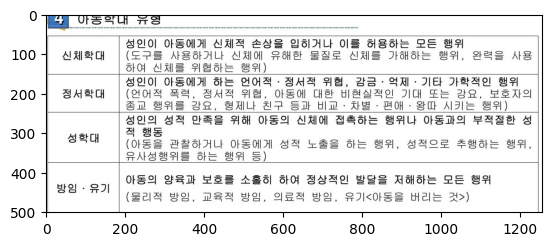

27
table: 성인이 아동에게 신체적 손상을 입히거나 이를 허용하는 행위 신체적 징후 행동적 징후 • 설명하기 어려운 신체적 상흔 • 발생 및 회복에 시간차가 있는 상처, 골절 등 • 사용된 도구의 모양이 그대로 나타나는 상처 • 담배 불 자국, 뜨거운 물에 잠겨 생긴 화상 자국 • 겨드랑이, 팔뚝, 허벅지 안쪽 등 다치기 어려운 부위의 상처 • 어른과의 접촉 회피 • 다른 아동이 올 때 공포를 보임 • 공격 또는 위축된 극단적 행동 • 부모 귀가에 대한 두려움 성인이 아동에게 하는 언어적·정서적 위협 감금·억제·기타 가학적인 행위 신체적 징후 행동적 징후 • 성장장애 • 신체발달 저하 • 언어장애 • 원형탈모 등 • 특정 물건을 계속 빨고 있거나 물어뜯음 • 반사회적, 파괴적 행동장애 • 히스테리, 강박, 공포 등 정신신경성 반응 • 극단 행동, 과잉행동, 발달 지연, 자살 시도 성인의 성적인 만족을 위해 아동의 신체에 접촉하는 행위나 아동과의 부적절한 성적 행동 신체적 징후 행동적 징후 • 걷거나 앉는데 어려움 • 회음부의 통증과 가려움 • 찢기거나 손실된 처녀막 • 아동의 질에 있는 정액 • 질에 생긴 상처나 긁힌 자국 또는 홍진 • 항문 주변의 멍이나 찰과상 • 입천장의 손상, 성병감염 및 임신, 인두염질 • 나이에 맞지 않는 성적행동, 해박하고 조숙한 성 지식 • 타인, 동물, 장난감을 대상으로 하는 성적인 상호관계 • 수면장애(유뇨증, 유분증) 섭식장애(폭식증, 거식증) • 위축, 환상, 퇴행행동, 혼자 남아 있기를 거부 • 특정 유형의 사람들 또는 성에 대한 두려움 • 방화/동물에게 잔혹함, 비행, 가출, 자기 파괴적 행동 아동의 양육과 보호를 소홀히 하여 정상적인 발달을 저해하는 모든 행위 신체적 징후 행동적 징후 • 성장 지연, 발달지체 • 기아, 영양실조, 적절하지 못한 영양섭취 • 냄새나는 의복, 청결하지 못한 외모 • 지속적인 피로, 나른함, 조는 행위 • 음식을 구걸 • 비행 또는 도둑질 • 학교에 일찍 등교하고 집에 늦게 귀가
--

----------------------------
image


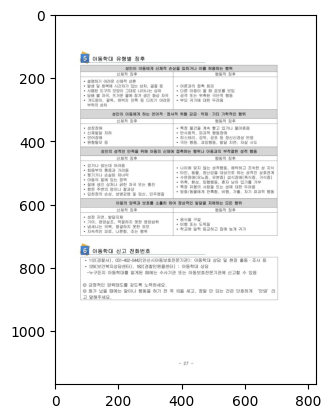

28
table: 사전예방 갈등조정·관계회복 사후지도 ∙갈등조정·관계회복(학교, 교육지원청) -피해·가해학생 및 보호자 간 대화를 통한 문제해결 프로그램 -이해와 공감, 반성과 용서를 통한 실질적 치유와 회복 도모 -관련학생 및 보호자 간 합의문 작성과 이행 요청 -피해학생 보호와 가해학생 선도를 위한 공동의 노력 진행 ※ 피해·가해관련 학생 및 보호자 동의 필수 ∙피해학생 보호 및 적응 지원 -피해학생 보호조치(상담, 치료지원기관 연계) ∙가해학생 선도 -심의위원회 선도조치의 이행 -가해학생 및 보호자 특별교육 ∙관계회복 프로그램 운영(필요 시)
----------------------------
summary: 이 표는 학교폭력 사안 발생 시 사전예방, 갈등조정 및 관계회복, 사후지도 과정에 대해 설명하고 있습니다. 

갈등조정 및 관계회복 단계에서는 피해·가해 학생 및 보호자 간 대화를 통한 문제해결 프로그램을 운영하고, 상호 이해와 반성, 용서를 통해 실질적 치유와 회복을 도모합니다. 또한 관련 당사자 간 합의문을 작성하고 이행을 요청합니다. 

사후지도 단계에서는 피해학생 보호조치와 상담, 치료지원을 하고, 가해학생에 대해서는 심의위원회 선도조치를 이행하며 특별교육을 실시합니다. 필요한 경우 관계회복 프로그램도 운영합니다.
----------------------------
html:


"스 Bl 언내 쇼 00 으 개 아 A 햅예냅상꼭뺨 더 , 얘 0 애 — 77 &1 o & = H| &0 B o M 2 비 < 0 g N 21 S 0 더 0% & 0 HEoHE 대쁠프력등껴 o G o B 띠 충 oft 2 ol MY T2 U 퍼 BR300 과 T 개 습 99 [ 002 . 꼬끼 〕호끝크:시재닌。 202G PrHS O","행 위 한 공 동 의 노 력 진 행 [ 실 질 적 치 유 와 회 복 도 모 요 청 및 보 호 자 동 의 필 수 를통」 르 르 그 간 함 의 문 작 해 학 생 선 도 를 [ ! 련 학 생 및 보 호 자 간 합 의 문 작 성과 이 가 해 생 - 피 해 학 생 보 호 와 - 피 해 가 해 학 생 및 보 호 자 간 대 화 를 통 한 문 제 해 결 프 로 그 램 힌 X 피 해 가 해 관 련 st * 갈 등 조 정 ㆍ 관 계 회 복 ( 학 교 , 교 육 지 원 청 ) - 이 해 와 공 감 , 반 성과 용 서 -3 관"


----------------------------
image


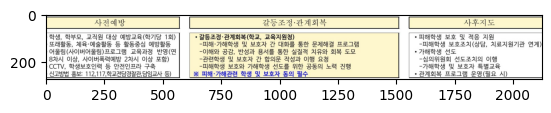

29
table: 병 명 인플루엔자 수두 유행성 이하선염 풍진 병원체 인플루엔자 바이러스 수두바이러스 멈프스바이러스 풍진바이러스 감염경로 인두분비물, 객담 → 비말감염 인두분비물 → 비말감염 타액 → 비말감염 인두분비물 → 비말감염 전염 가능 기간 (등교중지 기간) 해열제 없이 정상체온 회복 후 24시간 경과할때 모든 수포에 가피 형성될 때까지(약 7일) 증상발현 후 5일까지 (이하선종창 소실일 까지) 발진이 나타난 후 7일까지 (발진 소실 일까지) 유 행 성 각결막염 아데노바이러스 눈곱, 분변 → 접촉감염 격리 불필요(개인위생수칙) 성홍열 A군B군용혈성 연쇄상구균 인두분비물 → 비말감염 항생제 치료 시작하고 24시간까지 홍역 홍역바이러스 인두분비물 → 비말감염 발진이 나타난 후 4일까지 (해열 후 3일 경과까지)
----------------------------
summary: 주요 소아청소년기 바이러스성 감염병의 병원체, 감염경로, 전염기간 및 등교중지 기준 등을 정리한 표입니다. 인플루엔자, 수두, 유행성이하선염, 풍진, 유행성각결막염, 성홍열, 홍역 등의 질병에 대한 정보를 제공하고 있습니다.
----------------------------
html:


' 3 따 삐 i,언쓰 ] 따 므 | 736 = oI,뷰 죄 80 통 시 브답 e el od,|19| Sk I | |ou i 꼭 15079 220 | | =< ㅇ eV 122576 sl |
바 바 | <+,긴 오 꼬 바 아,비 4시 과 16 띠 나코,7 일 ) o X 돈 s 0 0 0 =3 |7 = 벗 벗 비
99 |20 700 인 야이 ),07696 | 움 개토 꼬 <| | 비 oo,히 | 피 고 닉,다솜 Wuww)z 춥 고 ;우소 g IR o) Lo |Nloto
_ 0 9,<| e|1Z|g 배 o 꼬 | 0 Ho,2규 ual | 바 꼬 이」닉,Era 드흠 | 아 헤 L= : LT ¢ T 2K sz = 떠 | ㅇ
. 0 oo o3 땐 o,<l 트 키 o 티 기 모,육 e K 30 」팬칫넙 T,T 6어 아 리 =| - 여 여 B 페 띠 ' 핀
보 190 s,": o, 혀곤 : 잔 | 물 좋 B bk",가 o we 바 끄 91,3 : 25 X < 혀 더 브 보 < | = o 료 배 ㅠ 5 | T 100
베 iojo,A_ 옹 | 홈 | g 190,o 1 〕〕_'」티근 비 21,X~ 뺀짜 버럼 뢰 스 _'7 0 에 싸 - ] 레 809 2|


----------------------------
image


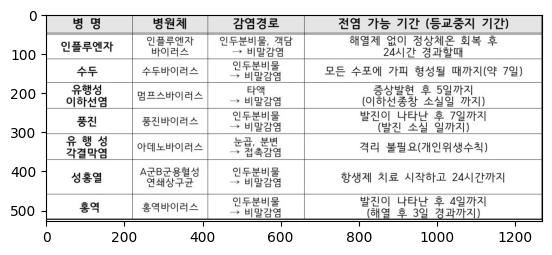

30
table: 구분 부정 청탁 금지 금품 등 수수 금지 제재 수준 비고 - 2년 이하 징역 - 3천만 원 이하 과태료 - 3년 이하 징역, 3천만 원 이하 벌금 - 1회 백만 원 또는 연 3백만 원 초과 수 - 청탁유형별 별도 제재기준 적용 수(직무 관련 여부 관계없음) - 수수 금액의 2~5배 과태료 - 5백만 원 이하 과태료 - 1회 1백만 원 이하 수수(직무 관련) - 외부 강의 초과 사례금 수수
----------------------------
summary: 이 표는 부정청탁 및 금품수수에 대한 제재 수준을 보여주고 있습니다. 주요 내용은 다음과 같습니다.

1. 부정청탁의 경우 2년 이하 징역 또는 3천만 원 이하 과태료가 부과됩니다.

2. 금품등 수수 금지 위반 시 3년 이하 징역 또는 3천만 원 이하 벌금이 부과됩니다. 1회 100만 원 또는 연 300만 원을 초과하여 수수한 경우 청탁유형별 별도 제재기준이 적용됩니다.

3. 수수 금액의 2배에서 5배 사이의 과태료가 부과될 수 있습니다.

4. 외부 강의 사례금을 초과 수수한 경우 500만 원 이하 과태료 또는 1회 100만 원 이하 수수액에 대한 제재가 있습니다.
----------------------------
html:


과,비 포,더 | 고
띠 ||0 mHroic| 과치,| DR M =B KOS| ¥ 으 리 | mR) M| 1 |,0 찌 K |5rEs G 뜨 IR w. 페 | 100 of e R [
= 시 배 가 o<k,때 T AW D 5 ol o 입메 48 E > | |,규 떨 ™ 마 움 갓 <<k 수그 수례 el B m.mmO_ﬂu 」0 \ 0. 160 뺀「} |zrok 핀 09 온유 ㅣ : |


----------------------------
image


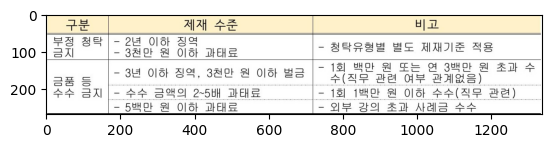

31
table: 구분 비밀보장 의무 위반 벌칙 비밀보장 대상 부패 방지 권익 위법 3년 이하의 징역 또는 3천만 원 이하의 벌금 · 부패행위, 행동강령 위반행위 신고자와 협조자* * 신고와 관련하여 진술 그 밖에 자료 제출 등의 방법으로 신고내용의 감사·수사 또는 조사에 조력한 자 공익 신고자 보호법 5년 이하의 징역 또는 5천만 원 이하의 벌금 · 공익신고자 등* * 공익신고자와 공익 신고에 대한 조사·수사·소송 및 진술·증언 하거나 자료를 제공한 사람
----------------------------
summary: 이 표는 비밀보장 의무 위반, 공익 신고자 보호법 위반에 대한 벌칙 내용과 보호 대상을 설명하고 있습니다. 비밀보장 의무 위반 시 3년 이하의 징역 또는 3천만 원 이하의 벌금이 부과되며, 부패행위 신고자와 관련자를 보호합니다. 공익 신고자 보호법 위반 시에는 5년 이하의 징역 또는 5천만 원 이하의 벌금이 부과되며, 공익신고자와 관련자를 보호합니다.
----------------------------
html:


「 ol | 이인 910 TS T oH ㅇ 뇌 | 낄 ) ™M,"때 0 2 . 9 Fm_.f X 0 버 , 고 amu,z_.__._mm_n_ = 삐뮤 뺀 | 더 × 오 o0 % 그 회 버 밖박눈 = M 버 > 위낯시| o "" 짓 T < 끓피감 * 붓이 화 , 99| AT *"
|,| . 더 |
,"3 110 세 ~d 레 4o pa = 내 3 | 10 T T 더 9, 더 *"
히 이 S 인 910 T2 10 o ㅇ 뇌 R 0 460,< ㄴ 시」__。」 g 거 둥끊툴 자재물 미 T 또 10
,


----------------------------
image


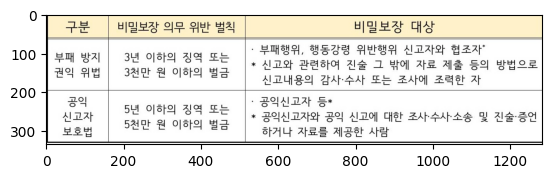

In [75]:
verbose = True
index = 0
if verbose:
    for table, summary in zip(table_info, table_summaries):

        if table_as_image:
            page_contents, table_as_html, img_base64 = table
        else: page_contents, table_as_html = table

        print ("============================")
        print (index)
        print (f'table: {page_contents}')
        print ("----------------------------")
        print (f'summary: {summary}')
        print ("----------------------------")
        print (f'html:')
        print_html(table_as_html)
        print ("----------------------------")
        if table_as_image and img_base64 is not None:
            print ("image")
            img = Image.open(BytesIO(base64.b64decode(img_base64)))
            plt.imshow(img)
            plt.show()
        index += 1


`요약`된 내용을 Document의 `page_content`로, `parsed table`은 metadata의 `origin_table`로 사용

In [76]:
tables_preprocessed = []

for origin, summary in zip(tables, table_summaries):
    metadata = origin.metadata
    metadata["origin_table"] = origin.page_content
    doc = Document(
        page_content=summary,
        metadata=metadata
    )
    tables_preprocessed.append(doc)
    
#tables_preprocessed, images_preprocessed


In [77]:
#to_pickle(tables_preprocessed, "./data/complex_pdf/pickle/tables_preprocessed.pkl")
#to_pickle(images_preprocessed, "./data/complex_pdf/pickle/images_preprocessed.pkl")
#docs = load_pickle("./data/complex_pdf/pickle/parsed_unstructured.pkl")

In [78]:
#tables_preprocessed = load_pickle("./data/complex_pdf/pickle/tables_preprocessed.pkl")
#images_preprocessed = load_pickle("./data/complex_pdf/pickle/images_preprocessed.pkl")

## 4. Index 생성

### Index 이름 결정

In [79]:
import boto3
from utils.ssm import parameter_store

In [ ]:
region=boto3.Session().region_name
pm = parameter_store(region)

In [ ]:
#index_name = "kb_complex_doc"
index_name = "summit-workshop-index" #summit-workshop-index-unstructured, #summit-workshop-index-unstructured-pymupdf, summit-workshop-index-unstructured-pymupdf-llama

In [ ]:
pm.put_params(
    key="opensearch_index_name",
    value=f'{index_name}',
    overwrite=True,
    enc=False
)

### Index 스키마 정의

In [ ]:
index_body = {
    'settings': {
        'analysis': {
            'analyzer': {
                'my_analyzer': {
                         'char_filter':['html_strip'],
                    'tokenizer': 'nori',
                    'filter': [
                        #'nori_number',
                        #'lowercase',
                        #'trim',
                        'my_nori_part_of_speech'
                    ],
                    'type': 'custom'
                }
            },
            'tokenizer': {
                'nori': {
                    'decompound_mode': 'mixed',
                    'discard_punctuation': 'true',
                    'type': 'nori_tokenizer'
                }
            },
            "filter": {
                "my_nori_part_of_speech": {
                    "type": "nori_part_of_speech",
                    "stoptags": [
                        "J", "XSV", "E", "IC","MAJ","NNB",
                        "SP", "SSC", "SSO",
                        "SC","SE","XSN","XSV",
                        "UNA","NA","VCP","VSV",
                        "VX"
                    ]
                }
            }
        },
        'index': {
            'knn': True,
            'knn.space_type': 'cosinesimil'  # Example space type
        }
    },
    'mappings': {
        'properties': {
            'metadata': {
                'properties': {
                    'source': {'type': 'keyword'},
                    'page_number': {'type':'long'},
                    'category': {'type':'text'},
                    'file_directory': {'type':'text'},
                    'last_modified': {'type': 'text'},
                    'type': {'type': 'keyword'},
                    'image_base64': {'type':'text'},
                    'origin_image': {'type':'text'},
                    'origin_table': {'type':'text'},
                }
            },
            'text': {
                'analyzer': 'my_analyzer',
                'search_analyzer': 'my_analyzer',
                'type': 'text'
            },
            'vector_field': {
                'type': 'knn_vector',
                'dimension': f"{dimension}" # Replace with your vector dimension
            }
        }
    }
}


## 5. LangChain OpenSearch VectorStore 생성 
### 선수 조건

#### [중요] 아래에 aws parameter store 에 아래 인증정보가 먼저 입력되어 있어야 합니다.

In [ ]:
opensearch_domain_endpoint = pm.get_params(
    key="opensearch_domain_endpoint",
    enc=False
)

opensearch_user_id = pm.get_params(
    key="opensearch_user_id",
    enc=False
)

opensearch_user_password = pm.get_params(
    key="opensearch_user_password",
    enc=True
)

In [ ]:
opensearch_domain_endpoint = opensearch_domain_endpoint
rag_user_name = opensearch_user_id
rag_user_password = opensearch_user_password

http_auth = (rag_user_name, rag_user_password) # Master username, Master password

### OpenSearch Client 생성

In [ ]:
from utils.opensearch import opensearch_utils

In [ ]:
aws_region = os.environ.get("AWS_DEFAULT_REGION", None)

os_client = opensearch_utils.create_aws_opensearch_client(
    aws_region,
    opensearch_domain_endpoint,
    http_auth
)

### 오픈 서치 인덱스 생성 
- 오픈 서치에 해당 인덱스가 존재하면, 삭제 합니다. 

In [ ]:
index_exists = opensearch_utils.check_if_index_exists(
    os_client,
    index_name
)

if index_exists:
    opensearch_utils.delete_index(
        os_client,
        index_name
    )

opensearch_utils.create_index(os_client, index_name, index_body)
index_info = os_client.indices.get(index=index_name)
print("Index is created")
pprint(index_info)

### 랭체인 인덱스 연결 오브젝트 생성

- [langchain.vectorstores.opensearch_vector_search.OpenSearchVectorSearch](https://api.python.langchain.com/en/latest/vectorstores/langchain.vectorstores.opensearch_vector_search.OpenSearchVectorSearch.html)

In [ ]:
from langchain.vectorstores import OpenSearchVectorSearch

In [ ]:
vector_db = OpenSearchVectorSearch(
    index_name=index_name,
    opensearch_url=opensearch_domain_endpoint,
    embedding_function=llm_emb,
    http_auth=http_auth, # http_auth
    is_aoss=False,
    engine="faiss",
    space_type="l2",
    bulk_size=100000,
    timeout=60
)
vector_db

### Chunking Strategy: Parent documents
* Chunk Size and Chunk Overlap Size

In [ ]:
from utils.chunk import parant_documents

In [ ]:
parent_chunk_size = 4096
parent_chunk_overlap = 0

child_chunk_size = 1024
child_chunk_overlap = 256

opensearch_parent_key_name = "parent_id"
opensearch_family_tree_key_name = "family_tree"

* Parent Chunking
    - create_parent_chunk() 아래와 같은 작업을 합니다.
    - all_docs 에 있는 문서를 parent_chunk_size 만큼으로 청킹 합니다.
    - Parent Chunk 에 두개의 메타 데이타를 생성 합니다.
        - family_tree: parent
        - parent_id : None

In [ ]:
parent_chunk_docs = parant_documents.create_parent_chunk(
    docs=texts,
    parent_id_key=opensearch_parent_key_name,
    family_tree_id_key=opensearch_family_tree_key_name,
    parent_chunk_size=parent_chunk_size,
    parent_chunk_overlap=parent_chunk_overlap
)
print(f'Number of parent_chunk_docs= {len(parent_chunk_docs)}')

* Insert doc into OpenSearch 

In [ ]:
%%time

parent_ids = vector_db.add_documents(
    documents = parent_chunk_docs, 
    vector_field = "vector_field",
    bulk_size = 1000000
)

In [ ]:
total_count_docs = opensearch_utils.get_count(os_client, index_name)
print("total count docs: ", total_count_docs)

* 삽입된 Parent Chunk 의 첫번째를 확인 합니다. family_tree, parent_id 의 값을 확인 하세요.

In [ ]:
def show_opensearch_doc_info(response):
    print("opensearch document id:" , response["_id"])
    print("family_tree:" , response["_source"]["metadata"]["family_tree"])
    print("parent document id:" , response["_source"]["metadata"]["parent_id"])
    print("parent document text: \n" , response["_source"]["text"])

response = opensearch_utils.get_document(os_client, doc_id = parent_ids[0], index_name = index_name)
show_opensearch_doc_info(response)

* Child Chunking
    - 아래의 create_child_chunk() 는 다음과 같은 작업을 합니다.
    - parent_chunk_docs 각각에 대해서 Child Chunk 를 생성 합니다. 
    - Child Chunk 에 두개의 메타 데이타를 생성 합니다.
        - family_tree: child
        - parent_id : parent 에 대한 OpenSearch document id

In [ ]:
# child_chunk_docs = create_child_chunk(parent_chunk_docs[0:1], parent_ids)
child_chunk_docs = parant_documents.create_child_chunk(
    child_chunk_size=child_chunk_size,
    child_chunk_overlap=child_chunk_overlap,
    docs=parent_chunk_docs,
    parent_ids_value=parent_ids,
    parent_id_key=opensearch_parent_key_name,
    family_tree_id_key=opensearch_family_tree_key_name
)

print(f"Number of child_chunk_docs= {len(child_chunk_docs)}")

In [ ]:
parent_id = child_chunk_docs[0].metadata["parent_id"]
print("child's parent_id: ", parent_id)
print("\n###### Search parent in OpenSearch")
response = opensearch_utils.get_document(os_client, doc_id = parent_id, index_name = index_name)
show_opensearch_doc_info(response)    

In [ ]:
child_chunk_docs[0]

### Manipulate table and image for parent documents
- set family_tree of table and image documents as "parent_table" and these kinds of types are included in searcable list (child, parent_table and parent_image) in parant document strategy.

In [ ]:
for table in tables_preprocessed:
    table.metadata["family_tree"], table.metadata["parent_id"] = "parent_table", "NA"

In [ ]:
for image in images_preprocessed:
    image.metadata["family_tree"], image.metadata["parent_id"] = "parent_image", "NA"

### Merge text, table and image

In [ ]:
from itertools import chain

In [ ]:
docs_preprocessed = list(chain(child_chunk_docs, tables_preprocessed, images_preprocessed))

* Insert doc into OpenSearch

In [ ]:
%%time

child_ids = vector_db.add_documents(
    documents=docs_preprocessed, 
    vector_field = "vector_field",
    bulk_size=1000000
)

print("length of child_ids: ", len(child_ids))

## 6. 검색 테스트

In [ ]:
from utils.rag import qa_chain
from utils.rag import prompt_repo, show_context_used
from langchain.callbacks.tracers import ConsoleCallbackHandler
from utils.rag import retriever_utils, OpenSearchHybridSearchRetriever

In [ ]:
opensearch_hybrid_retriever = OpenSearchHybridSearchRetriever(
    os_client=os_client,
    index_name=index_name,
    llm_text=llm_text, # llm for query augmentation in both rag_fusion and HyDE
    llm_emb=llm_emb, # Used in semantic search based on opensearch 

    # hybird-search debugger
    #hybrid_search_debugger = "semantic", #[semantic, lexical, None]
    
    # option for lexical
    minimum_should_match=0,
    filter=[],

    # option for search
    fusion_algorithm="RRF", # ["RRF", "simple_weighted"], rank fusion 방식 정의
    ensemble_weights=[.51, .49], # [for semantic, for lexical], Semantic, Lexical search 결과에 대한 최종 반영 비율 정의
    reranker=False, # enable reranker with reranker model
    #reranker_endpoint_name=endpoint_name, # endpoint name for reranking model
    parent_document=True, # enable parent document
    
    # option for complex pdf consisting of text, table and image
    complex_doc=True,
    
    # option for async search
    async_mode=True,

    # option for output
    k=7, # 최종 Document 수 정의
    verbose=False,

)

### 하이브리드 검색

In [ ]:
%%time
#query = "수익률 그래프 설명해줘"
#query = "만기상환금액 알려줘"
query = "교육목표 알려줘"
search_hybrid_result, tables, images = opensearch_hybrid_retriever.get_relevant_documents(query)
#show_context_used(search_hybrid_result)

In [ ]:
show_context_used(search_hybrid_result)